**Identifying features that influence low-income student success**

by Ben Lacar
<br>
March 2019

Next:'
- re-assess correlated features, apply VIF (if greater than 10 then remove)
- update based on feedback


other technical checks:
- try both random forest and linear/ridge regression (add further explanation on RF) - Shagayegh
- apply k-fold cross-validation

Nice to have (later)
- Geospatial data
- Updated census info
- investigate relationship of demographics to COVID cases ([data from NYTimes](https://github.com/nytimes/covid-19-data))

## Introduction

I investigated features of high schools that promote the college eligibility rates of low-income students. The hope is to identify features that can be affected by policy changes to help low income students graduate and become college eligible at a higher rate. I focused on CA public high schools.

To obtain features of schools that could be meaningful for my target, I pulled in data from various sources. I obtained census data for each zip code in the state of CA. I then pulled in information from the CA public schools database. Finally, I used data from GreatSchools both with an API and with custom functions (example of one high school shown [here](https://www.greatschools.org/california/chula-vista/6279-Bonita-Vista-Senior-High-School/#Low-income_students*Graduation_rates*UC_CSU_eligibility)).

In [1]:
# Import packages

# Web scraping
import os
import urllib.request
import requests
from io import StringIO
from bs4 import BeautifulSoup

# Use xml package for GreatSchools data
import xml.etree.ElementTree as ET

# Dataframe munging and statistics
import re
import pandas as pd
import numpy as np
from scipy.stats import ttest_ind

# Data visualization
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

%matplotlib inline

# Unsupervised learning
from sklearn.decomposition import PCA

# Linear regression
from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn import metrics
from sklearn.model_selection import train_test_split

# classification approaches
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

# Stats
from scipy.stats import mannwhitneyu
from scipy.stats import ttest_ind
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats import multitest

In [2]:
# Colors and formatting
# Got Google theme html colors from here https://imagecolorpicker.com
B_beige = "#CDA577"
B_brown = "#643E34"
B_slate = "#3F5B66"
B_dkgray = "#5A7E8E"
B_ltgray = "#6D949B"
B_green = "#01CB8B"
B_lime = "#D3F04A"

B_colors = [B_beige, B_brown, B_slate, B_dkgray, B_ltgray, B_green, B_lime]
B_colors_cat = [B_beige, B_green, B_brown, B_ltgray, B_slate, B_lime, B_dkgray]

# Code formatting Jupyter black
%load_ext nb_black

<IPython.core.display.Javascript object>

In [3]:
parent_path = "/Users/lacar/Documents/Data_science/Jupyter_notebooks/Education_study/"
os.chdir(parent_path)
os.getcwd()

'/Users/lacar/Documents/Data_science/Jupyter_notebooks/Education_study'

<IPython.core.display.Javascript object>

## Data sources
1. Selected economic characteristics from census for CA by zip code (median income, employment status, worker class, education level)
2. School information (public, charter status, magnet status, address)
3. School enrollment and dropout data (by grades for ethnicity, gender)
4. GreatSchools website

### Data source 1: Population data by zip code (factfinder.census.gov)

Example from site [here](https://factfinder.census.gov/faces/tableservices/jsf/pages/productview.xhtml?src=bkmk)

In [4]:
df_demo_info = pd.read_csv("data/ACS_15_5YR_DP03_with_ann.csv")
df_demo_info.head()

,Id,Id2,Geography,Estimate; EMPLOYMENT STATUS - Population 16 years and over,Margin of Error; EMPLOYMENT STATUS - Population 16 years and over,Percent; EMPLOYMENT STATUS - Population 16 years and over,Percent Margin of Error; EMPLOYMENT STATUS - Population 16 years and over,Estimate; EMPLOYMENT STATUS - Population 16 years and over - In labor force,Margin of Error; EMPLOYMENT STATUS - Population 16 years and over - In labor force,Percent; EMPLOYMENT STATUS - Population 16 years and over - In labor force,...,Percent; PERCENTAGE OF FAMILIES AND PEOPLE WHOSE INCOME IN THE PAST 12 MONTHS IS BELOW THE POVERTY LEVEL - 65 years and over,Percent Margin of Error; PERCENTAGE OF FAMILIES AND PEOPLE WHOSE INCOME IN THE PAST 12 MONTHS IS BELOW THE POVERTY LEVEL - 65 years and over,Estimate; PERCENTAGE OF FAMILIES AND PEOPLE WHOSE INCOME IN THE PAST 12 MONTHS IS BELOW THE POVERTY LEVEL - 65 years and over - People in families,Margin of Error; PERCENTAGE OF FAMILIES AND PEOPLE WHOSE INCOME IN THE PAST 12 MONTHS IS BELOW THE POVERTY LEVEL - 65 years and over - People in families,Percent; PERCENTAGE OF FAMILIES AND PEOPLE WHOSE INCOME IN THE PAST 12 MONTHS IS BELOW THE POVERTY LEVEL - 65 years and over - People in families,Percent Margin of Error; PERCENTAGE OF FAMILIES AND PEOPLE WHOSE INCOME IN THE PAST 12 MONTHS IS BELOW THE POVERTY LEVEL - 65 years and over - People in families,Estimate; PERCENTAGE OF FAMILIES AND PEOPLE WHOSE INCOME IN THE PAST 12 MONTHS IS BELOW THE POVERTY LEVEL - 65 years and over - Unrelated individuals 15 years and over,Margin of Error; PERCENTAGE OF FAMILIES AND PEOPLE WHOSE INCOME IN THE PAST 12 MONTHS IS BELOW THE POVERTY LEVEL - 65 years and over - Unrelated individuals 15 years and over,Percent; PERCENTAGE OF FAMILIES AND PEOPLE WHOSE INCOME IN THE PAST 12 MONTHS IS BELOW THE POVERTY LEVEL - 65 years and over - Unrelated individuals 15 years and over,Percent Margin of Error; PERCENTAGE OF FAMILIES AND PEOPLE WHOSE INCOME IN THE PAST 12 MONTHS IS BELOW THE POVERTY LEVEL - 65 years and over - Unrelated individuals 15 years and over
0,8600000US89010,89010,ZCTA5 89010,484,125,484,(X),233,92,48.1,...,19.7,17.5,(X),(X),21.2,16.2,(X),(X),39.1,23.2
1,8600000US89019,89019,ZCTA5 89019,1663,527,1663,(X),852,310,51.2,...,10.1,15,(X),(X),0,2.2,(X),(X),24.9,16.8
2,8600000US89046,89046,ZCTA5 89046,404,136,404,(X),175,96,43.3,...,10.9,13.4,(X),(X),41,34,(X),(X),40.1,20.6
3,8600000US89060,89060,ZCTA5 89060,8136,629,8136,(X),3473,514,42.7,...,10.7,5.1,(X),(X),18.5,6.9,(X),(X),23.9,6.2
4,8600000US89061,89061,ZCTA5 89061,4492,529,4492,(X),1889,340,42.1,...,2.5,3,(X),(X),3.2,3,(X),(X),18.2,11.8


<IPython.core.display.Javascript object>

In [7]:
for i in df_demo_info['Id2'].unique():
    df_temp = df_demo_info[df_demo_info['Id2']==i]
    if df_temp.shape[0] > 1:
        df_temp
        break

In [8]:
df_demo_info['Id2'].unique()

array([89010, 89019, 89046, ..., 96155, 96161, 97635])

In [9]:
def import_census_data(csv_file):
    df_demo_info = pd.read_csv('data/ACS_15_5YR_DP03_with_ann.csv')
    df_demo_info.set_index('Id2', inplace=True) # set the zip code as the index value
    
    # Rename demographic information columns to improve readability
    demo_column_names = ({'Estimate': 'Est.',
                      'Percent': '%',
                      'EMPLOYMENT STATUS': 'EMPLOY_STATUS',
                      'Population': 'Pop.',
                      'Margin of Error': 'error_margin',
                      'and over': 'and up',
                      'years':'yrs',
                      'COMMUTING TO WORK': 'WORK_COMMUTE',
                      'CLASS OF WORKER': 'WORKER_CLASS',
                      'INCOME AND BENEFITS (IN 2015 INFLATION-ADJUSTED DOLLARS)': 'INCOME_BENEFITS',
                      'HEALTH INSURANCE COVERAGE': 'HEALTH_INS_COVERAGE',
                      '(dollars)': '($)',
                      'PERCENTAGE OF FAMILIES AND PEOPLE WHOSE INCOME IN THE PAST 12 MONTHS IS BELOW THE POVERTY LEVEL': '%-AGE_FAMILIES_INCOME_BELOW_POVERTY',
                      '18 to 64': '18-64',
                      'with': 'w/',
                      'With': 'w/',
                      'under 18': '<18',
                      'population': 'pop.',
                      'health insurance coverage': 'health ins coverage'
                     })

    # Replace words in column names
    df_temp = pd.DataFrame()
    df_temp['old_col_names'] = df_demo_info.columns
    df_temp['new_col_names'] = None
    
    for i in range(len(df_temp)):
        string = df_temp.loc[i,'old_col_names']
        for key in demo_column_names:
            string = string.replace(key, demo_column_names[key])
        df_temp.loc[i, 'new_col_names'] = string
    df_demo_info.columns = df_temp['new_col_names']

    # Remove columns that contain "error" since it won't be used in the analysis moving forward.
    mask_col_w_error = df_demo_info.columns.str.contains('error')
    df_demo_info = df_demo_info.copy().loc[:,~mask_col_w_error]

    # Remove columns where most values are (X) 
    mask_of_X = df_demo_info.iloc[:,274]!='(X)'

    mask_of_X = df_demo_info !='(X)'
    samples_w_values = np.sum(mask_of_X)
    mask_columns_samples_wvalues = np.sum(mask_of_X) > 1400

    # Demographic info with values, no errors
    df_demo_info = df_demo_info.copy().loc[:,mask_columns_samples_wvalues]
    
    # Focus on features shown in percentages (other code were things I tried)
    mask_perc = df_demo_info.columns.str.startswith('%')
    #mask_est = df_test.columns.str.startswith('Est.')
    # df_test_only_numbers = df_test.loc[:, (mask_perc + mask_est)].copy()

    # Convert all strings with a dash into NaN
    df_demo_perc_only = df_demo_info.loc[:, mask_perc].copy()

    # Convert all strings with a dash into NaN
    mask_dash = (df_demo_perc_only=='-')  
    mask_x = (df_demo_perc_only=='(X)') 
    df_demo_perc_only[mask_dash | mask_x] = np.nan

    # Convert rest of values from string to floating point
    df_demo_perc_only = df_demo_perc_only.astype('float64', copy=False)
    
    # Identify features where most (90%) of the values are < 100%
    df_temp = pd.DataFrame()
    df_temp['feature'] = None
    df_temp['min'] = None
    df_temp['max'] = None
    df_temp['prop_<100%'] = None

    # Check range of values and determine the proportion less than 100%
    for index, value in enumerate(df_demo_perc_only.columns):
        try:
            df_temp.loc[index, 'feature'] = value
            df_temp.loc[index, ['min', 'max']] = (df_demo_perc_only[value].min(), df_demo_perc_only[value].max())
            # For next line, NaNs are not counted
            df_temp.loc[index, 'prop_<100%'] = sum(df_demo_perc_only[value] <= 100)/len(df_demo_perc_only)
        except:
            continue

    # Get features where most (90%) of the values are < 1 (100%)
    valid_features = df_temp.loc[df_temp['prop_<100%'] >= 0.9, 'feature'].tolist()
    
    # Add the identifying columns back in and include those about income
    income_columns = df_demo_info.columns[df_demo_info.columns.str.contains('income')].tolist()
    
    df_demo_info_perc = pd.merge(df_demo_info[['Id', 'Geography'] + income_columns], df_demo_perc_only[valid_features],
                                  left_index=True, right_index=True)
    
    # Remove rows where 90% of the census info for that zip code is missing
    df_demo_info_final = df_demo_info_perc[df_demo_info_perc.count(axis=1)/df_demo_info_perc.shape[1] >= 0.9]
    
    return df_demo_info_final

In [140]:
def initial_analysis(df):
    """
    Given a dataframe produces a simple report on initial data analytics
    Params:
        - df 
    Returns:
        - Shape of dataframe records and columns
        - Columns and data types
    """
    print("Report of Initial Data Analysis:\n")
    print(f"Shape of dataframe: {df.shape}")
    print(f"Features and Data Types: \n {df.dtypes}")

In [10]:
df_census = import_census_data('ACS_15_5YR_DP03_with_ann.csv')

#### Broad categories in census columns


In [1165]:
# Census columns that start with '%'
col_census_pct = df_state_info_gs_census.columns[df_state_info_gs_census.columns.str.startswith('%')]
# Broad categories in pct census columns
print(set([i.split('-')[0] for i in col_census_pct.tolist()]))

{'%; INDUSTRY ', '%; WORK_COMMUTE ', '%; OCCUPATION ', '%; WORKER_CLASS ', '%; HEALTH_INS_COVERAGE ', '%; %', '%; EMPLOY_STATUS ', '%; INCOME_BENEFITS '}


In [91]:
# Census columns that start with '%'
col_census_pct = df_state_info_gs_census.columns[df_state_info_gs_census.columns.str.startswith('%')]
# Broad categories in pct census columns
print(set([i.split('-')[0].lower() for i in col_census_pct.tolist()]))

{'%; occupation ', '%; industry ', '%; income_benefits ', '%; %', '%; work_commute ', '%; health_ins_coverage ', '%; employ_status ', '%; worker_class '}


In [1166]:
# Census columns that start with 'Est'
col_census_est = df_state_info_gs_census.columns[df_state_info_gs_census.columns.str.startswith('Est')]
col_census_est

Index(['Est.; INCOME_BENEFITS - Total households - Median household income ($)',
       'Est.; INCOME_BENEFITS - Total households - Mean household income ($)',
       'Est.; INCOME_BENEFITS - w/ Social Security - Mean Social Security income ($)',
       'Est.; INCOME_BENEFITS - w/ retirement income',
       'Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($)',
       'Est.; INCOME_BENEFITS - w/ cash public assistance income',
       'Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)',
       'Est.; INCOME_BENEFITS - Families - Median family income ($)',
       'Est.; INCOME_BENEFITS - Families - Mean family income ($)',
       'Est.; INCOME_BENEFITS - Per capita income ($)',
       'Est.; INCOME_BENEFITS - Nonfamily households - Median nonfamily income ($)',
       'Est.; INCOME_BENEFITS - Nonfamily households - Mean nonfamily income ($)'],
      dtype='object')

### Data Source 2: School information (public, charter status, magnet, address) 

- Import the school info and extract the 5 digit code for each school district

In [863]:
def import_school_info():
    # url = 'ftp://ftp.cde.ca.gov/demo/schlname/pubschls.xls'  # old url
    url = (
        "https://www.cde.ca.gov/SchoolDirectory/report?rid=dl1&tp=xlsx&ict=Y"  # new url
    )
    socket = urllib.request.urlopen(url)
    df = pd.read_excel(socket, skiprows=5)

    # Remove last row which has string and Nas (total records row)
    df = df.iloc[:-1]
    # Change CDSCode column from string to integer for later merging
    df["CDSCode"] = df["CDSCode"].astype("int")

    # Have the zip code format match the census format for later merging
    df["zip_code"] = df["Zip"].str.split("-", expand=True).iloc[:, 0]
    # Deal with missing data and change type to int64 so it can be merged
    df["zip_code"] = df["zip_code"].replace("No Data", 0).fillna(0).astype(np.int64)

    return df

<IPython.core.display.Javascript object>

In [864]:
df_school_info = import_school_info()

ImportError: Missing optional dependency 'xlrd'. Install xlrd >= 1.0.0 for Excel support Use pip or conda to install xlrd.

<IPython.core.display.Javascript object>

In [ ]:
df_school_info.columns

In [851]:
# Test school
df_school_info[df_school_info['School'].str.contains('Bonita Vista')]

,CDSCode,NCESDist,NCESSchool,StatusType,County,District,School,Street,StreetAbr,City,...,AdmLName1,AdmEmail1,AdmFName2,AdmLName2,AdmEmail2,AdmFName3,AdmLName3,AdmEmail3,LastUpDate,zip_code
12992,37684113730405,0638640,06475,Active,San Diego,Sweetwater Union High,Bonita Vista Senior High,751 Otay Lakes Road,751 Otay Lakes Rd.,Chula Vista,...,Del Rosario,roman.delrosario@sweetwaterschools.org,No Data,No Data,No Data,No Data,No Data,No Data,2019-02-13,91913
13011,37684116059745,0638640,06474,Active,San Diego,Sweetwater Union High,Bonita Vista Middle,650 Otay Lakes Road,650 Otay Lakes Rd.,Chula Vista,...,Kramer,teresa.kramer@sweetwaterschools.org,No Data,No Data,No Data,No Data,No Data,No Data,2019-02-13,91910


In [852]:
df_school_info.shape

(18073, 52)

In [855]:
df_school_info.groupby('SOCType')['SOCType'].count()

SOCType
Adult Education Centers                       563
Alternative Schools of Choice                 521
Continuation High Schools                     757
County Community                              509
District Community Day Schools                621
Elemen Schools In 1 School Dist. (Public)     291
Elementary Schools (Public)                  7688
High Schools (Public)                        1817
High Schools In 1 School Dist. (Public)        11
Intermediate/Middle Schools (Public)         1668
Junior High Schools (Public)                  124
Juvenile Court Schools                        254
K-12 Schools (Public)                         554
No Data                                      1390
Opportunity Schools                           124
Other County Or District Programs              11
Preschool                                     274
ROC/ROP                                        86
Special Education Schools (Public)            764
State Special Schools                     

In [853]:
df_school_info.groupby('StatusType')['StatusType'].count()

StatusType
Active     11751
Closed      4869
Merged      1444
Pending        9
Name: StatusType, dtype: int64

In [854]:
df_school_info.groupby('Charter')['Charter'].count()

Charter
N          14726
No Data     1390
Y           1957
Name: Charter, dtype: int64

In [856]:
df_school_info.groupby('Magnet')['Magnet'].count()

Magnet
N          10433
No Data     7093
Y            547
Name: Magnet, dtype: int64

### Data Source 3:  School enrollment and dropout data

- Data provided by grades and for ethnicity, gender

In [198]:
def import_enrollment_data(year):
    baseUrl_1 = "http://dq.cde.ca.gov/dataquest/dlfile/dlfile.aspx?cLevel=School&cYear="
    baseUrl_2 = "&cCat=Dropouts&cPage=filesdropouts"
    url = baseUrl_1 + year + baseUrl_2  # create url including selected year
    session = requests.Session()
    r = session.post(url)
    data = StringIO(r.text)
    df = pd.read_csv(data, sep="\t")

    # Extract demographic enrollment for each school
    df_ethnicity = df.groupby(["CDS_CODE", "ETHNIC"]).agg(sum)
    df_ethnicity.reset_index(inplace=True)
    df_ethnicity_enroll = pd.pivot_table(
        df_ethnicity, index="CDS_CODE", columns="ETHNIC", values="ETOT"
    ).fillna(0)

    # Extract ethnic demographic dropout for each school
    df_ethnicity_dropout = pd.pivot_table(
        df_ethnicity, index="CDS_CODE", columns="ETHNIC", values="DTOT"
    ).fillna(0)

    # Group by to get collapsed enrollment/dropout for each school
    df = (
        df.loc[:, "CDS_CODE":"DTOT"].groupby("CDS_CODE").agg(sum).drop("ETHNIC", axis=1)
    )

    # Filter schools having at least 25 students in each of grades 9-12
    df = df[(df["E9"] > 25) & (df["E10"] > 25) & (df["E11"] > 25) & (df["E12"] > 25)]

    # Merge the ethnic demographic enrollment data
    df_w_enroll = pd.merge(df, df_ethnicity_enroll, left_index=True, right_index=True)
    df_w_enroll_and_dropout = pd.merge(
        df_w_enroll, df_ethnicity_dropout, left_index=True, right_index=True
    )

    return df_w_enroll_and_dropout

<IPython.core.display.Javascript object>

In [199]:
df_enrollment = import_enrollment_data(
    "2015-16"
)  # using this year to match census data

<IPython.core.display.Javascript object>

In [200]:
df_enrollment.head()

,E7,E8,E9,E10,E11,E12,EUS,ETOT,D7,D8,...,9_x,0_y,1_y,2_y,3_y,4_y,5_y,6_y,7_y,9_y
CDS_CODE,,,,,,,,,,,,,,,,,,,,,
1100170112607,0,0,115,108,96,88,0,407,0,0,...,5.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0
1316170131763,36,26,37,39,50,82,0,208,0,0,...,5.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0
1611190106401,0,0,44,47,47,37,0,175,0,0,...,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1611190130229,0,0,429,440,432,381,36,1718,0,0,...,67.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0
1611190130609,57,60,47,53,52,52,0,204,0,0,...,18.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


<IPython.core.display.Javascript object>

#### Merge enrollment and school info data together

In [201]:
df_enrollment_w_info = pd.merge(
    df_enrollment, df_school_info, how="left", left_index=True, right_on="CDSCode"
).set_index("CDSCode")

NameError: name 'df_school_info' is not defined

<IPython.core.display.Javascript object>

In [22]:
df_enrollment_w_info.head()

,E7,E8,E9,E10,E11,E12,EUS,ETOT,D7,D8,...,AdmLName1,AdmEmail1,AdmFName2,AdmLName2,AdmEmail2,AdmFName3,AdmLName3,AdmEmail3,LastUpDate,zip_code
CDSCode,,,,,,,,,,,,,,,,,,,,,
1100170112607,0,0,115,108,96,88,0,407,0,0,...,Gordon,eve@envisionacademy.org,No Data,No Data,No Data,No Data,No Data,No Data,2019-07-01,94612.0
1316170131763,36,26,37,39,50,82,0,208,0,0,...,Gonzales,lgonzales@csdf-cde.ca.gov,No Data,No Data,No Data,No Data,No Data,No Data,2019-02-13,94538.0
1611190106401,0,0,44,47,47,37,0,175,0,0,...,Corbally,tcorbally@alamedaunified.org,No Data,No Data,No Data,No Data,No Data,No Data,2019-02-13,94501.0
1611190130229,0,0,429,440,432,381,36,1718,0,0,...,Ithurburn,rithurburn@alamedaunified.org,No Data,No Data,No Data,No Data,No Data,No Data,2019-08-17,94501.0
1611190130609,57,60,47,53,52,52,0,204,0,0,...,Goodreau,jeremy.goodreau@alamedaclc.org,Annalisa,Moore,annalisa.moore@clcschools.org,No Data,No Data,No Data,2019-02-13,94501.0


In [23]:
def add_enrollment_dropout_ethnicity_percentages(df):
    dict_ethnicity = ({0: "Not reported", 1: "Native Amer/Alaska Native", 2: "Asian",
                       3: "Pacific Islander", 4:"Filipino", 5: "Hispanic",
                       6: "African American", 7: "White", 9: "Two or More Races"})
    
    for key, value in dict_ethnicity.items():
        df['%_enrolled_of_total_' + value] = 100*(df[str(key) + '_x']/df['ETOT'])   # Percent enrolled in the school
        df['%_dropout_within_' + value ] = 100*(df[str(key) + '_y']/df[str(key) + '_x'])    # Percent dropout within that ethnicity enrolled
    
    df['%_overall_dropout'] = 100*(df['DTOT']/df['ETOT'])
    
    columns_to_drop = (['E7', 'E8', 'EUS', 'D7', 'D8', 'DUS', 'AdmFName2',
                        'AdmLName2', 'AdmEmail2', 'AdmFName3', 'AdmLName3', 'AdmEmail3'])
    df = df.drop(columns_to_drop, axis=1)
   
    return df

In [24]:
df_enrollment_w_ethnicity_perc = add_enrollment_dropout_ethnicity_percentages(df_enrollment_w_info)

In [25]:
df_enrollment_w_ethnicity_perc.head()

,E9,E10,E11,E12,ETOT,D9,D10,D11,D12,DTOT,...,%_dropout_within_Filipino,%_enrolled_of_total_Hispanic,%_dropout_within_Hispanic,%_enrolled_of_total_African American,%_dropout_within_African American,%_enrolled_of_total_White,%_dropout_within_White,%_enrolled_of_total_Two or More Races,%_dropout_within_Two or More Races,%_overall_dropout
CDSCode,,,,,,,,,,,,,,,,,,,,,
1100170112607,115,108,96,88,407,0,1,1,0,2,...,0.0,51.351351,0.956938,38.329238,0.000000,3.194103,0.000000,1.228501,0.0,0.491400
1316170131763,37,39,50,82,208,0,0,0,3,3,...,0.0,50.961538,0.943396,10.576923,4.545455,24.038462,0.000000,2.403846,20.0,1.442308
1611190106401,44,47,47,37,175,0,0,0,0,0,...,0.0,8.571429,0.000000,4.000000,0.000000,12.571429,0.000000,2.285714,0.0,0.000000
1611190130229,429,440,432,381,1718,0,0,1,3,4,...,0.0,11.874272,0.490196,6.519208,0.000000,31.082654,0.374532,3.899884,0.0,0.232829
1611190130609,47,53,52,52,204,0,0,0,1,1,...,0.0,17.647059,0.000000,10.294118,0.000000,38.235294,0.000000,8.823529,0.0,0.490196


### Merge school enrollment data and census data

In [26]:
df_school_demographics = pd.merge(df_census, df_enrollment_w_ethnicity_perc, left_index=True, right_on='zip_code')

In [27]:
# Sanity check - look at my high school's zip code
df_school_demographics[df_school_demographics['zip_code']==91913]

,Id,Geography,Est.; INCOME_BENEFITS - Total households - Median household income ($),Est.; INCOME_BENEFITS - Total households - Mean household income ($),Est.; INCOME_BENEFITS - w/ Social Security - Mean Social Security income ($),Est.; INCOME_BENEFITS - w/ retirement income,%; INCOME_BENEFITS - w/ retirement income_x,Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($),Est.; INCOME_BENEFITS - w/ cash public assistance income,%; INCOME_BENEFITS - w/ cash public assistance income_x,...,%_dropout_within_Filipino,%_enrolled_of_total_Hispanic,%_dropout_within_Hispanic,%_enrolled_of_total_African American,%_dropout_within_African American,%_enrolled_of_total_White,%_dropout_within_White,%_enrolled_of_total_Two or More Races,%_dropout_within_Two or More Races,%_overall_dropout
CDSCode,,,,,,,,,,,,,,,,,,,,,
37684110111831,8600000US91913,ZCTA5 91913,84469,89909,14467,2178,15.9,31338,211,1.5,...,0.189394,53.552997,0.444774,6.470822,0.613497,7.344184,3.243243,8.813021,0.900901,0.635173
37684113730405,8600000US91913,ZCTA5 91913,84469,89909,14467,2178,15.9,31338,211,1.5,...,0.000000,67.748397,0.354820,3.084936,0.000000,11.538462,0.347222,6.971154,0.574713,0.320513
37684113731627,8600000US91913,ZCTA5 91913,84469,89909,14467,2178,15.9,31338,211,1.5,...,0.000000,64.509880,0.660661,4.029446,0.000000,4.920573,0.787402,6.431616,0.000000,0.464936


In [28]:
# Sanity check - Palo Alto zip code
df_school_demographics[df_school_demographics['zip_code']==94301]

,Id,Geography,Est.; INCOME_BENEFITS - Total households - Median household income ($),Est.; INCOME_BENEFITS - Total households - Mean household income ($),Est.; INCOME_BENEFITS - w/ Social Security - Mean Social Security income ($),Est.; INCOME_BENEFITS - w/ retirement income,%; INCOME_BENEFITS - w/ retirement income_x,Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($),Est.; INCOME_BENEFITS - w/ cash public assistance income,%; INCOME_BENEFITS - w/ cash public assistance income_x,...,%_dropout_within_Filipino,%_enrolled_of_total_Hispanic,%_dropout_within_Hispanic,%_enrolled_of_total_African American,%_dropout_within_African American,%_enrolled_of_total_White,%_dropout_within_White,%_enrolled_of_total_Two or More Races,%_dropout_within_Two or More Races,%_overall_dropout
CDSCode,,,,,,,,,,,,,,,,,,,,,
43696414335782,8600000US94301,ZCTA5 94301,142168,219868,21971,1096,15.4,51404,95,1.3,...,0.0,9.378134,1.604278,3.30993,1.515152,48.946841,0.409836,5.466399,0.0,0.451354


In [29]:
print('number of CA zip codes with school info: ', len(df_school_demographics['zip_code'].unique()))


number of CA zip codes with school info:  849


### Data Source 4: GreatSchools

https://www.greatschools.org/api/docs/technical-overview/
<br>
https://www.greatschools.org/gk/about/api-terms-use/

Obtained information through API and scraping html with BeautifulSoup

In [ ]:
# BeautifulSoup documentation
# https://www.crummy.com/software/BeautifulSoup/bs4/doc/

# prettify makes it a little easier to read
print(soup.prettify())

#### Get basic info including URLs for each school using API

sample url:
    'https://www.greatschools.org/california/chula-vista/6279-Bonita-Vista-Senior-High-School/'

In [33]:
def get_base_gs_school_info(school):
    my_gs_api = 'hidden'
    school_1st_try = school.strip().replace(' ', '-')
    #print('school search term: ', school_1st_try)
    query_school = 'https://api.greatschools.org/search/schools?key=' + my_gs_api + '&state=CA&q=' + school_1st_try
    url = query_school
    #url = query_string
    socket = urllib.request.urlopen(url)
    document2 = urllib.request.urlopen(url).read().decode()
    tree = ET.fromstring(document2)
    district_search_term = ' '.join(district.split(' ')[0:2])
    for child in tree:
        tag_school = []
        text_school = []
        for element in child:
            tag_school.append(element.tag)
            text_school.append(element.text)
        df = pd.DataFrame({'tags':tag_school, 'text':text_school})
        df = df.set_index('tags')
        # This if statement is to avoid similar named schools in different districts
        if df['text'].str.contains(district_search_term).sum()>0:
            break
    # This if statement is to stop searching if information for one school is found
    if (len(df) < 24):
        df = df
    else:
        # Take the text before the first space/hyphen
        school_2nd_try = school.split(' ')[0]
        #print('school search term, second if: ', school_2nd_try)
        query_school = 'https://api.greatschools.org/search/schools?key=' + my_gs_api + '&state=CA&q=' + school_2nd_try
        url = query_school
        #url = query_string
        socket = urllib.request.urlopen(url)
        document2 = urllib.request.urlopen(url).read().decode()
        tree = ET.fromstring(document2)
        for child in tree:
            tag_school = []
            text_school = []
            for element in child:
                tag_school.append(element.tag)
                text_school.append(element.text)
            df = pd.DataFrame({'tags':tag_school, 'text':text_school})
            df = df.set_index('tags')
            if df['text'].str.contains(district_search_term).sum()>0:
                break
        if (len(df) < 24):
            df = df
        else:
            # Remove ""Preparatory", "Accelerated", "Charter", "Academy"
            textlist2strip = ['Preparatory', 'Accelerated', 'Charter', 'Academy']
            for text2strip in textlist2strip:
                school = school.replace(text2strip, '')
            school_3rd_try = school.strip().replace(' ', '-')
            #print('school search term, third if: ', school_3rd_try)
            query_school = 'https://api.greatschools.org/search/schools?key=' + my_gs_api + '&state=CA&q=' + school_3rd_try
            url = query_school
            #url = query_string
            socket = urllib.request.urlopen(url)
            document2 = urllib.request.urlopen(url).read().decode()
            tree = ET.fromstring(document2)
            for child in tree:
                    tag_school = []
                    text_school = []
                    for element in child:
                        tag_school.append(element.tag)
                        text_school.append(element.text)
                    df = pd.DataFrame({'tags':tag_school, 'text':text_school})
                    df = df.set_index('tags')
                    # This if statement is to avoid similar named schools in different districts
                    if df['text'].str.contains(district_search_term).sum()>0:
                        break
            if (len(df) < 24):
                df = df

    return df

##### Testing with Sweetwater Union

In [33]:
# Filtering to get only active, public high schools in SUHSD
df_school_info_sd = df_school_info[df_school_info['County']=='San Diego']
df_school_info_sd_schools = df_school_info_sd[df_school_info_sd['School']!='No Data']
df_school_info_sd_schools = df_school_info_sd_schools[df_school_info_sd_schools['StatusType']=='Active']
df_school_info_sd_schools = df_school_info_sd_schools[df_school_info_sd_schools['SOCType']=='High Schools (Public)']
df_school_info_sd_schools_su = df_school_info_sd_schools[df_school_info_sd_schools['District'].str.contains('Sweetwater')]

In [106]:
# Loop through each school in the district to get information
df_district = pd.DataFrame()

district = 'Sweetwater Union High'
for index, school in enumerate(df_school_info_sd_schools_su['School']):
    # Limit to high schools
    if 'High' in school:
        df = get_base_gs_school_info(school)
        #school_info_list.append(df)
        if len(df_district.columns) < 1:
            df_district = df
            df_district.columns = [school]
        else:
            df_district[school] = df
        print(school, df.shape)

        # Transpose
df_district_tp = df_district.T

Olympian High (23, 1)
Southwest Senior High (23, 1)
Bonita Vista Senior High (23, 1)
Castle Park Senior High (23, 1)
Eastlake High (23, 1)
Chula Vista Senior High (23, 1)
San Ysidro High (23, 1)
Otay Ranch Senior High (23, 1)
Hilltop Senior High (23, 1)
Mar Vista Senior High (23, 1)
Sweetwater High (23, 1)
Montgomery Senior High (23, 1)


##### Testing with LA Unified

In [1184]:
# Filtering to get only active, public high schools in LA Unified School District
df_school_info_LA = df_school_info[df_school_info['County']=='Los Angeles']
df_school_info_LA_schools = df_school_info_LA[df_school_info_LA['School']!='No Data']
df_school_info_LA_schools = df_school_info_LA_schools[df_school_info_LA_schools['StatusType']=='Active']
df_school_info_LA_schools = df_school_info_LA_schools[df_school_info_LA_schools['SOCType']=='High Schools (Public)']
df_school_info_LA_schools_LU = df_school_info_LA_schools[df_school_info_LA_schools['District'].str.contains('Los Angeles Unified')]

In [ ]:
# Loop through each LA in the district to get info

df_district = pd.DataFrame()

for index, school in enumerate(df_school_info_LA_schools_LU['School']):
    # Limit to high schools
    if index < 200:
        df = get_base_gs_school_info(school)
        #school_info_list.append(df)
        print(str(index), school, df.shape)
        try:
            if len(df_district.columns) < 1:
                df_district = df.copy()
                df_district.columns = [school]
                index2get = df.index
            else:
                df_district[school] = df.copy().loc[index2get, :]
                #df_district[school] = df
        except:
            df_district[school] = None

    else:
        break

# Transpose
df_district_tp_LA = df_district.T

##### Full CA high school data


In [36]:
# Filtering to get only active, public high schools in all of CA
df_school_info_CA_schools = df_school_info[df_school_info['School']!='No Data']
df_school_info_CA_schools = df_school_info_CA_schools[df_school_info_CA_schools['StatusType']=='Active']
df_school_info_CA_schools = df_school_info_CA_schools[df_school_info_CA_schools['SOCType']=='High Schools (Public)']

In [37]:
print('No. of schools before getting GS data: ', df_school_info_CA_schools.shape[0])
print('No. of districts: ', str(len(df_school_info_CA_schools['District'].unique())))

No. of schools before getting GS data:  1317
No. of districts:  444


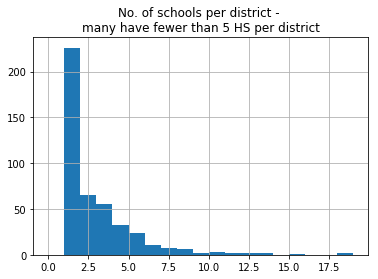

In [38]:
df_school_info_CA_schools.groupby('District').count()['School'].hist(bins=range(20))
plt.title('No. of schools per district - \nmany have fewer than 5 HS per district');

In [40]:
# Loop through each school in CA to get info

df_state = pd.DataFrame()

# Go district by district to avoid potential schools with similar names
for index_district, district in enumerate(df_school_info_CA_schools['District'].unique()):
    if index_district < 1000:
        #print(str(index_district), 'District queried: ', district)
        df_school_info_district = df_school_info_CA_schools.copy()[df_school_info_CA_schools['District']==district]
        for index, school in enumerate(df_school_info_district['School']):
            # Limit to high schools
            if index < 2000:
                try:
                    df = get_base_gs_school_info(school)
                    # Print to monitor, but limit the output
                    if index_district % 5 == 0:
                        print('District index: ', str(index_district), 'School index: ', str(index), school, df.shape, '\n -----')
                    if len(df_state.columns) < 1:
                        df_state = df.copy()
                        df_state.columns = [school]
                        index2get = df.index
                    else:
                        df_state[school] = df.copy().loc[index2get, :]
                        #df_state[school] = df
                except:
                    df_state[school] = None

            else:
                break
                
    else:
        break

# Transpose
df_state_tp = df_state.T

District index:  0 School index:  0 Envision Academy for Arts & Technology (23, 1) 
 -----


/Users/lacar/anaconda/lib/python3.5/site-packages/ipykernel_launcher.py:23: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
/Users/lacar/anaconda/lib/python3.5/site-packages/pandas/core/indexing.py:1367: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return self._getitem_tuple(key)


District index:  5 School index:  0 Emery Secondary (23, 1) 
 -----
District index:  10 School index:  0 James Logan High (23, 1) 
 -----
District index:  15 School index:  0 Dublin High (23, 1) 
 -----
District index:  20 School index:  0 Inspire School of Arts and Sciences (23, 1) 
 -----
District index:  20 School index:  1 Chico High (23, 1) 
 -----
District index:  20 School index:  2 Pleasant Valley High (23, 1) 
 -----
District index:  25 School index:  0 Bret Harte Union High (23, 1) 
 -----
District index:  30 School index:  0 Williams Junior/Senior High (23, 1) 
 -----
District index:  35 School index:  0 Heritage High (23, 1) 
 -----
District index:  35 School index:  1 Freedom High (23, 1) 
 -----
District index:  35 School index:  2 Liberty High (23, 1) 
 -----
District index:  40 School index:  0 Dougherty Valley High (23, 1) 
 -----
District index:  40 School index:  1 California High (23, 1) 
 -----
District index:  40 School index:  2 Monte Vista High (23, 1) 
 -----
D

District index:  290 School index:  1 Adelanto High (22, 1) 
 -----
District index:  290 School index:  3 Options for Youth-Victorville Charter (23, 1) 
 -----
District index:  290 School index:  4 Silverado High (23, 1) 
 -----
District index:  290 School index:  5 Victor Valley High (23, 1) 
 -----
District index:  290 School index:  6 Cobalt Institute of Math and Science Academy (23, 1) 
 -----
District index:  295 School index:  0 Summit Leadership Academy-High Desert (23, 1) 
 -----
District index:  295 School index:  1 Mirus Secondary (22, 1) 
 -----
District index:  295 School index:  3 Oak Hills High (23, 1) 
 -----
District index:  295 School index:  4 Hesperia High (23, 1) 
 -----
District index:  295 School index:  5 Sultana High (23, 1) 
 -----
District index:  300 School index:  0 San Diego Workforce Innovation High (20, 1) 
 -----
District index:  300 School index:  1 Borrego Springs High (23, 1) 
 -----
District index:  305 School index:  0 River Valley Charter (23, 1) 


In [42]:
# Count number of rows with less than 5 null values out of the 23 targeted to scrape

print(str((df_state_tp.isnull().sum(axis=1) < 5).sum())
      +  ' GS schools info obtained out of ' 
      + str(df_state_tp.shape[0]) 
      + ' schools queried' )


no_of_schools_wlink = df_state_tp['overviewLink'].notnull().sum()
print('no. of schools with GS link: ', str(no_of_schools_wlink))

no_of_schools_wlink = df_state_tp['overviewLink'].notnull().sum()

1151 GS schools info obtained out of 1253 schools queried
no. of schools with GS link:  1165


In [43]:
df_state_tp['overviewLink'].notnull().sum()

1165

In [44]:
df_state_tp.loc[df_state_tp.isnull().sum(axis=1) > 5, :]

tags,gsId,name,type,gradeRange,enrollment,gsRating,parentRating,city,state,districtId,...,phone,fax,website,ncesId,lat,lon,overviewLink,ratingsLink,reviewsLink,schoolStatsLink
Silver Oak High Public Montessori Charter,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
MetWest High,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
McClymonds High,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
Paradise eLearning Academy,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
Maxwell Sr High,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
Clayton Valley Charter High,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
De Anza High,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
El Cerrito High,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
Big Picture Educational Academy,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
McLane High,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None


In [47]:
# Save csv so it's not necessary to reprocess
#df_state_tp.to_csv('repo/df_state_tp_WITH_URL_191006.csv')

#### Get high-level ratings using school profile page

For college readiness, test scores, advanced courses,
equity overview, race ethnicity, low income, disabilities

**Note: (API not required here)**

In [769]:
# Test query
# school = df_school_info_sd_schools_su['School'].iloc[5]
# print(school.replace(' ','-'))
# url = df_district_tp.loc[school, 'overviewLink']
# socket_read = urllib.request.urlopen(url).read()
# soup = BeautifulSoup(socket_read, 'html.parser')
# url_test = 'https://www.greatschools.org/california/chula-vista/6279-Bonita-Vista-Senior-High-School/?utm_source=GSAPI&utm_medium=referral'

In [34]:
def get_high_level_ratings(url_school):

    try:
        socket_read = urllib.request.urlopen(url_school).read()   # uncomment when there's internet
        soup = BeautifulSoup(socket_read, 'html.parser')
    
    except:
        soup = None

    rating_categories = (['College_readiness', 'Test_scores', 'Advanced_courses',
                         'Equity_overview', 'Race_ethnicity', 'Low-income_students',
                         'Students_with_Disabilities'])
        
    rating_list = list()
    for rating_cat in rating_categories:
        #print(rating_cat)
        try:
            tags = soup.find_all(href=re.compile(rating_cat))
            this_cat_rating_list = []
            for tag in tags:
                for index, child in enumerate(tag.contents):
                    if "rating" in str(child):
                        this_child = str(child)
                        rating = (int(this_child.split('--')[1].split()[0]))
                        this_cat_rating_list.append(rating)
                    else:
                        #print("no rating")
                        this_cat_rating_list.append('no_rating')

                # If there's no rating in any tag for that category, record it as None
                if False not in [i=='no_rating' for i in this_cat_rating_list]:
                    rating = None

        except:
            rating = None
            
        rating_list.append(rating)
        
    return rating_list

##### Testing with Sweetwater Union

In [ ]:
# Commented out if needed to start next loop at a certain index

# col_hl_ratings = ['college_readiness', 'test_scores', 'advanced_courses', 'equity_overview', 'race_ethnicity', 'low_income', 'disabilities']
# # Initiate columns
# for rating in col_hl_ratings:
#     df_district_tp.loc[:, rating] = None



In [92]:
# NOTE: This cell takes a while to run, likely due to internet speed limitations

# Use enumerate option to start at a certain index and not start over
for i, url in enumerate(df_district_tp['overviewLink'], 9):
    print(i)
    #try:
#     index_school = df_district_tp.index[i]
#     df_district_tp.loc[index_school, col_hl_ratings] = get_high_level_ratings(url)
#     print(str(i+1) + ' of ' + str(len(df_district_tp)) + ': ' + index_school)    # To monitor output
    #except:
    #    continue


9
10
11
12
13
14
15
16
17
18
19
20


In [114]:
df_district_tp['overviewLink'].iloc[9:]

Mar Vista Senior High     https://www.greatschools.org/california/imperi...
Sweetwater High           https://www.greatschools.org/california/nation...
Montgomery Senior High    https://www.greatschools.org/california/san-di...
Name: overviewLink, dtype: object

In [117]:
# NOTE: This cell takes a while to run, likely due to internet speed limitations

# Careful with this - 

start_val = 9
for i, url in enumerate(df_district_tp['overviewLink'].iloc[start_val:]):
    index_school = df_district_tp.index[i+start_val]
    print(i, index_school, url)
#     try:
#         index_school = df_district_tp.index[i]
#         df_district_tp.loc[index_school, col_hl_ratings] = get_high_level_ratings(url)
#         no_of_values = df_district_tp.loc[index_school, col_hl_ratings].notnull().sum()
#         print(str(i+1) + ' of ' + str(len(df_district_tp)) + ': ' + index_school + ' - ' + str(no_of_values))    # To monitor output
#     except:
#         continue



0 Mar Vista Senior High https://www.greatschools.org/california/imperial-beach/6289-Mar-Vista-Senior-High-School/?utm_source=GSAPI&utm_medium=referral
1 Sweetwater High https://www.greatschools.org/california/national-city/6297-Sweetwater-High-School/?utm_source=GSAPI&utm_medium=referral
2 Montgomery Senior High https://www.greatschools.org/california/san-diego/6291-Montgomery-Senior-High-School/?utm_source=GSAPI&utm_medium=referral


#####  Testing with LA Unified

In [1291]:
# NOTE: This cell takes a while to run, likely due to internet speed limitations

# col_hl_ratings = ['college_readiness', 'test_scores', 'advanced_courses', 'equity_overview', 'race_ethnicity', 'low_income', 'disabilities']
# # Initiate columns
# for rating in col_hl_ratings:
#     df_district_tp_LA.loc[:, rating] = None
    
# for i, url in enumerate(df_district_tp_LA['overviewLink']):
#     index_school = df_district_tp_LA.index[i]
#     print(str(i+1) + ' of ' + str(len(df_district_tp_LA)) + ': ' + index_school)    # To monitor output
#     df_district_tp_LA.loc[index_school, col_hl_ratings] = get_high_level_ratings(url)

1 of 160: High Tech LA
2 of 160: Wallis Annenberg High
3 of 160: Central City Value
4 of 160: ICEF View Park Preparatory Accelerated High
5 of 160: CATCH Prep Charter High, Inc.
6 of 160: Oscar De La Hoya Animo Charter High
7 of 160: Animo South Los Angeles Charter
8 of 160: Middle College High
9 of 160: Dr. Richard A. Vladovic Harbor Teacher Preparation Academy
10 of 160: Camino Nuevo Charter High
11 of 160: Animo Venice Charter High
12 of 160: Animo Pat Brown
13 of 160: Northridge Academy High
14 of 160: Port of Los Angeles High
15 of 160: CHAMPS - Charter HS of Arts-Multimedia & Performing
16 of 160: Alliance Judy Ivie Burton Technology Academy High
17 of 160: Alliance Collins Family College-Ready High
18 of 160: Santee Education Complex
19 of 160: South East High
20 of 160: Maywood Academy High
21 of 160: New Village Girls Academy
22 of 160: Alliance Patti And Peter Neuwirth Leadership Academy
23 of 160: Alliance Dr. Olga Mohan High
24 of 160: Animo Ralph Bunche Charter High
25 of 

##### Full CA high school data

In [114]:
# Commented out if needed to start next loop at a certain index

col_hl_ratings = ['college_readiness', 'test_scores', 'advanced_courses', 'equity_overview', 'race_ethnicity', 'low_income', 'disabilities']
# # Initiate columns
# for rating in col_hl_ratings:
#     df_state_tp.loc[:, rating] = None


In [119]:
# NOTE: This cell takes a while to run, likely due to internet speed limitations

# For debugging - start at a certain row and not have to start over
# Don't use enumerate option since the url doesn't track with the option

start_val = 350
for i, url in enumerate(df_state_tp['overviewLink'].iloc[start_val:]):
    index_school = df_state_tp.index[i+start_val]
    try:
        if url is not None:
            df_state_tp.loc[index_school, col_hl_ratings] = get_high_level_ratings(url)
            no_of_values = df_state_tp.loc[index_school, col_hl_ratings].notnull().sum()
        else:
            df_state_tp.loc[index_school, col_hl_ratings] = None
    except:
        df_state_tp.loc[index_school, col_hl_ratings] = None
    if i % 10 == 0:
        print(str(i+1+start_val) + ' of ' + str(len(df_state_tp)) + ': ' + index_school + ' - ' + str(no_of_values))    # To monitor output


1 of 1253: Contreras Learning Center-Academic Leadership Community - 4
11 of 1253: Alliance Tennenbaum Family Technology High - 4
21 of 1253: Valley Academy of Arts and Sciences - 4
31 of 1253: Synergy Quantum Academy - 4
41 of 1253: Augustus F. Hawkins High B Community Health Advocates - 4
51 of 1253: Alliance Alice M. Baxter College-Ready High - 3
61 of 1253: Collegiate Charter High School of Los Angeles - 3
71 of 1253: Matrix for Success Academy - 0
81 of 1253: Grover Cleveland Charter High - 4
91 of 1253: Ulysses S. Grant Senior High - 4
101 of 1253: James Monroe High - 4
111 of 1253: University High School Charter - 4
121 of 1253: Monrovia High - 4
131 of 1253: Odyssey STEM Academy - 0
141 of 1253: Fremont Academy of Engineering and Design - 4
151 of 1253: Pioneer High - 4
161 of 1253: Opportunities for Learning - Santa Clarita - 4
171 of 1253: John A. Rowland High - 4
181 of 1253: Mira Costa High - 4
191 of 1253: Madera South High - 4
201 of 1253: San Rafael High - 4
211 of 1253:

In [98]:
# Something to fix if there's time
# df_state_tp.iloc[360:365, :]

tags,gsId,name,type,gradeRange,enrollment,gsRating,parentRating,city,state,districtId,...,ratingsLink,reviewsLink,schoolStatsLink,college_readiness,test_scores,advanced_courses,equity_overview,race_ethnicity,low_income,disabilities
Alliance Tennenbaum Family Technology High,25748,Alliance Tennenbaum Family Technology High,charter,9-12,408,6,4,Los Angeles,CA,286,...,https://www.greatschools.org/california/los-an...,https://www.greatschools.org/california/los-an...,https://www.greatschools.org/california/los-an...,10,10,None,None,None,10,None
"Math, Science, & Technology Magnet Academy at Roosevelt High",2496,Windsor Hills Math Science,public,K-5,530,4,4,Los Angeles,CA,286,...,https://www.greatschools.org/california/los-an...,https://www.greatschools.org/california/los-an...,https://www.greatschools.org/california/los-an...,2,4,None,4,None,4,None
Esteban Torres East LA Performing Arts Magnet,None,None,None,None,None,None,None,None,None,None,...,None,None,None,8,9,None,10,None,9,None
Humanitas Academy of Art and Technology at Esteban E. Torres High No. 4,25437,Humanitas Academy Of Art And Technology At Est...,public,9-12,493,4,NaN,Los Angeles,CA,286,...,https://www.greatschools.org/california/los-an...,https://www.greatschools.org/california/los-an...,https://www.greatschools.org/california/los-an...,None,None,None,None,None,None,None
Social Justice Leadership Academy at Esteban E. Torres High No. 5,25474,Social Justice Leadership Academy At Esteban E...,public,9-12,406,3,NaN,Los Angeles,CA,286,...,https://www.greatschools.org/california/los-an...,https://www.greatschools.org/california/los-an...,https://www.greatschools.org/california/los-an...,4,5,None,4,None,4,None


In [130]:
# Count number of rows with some null values out of the 30 targeted to scrape
# print(str((df_state_tp.isnull().sum(axis=1) < 5).sum())
#       +  ' GS schools info obtained out of ' 
#       + str(df_state_tp.shape[0]) 
#       + ' schools queried' )

no_of_schools_w_4HLratings = (df_state_tp.loc[:, col_hl_ratings].notnull().sum(axis=1) >=3).sum()
print(str(no_of_schools_w_4HLratings) + ' GS schools with at least 3 of the 4 high-level ratings out of ' + str(no_of_schools_wlink) + ' with a link')

1028 GS schools with at least 3 of the 4 high-level ratings out of 1165 with a link


In [125]:
# CSV to save I don't have to start over
#df_state_tp.to_csv('repo/df_state_tp_WITH_URL-HLdone997schoolsWinfo_191006.csv')

In [126]:
#df_state_tp.tail()

tags,gsId,name,type,gradeRange,enrollment,gsRating,parentRating,city,state,districtId,...,ratingsLink,reviewsLink,schoolStatsLink,college_readiness,test_scores,advanced_courses,equity_overview,race_ethnicity,low_income,disabilities
Woodland Senior High,7829,Woodland Senior High School,public,9-12,1318,5,3,Woodland,CA,1041,...,https://www.greatschools.org/california/woodla...,https://www.greatschools.org/california/woodla...,https://www.greatschools.org/california/woodla...,5,4,None,3,None,3,None
Lindhurst High,7771,Lindhurst High School,public,9-12,1122,3,4,Olivehurst,CA,1032,...,https://www.greatschools.org/california/oliveh...,https://www.greatschools.org/california/oliveh...,https://www.greatschools.org/california/oliveh...,3,3,None,2,None,2,None
Marysville Charter Academy for the Arts,11901,Marysville Charter Academy For The Arts,charter,7-12,376,8,5,Marysville,CA,1032,...,https://www.greatschools.org/california/marysv...,https://www.greatschools.org/california/marysv...,https://www.greatschools.org/california/marysv...,9,8,None,8,None,8,None
Marysville High,7773,Marysville High School,public,9-12,893,5,4,Marysville,CA,1032,...,https://www.greatschools.org/california/marysv...,https://www.greatschools.org/california/marysv...,https://www.greatschools.org/california/marysv...,8,3,None,2,None,2,None
Wheatland Union High,7785,Wheatland Union High School,public,9-12,707,5,3,Wheatland,CA,1035,...,https://www.greatschools.org/california/wheatl...,https://www.greatschools.org/california/wheatl...,https://www.greatschools.org/california/wheatl...,7,5,None,3,None,3,None


In [31]:
# Loading CSV back into memory
df_state_tp = pd.read_csv('repo/df_state_tp_WITH_URL-HLdone997schoolsWinfo_191006.csv', index_col=0)

In [32]:
df_state_tp.head()

,gsId,name,type,gradeRange,enrollment,gsRating,parentRating,city,state,districtId,...,ratingsLink,reviewsLink,schoolStatsLink,college_readiness,test_scores,advanced_courses,equity_overview,race_ethnicity,low_income,disabilities
Envision Academy for Arts & Technology,16870.0,Envision Academy For Arts & Technology,charter,9-12,407.0,4.0,3.0,Oakland,CA,1069.0,...,https://www.greatschools.org/california/oaklan...,https://www.greatschools.org/california/oaklan...,https://www.greatschools.org/california/oaklan...,1.0,4.0,NaN,5.0,NaN,4.0,NaN
Alameda High,1.0,Alameda High School,public,9-12,1853.0,9.0,4.0,Alameda,CA,1.0,...,https://www.greatschools.org/california/alamed...,https://www.greatschools.org/california/alamed...,https://www.greatschools.org/california/alamed...,10.0,9.0,NaN,7.0,NaN,8.0,NaN
Alternatives in Action,11903.0,Alternatives in Action,charter,9-12,165.0,NaN,4.0,Oakland,CA,1.0,...,https://www.greatschools.org/california/oaklan...,https://www.greatschools.org/california/oaklan...,https://www.greatschools.org/california/oaklan...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Albany High,19.0,Albany High School,public,9-12,1210.0,9.0,4.0,Albany,CA,2.0,...,https://www.greatschools.org/california/albany...,https://www.greatschools.org/california/albany...,https://www.greatschools.org/california/albany...,9.0,9.0,NaN,9.0,NaN,8.0,NaN
Berkeley High,25.0,Berkeley High School,public,9-12,3205.0,8.0,4.0,Berkeley,CA,3.0,...,https://www.greatschools.org/california/berkel...,https://www.greatschools.org/california/berkel...,https://www.greatschools.org/california/berkel...,9.0,9.0,NaN,3.0,NaN,5.0,NaN


#### Obtain GS details on teacher and low income data

In [35]:
def get_school_page_doc(url_school):
    try:
        socket_read = urllib.request.urlopen(url_school).read()   # uncomment when there's internet
        soup = BeautifulSoup(socket_read, 'html.parser')
        school_page_doc = soup.get_text()
    except:
        school_page_doc = None
    return school_page_doc

In [36]:
def get_relevant_texts_teachers(my_text):
    try:
        my_str_loc = [(m.start(0), m.end(0)) for m in re.finditer(my_text,school_page_doc)]
        min_max_to_look = 300
        for this_match in range(len(my_str_loc)):
            #if "\"label\"" in school_page_doc[my_str_loc[this_match][0]-min_max_to_look:my_str_loc[this_match][1]+min_max_to_look]:
            relevant_text = school_page_doc[my_str_loc[this_match][0]-min_max_to_look:my_str_loc[this_match][1]+min_max_to_look]
    except:
        relevant_text = None
    return relevant_text

In [37]:
# This was arbitrarily chosen because it's the middle category
# but I tried other things and this seemed to work well to get the right section
# teacher_text = get_relevant_texts_teachers('Percentage of teachers with 3 or more years experience')

In [38]:
def get_ratios_for_staff(text):
    try:
        text2get = text
        # Added this next line
        teacher_text = get_relevant_texts_teachers('Percentage of teachers with 3 or more years experience')
        text2get_loc_start = teacher_text.replace('\n', '').find(text2get)
        text2get_loc_end = text2get_loc_start + len(text2get)
        ratio_loc = teacher_text.replace('\n', '').find(':', text2get_loc_end)
        student_to_one_staff = int(teacher_text.replace('\n', '')[text2get_loc_end:ratio_loc].strip())
    except:
        student_to_one_staff = None
    return student_to_one_staff


In [39]:
def get_percentages_for_staff(text):
    try:
        text2get = text
        # Added this next line
        teacher_text = get_relevant_texts_teachers('Percentage of teachers with 3 or more years experience')
        text2get_loc_start = teacher_text.replace('\n', '').find(text2get)
        text2get_loc_end = text2get_loc_start + len(text2get)
        character_loc = teacher_text.replace('\n', '').find('%', text2get_loc_end)
        percent_staff = int(teacher_text.replace('\n', '')[text2get_loc_end:character_loc].strip())
    except:
        percent_staff = None
    return percent_staff

In [40]:
def get_salary(text):
    try:
        text2get = text
        # Added this next line
        teacher_text = get_relevant_texts_teachers('Percentage of teachers with 3 or more years experience')
        text2get_loc_start = teacher_text.replace('\n', '').find(text2get)
        text2get_loc_end = text2get_loc_start + len(text2get)
        character_loc = teacher_text.replace('\n', '').find('$', text2get_loc_end)
        end_of_salary_loc = teacher_text.replace('\n', '').find(' ', character_loc)
        salary = int(teacher_text.replace('\n', '')[character_loc+1:end_of_salary_loc].replace(',',''))
    except:
        salary = None
    return salary

In [41]:
# Testing
# Add this to individual school info and then dataframe
# (get_ratios_for_staff('Students per teacher'),
#  get_ratios_for_staff('Students per counselor'),
#  get_percentages_for_staff('Percentage of teachers with 3 or more years experience'),
#  get_percentages_for_staff('% of full time teachers who are certified '),
#  get_salary('Average teacher salary'))

In [42]:
def get_pct_lowincome_students(school_page_doc):
    try:
        my_text = 'Low-income'
        my_str_loc = [(m.start(0), m.end(0)) for m in re.finditer(my_text,school_page_doc)]
        #min_max_to_look = 250  # use for other things
        min_max_to_look = 100
        counter = 0
        for this_match in range(len(my_str_loc)):
            relevant_text = school_page_doc[my_str_loc[this_match][0]-min_max_to_look:my_str_loc[this_match][1]+min_max_to_look]
            if '"breakdown":"Low-income","breakdown_in_english":"Economically disadvantaged"' in relevant_text:
                #print('   =============   ' + str(counter) + '   === (no. of low income?) ==========   ')
                #print(relevant_text)
                counter += 1
                break
    except:
        relevant_text = None
        
    try:
        str2find = '"percentage":'
        str2find_loc_start = relevant_text.find(str2find)
        str2find_loc_end = str2find_loc_start + len(str2find)
        pct_low_income_loc_end = relevant_text.find(',', str2find_loc_end)
        pct_low_income = int(relevant_text[str2find_loc_end:pct_low_income_loc_end].strip('"'))
    except:
        pct_low_income = None
    
    return pct_low_income

In [43]:
def get_lowincome_test_scores_overview(school_page_doc):
    try:
        my_text = 'Low-income'
        my_str_loc = [(m.start(0), m.end(0)) for m in re.finditer(my_text,school_page_doc)]
        min_max_to_look = 400
        counter = 0
        for this_match in range(len(my_str_loc)):
            relevant_text = school_page_doc[my_str_loc[this_match][0]-min_max_to_look:my_str_loc[this_match][1]+min_max_to_look]
            if 'label' in relevant_text and counter==0:
                #print('   =============   ' + str(counter) + '   === (label) ==========   ')
                #print(relevant_text)
                counter += 1
                break
    except:
        relevant_text = None
        
    try:  
        str2find = '"All students","label":'
        text_loc_start = relevant_text.find(str2find)
        text_loc_end = text_loc_start + len(str2find)
        score_start = relevant_text.find('"score":', text_loc_end)
        score_end = relevant_text.find(',', score_start)
        score_AS = int(relevant_text[score_start:score_end].split(':')[1])
    except:
        score_AS = None

    try:
        str2find = '"Economically disadvantaged","label":'
        text_loc_start = relevant_text.find(str2find)
        text_loc_end = text_loc_start + len(str2find)
        score_start = relevant_text.find('"score":', text_loc_end)
        score_end = relevant_text.find(',', score_start)
        score_LI = int(relevant_text[score_start:score_end].split(':')[1])
    except:
        score_LI = None

    try:
        str2find = '"Not economically disadvantaged","label":'
        text_loc_start = relevant_text.find(str2find)
        text_loc_end = text_loc_start + len(str2find)
        score_start = relevant_text.find('"score":', text_loc_end)
        score_end = relevant_text.find(',', score_start)
        score_notLI = int(relevant_text[score_start:score_end].split(':')[1])
    except:
        score_notLI = None

    return (score_AS, score_LI, score_notLI)

In [44]:
def get_lowincome_test_scores_for_subject(school_page_doc, subject):
    try:
        my_text = 'Low-income'
        my_str_loc = [(m.start(0), m.end(0)) for m in re.finditer(my_text,school_page_doc)]
        min_max_to_look = 350
        counter = 0
        for this_match in range(len(my_str_loc)):
            relevant_text = school_page_doc[my_str_loc[this_match][0]-min_max_to_look:my_str_loc[this_match][1]+min_max_to_look]
            if 'label' in relevant_text and subject in relevant_text:
                #print('   =============   ' + str(counter) + '   === (label) ==========   ')
                #print(relevant_text)
                counter += 1
                break
    except:
        relevant_text = None
    
    # Get all students info
    try:
        str2find = '"All students","label":'
        low_inc_score_loc_start = relevant_text.find(str2find)
        low_inc_score_loc_end = low_inc_score_loc_start + len(str2find)
        score_end = relevant_text.find(',', low_inc_score_loc_end)
        score_AS = int(relevant_text[low_inc_score_loc_end:score_end].strip('"'))
    except:
        score_AS = None

    try:
        str2find_no_students = '"number_students_tested":'
        no_students_loc_start = relevant_text.find(str2find_no_students, low_inc_score_loc_end)
        no_students_loc_end = no_students_loc_start + len(str2find_no_students)
        #score_start = no_students_loc_end + 1
        score_end = relevant_text.find(',', no_students_loc_end)
        no_students_tested_AS = int(relevant_text[no_students_loc_end:score_end])
    except:
        no_students_tested_AS = None
    
    # Get low income info
    try:
        str2find = '"Economically disadvantaged","label":'
        low_inc_score_loc_start = relevant_text.find(str2find)
        low_inc_score_loc_end = low_inc_score_loc_start + len(str2find)
        score_end = relevant_text.find(',', low_inc_score_loc_end)
        score_LI = int(relevant_text[low_inc_score_loc_end:score_end].strip('"'))
    except:
        score_LI = None
        
    try:    
        str2find_no_students = '"number_students_tested":'
        no_students_loc_start = relevant_text.find(str2find_no_students, low_inc_score_loc_end)
        no_students_loc_end = no_students_loc_start + len(str2find_no_students)
        #score_start = no_students_loc_end + 1
        score_end = relevant_text.find(',', no_students_loc_end)
        no_students_tested_LI = int(relevant_text[no_students_loc_end:score_end])
    except:
        no_students_tested_LI = None
    
    return (score_AS, no_students_tested_AS, score_LI, no_students_tested_LI)

In [45]:
def get_lowincome_gradrates_college_eligibility(school_page_doc, grad_category):
    try:
        my_text = 'Low-income'
        my_str_loc = [(m.start(0), m.end(0)) for m in re.finditer(my_text,school_page_doc)]
        min_max_to_look = 300
        counter = 0
        for this_match in range(len(my_str_loc)):
            relevant_text = school_page_doc[my_str_loc[this_match][0]-min_max_to_look:my_str_loc[this_match][1]+min_max_to_look]
            if 'label' in relevant_text and grad_category in relevant_text:
                #print('   =============   ' + str(counter) + '   === (label) ==========   ')
                #print(relevant_text)
                counter += 1
                break
                
    except:
        relevant_text = None

    try:
        str2find = '"All students","label":'
        low_inc_score_loc_start = relevant_text.find(str2find)
        low_inc_score_loc_end = low_inc_score_loc_start + len(str2find)
        score_end = relevant_text.find(',', low_inc_score_loc_end)
        score_AS = int(relevant_text[low_inc_score_loc_end:score_end].strip('"'))
    except:
        score_AS = None

    try:
        str2find = '"Low-income","label":'
        low_inc_score_loc_start = relevant_text.find(str2find)
        low_inc_score_loc_end = low_inc_score_loc_start + len(str2find)
        score_end = relevant_text.find(',', low_inc_score_loc_end)
        score_LI = int(relevant_text[low_inc_score_loc_end:score_end].strip('"'))
    except:
        score_LI = None

    return (score_AS, score_LI)

##### Testing with Sweetwater Union

In [160]:
# Initiate teacher rating columns
col_teacher_ratings = ['students_per_teacher', 'students_per_counselor', 'pct_teachers_3years_or_more', 'pct_teachers_who_r_certified', 'avg_teacher_salary']
for rating in col_teacher_ratings:
    df_district_tp.loc[:, rating] = None

# Initiate low income data columns
col_lowincome_ratings = (['test_score_rating_allStudents',
                          'test_score_rating_LIstudents',
                          'test_score_rating_notLIstudents',
                          'test_scores_english_allStudents',
                          'test_scores_english_allStudents_n_students',
                          'test_scores_english_LIstudents',
                          'test_scores_english_LIstudents_n_students',
                          'test_scores_math_allStudents',
                          'test_scores_math_allStudents_n_students',
                          'test_scores_math_LIstudents',
                          'test_scores_math_LIstudents_n_students',
                          'graduation_rates_UCCSU_eligibility_allStudents',
                          'graduation_rates_UCCSU_eligibility_LIstudents',
                          'graduation_rates_gradRates_eligibility_allStudents',
                          'graduation_rates_gradRates_eligibility_LIstudents',
                          'pct_LI_students'])
for rating in col_lowincome_ratings:
    df_district_tp.loc[:, rating] = None

    

start_val = 3
end_val = 5
for i, url in enumerate(df_district_tp['overviewLink'].iloc[start_val:end_val]):
    index_school = df_district_tp.index[i+start_val]
     
# for i, url in enumerate(df_district_tp['overviewLink']):
#     index_school = df_district_tp.index[i]
    print(str(i+1+start_val) + ' of ' + str(len(df_district_tp)) + ': ' + index_school)    # To monitor output
    school_page_doc = get_school_page_doc(url)
    
    # Detailed teacher info
    df_district_tp.loc[index_school, 'students_per_teacher'] = get_ratios_for_staff('Students per teacher')
    df_district_tp.loc[index_school, 'students_per_counselor'] = get_ratios_for_staff('Students per counselor')
    df_district_tp.loc[index_school, 'pct_teachers_3years_or_more'] = get_percentages_for_staff('Percentage of teachers with 3 or more years experience')
    df_district_tp.loc[index_school, 'pct_teachers_who_r_certified'] = get_percentages_for_staff('% of full time teachers who are certified')
    df_district_tp.loc[index_school, 'avg_teacher_salary'] = get_salary('Average teacher salary')
    
    # Detailed low income info
    df_district_tp.loc[index_school, col_lowincome_ratings[0:3]] = get_lowincome_test_scores_overview(school_page_doc)
    df_district_tp.loc[index_school, col_lowincome_ratings[3:7]] = get_lowincome_test_scores_for_subject(school_page_doc, 'English Language Arts')
    df_district_tp.loc[index_school, col_lowincome_ratings[7:11]] = get_lowincome_test_scores_for_subject(school_page_doc, 'Math')
    df_district_tp.loc[index_school, col_lowincome_ratings[11:13]] = get_lowincome_gradrates_college_eligibility(school_page_doc, 'UC/CSU eligibility')
    df_district_tp.loc[index_school, col_lowincome_ratings[13:15]] = get_lowincome_gradrates_college_eligibility(school_page_doc, 'Graduation rates')
    df_district_tp.loc[index_school, col_lowincome_ratings[15]] = get_pct_lowincome_students(school_page_doc)

print('done getting schools in this set')

4 of 12: Castle Park Senior High
5 of 12: Eastlake High
done getting schools in this set


##### Testing with LA Unified

In [227]:
#col_teacher_ratings = ['students_per_teacher', 'students_per_counselor', 'pct_teachers_3years_or_more', 'pct_teachers_who_r_certified', 'avg_teacher_salary']
# # Initiate columns
# for rating in col_teacher_ratings:
#     df_district_tp_LA.loc[:, rating] = None
    
# for i, url in enumerate(df_district_tp_LA['overviewLink']):
#     index_school = df_district_tp_LA.index[i]
#     print(str(i+1) + ' of ' + str(len(df_district_tp_LA)) + ': ' + index_school)    # To monitor output
#     school_page_doc = get_school_page_doc(url)
#     #teacher_text = get_relevant_texts_teachers('Percentage of teachers with 3 or more years experience')
#     df_district_tp_LA.loc[index_school, 'students_per_teacher'] = get_ratios_for_staff('Students per teacher')
#     # print(get_ratios_for_staff('Students per teacher'))
#     df_district_tp_LA.loc[index_school, 'students_per_counselor'] = get_ratios_for_staff('Students per counselor')
#     df_district_tp_LA.loc[index_school, 'pct_teachers_3years_or_more'] = get_percentages_for_staff('Percentage of teachers with 3 or more years experience')
#     df_district_tp_LA.loc[index_school, 'pct_teachers_who_r_certified'] = get_percentages_for_staff('% of full time teachers who are certified')
#     df_district_tp_LA.loc[index_school, 'avg_teacher_salary'] = get_salary('Average teacher salary')

##### Full CA high school data

In [288]:
col_teacher_ratings = ['students_per_teacher', 'students_per_counselor', 'pct_teachers_3years_or_more', 'pct_teachers_who_r_certified', 'avg_teacher_salary']

col_lowincome_ratings = (['test_score_rating_allStudents',
                          'test_score_rating_LIstudents',
                          'test_score_rating_notLIstudents',
                          'test_scores_english_allStudents',
                          'test_scores_english_allStudents_n_students',
                          'test_scores_english_LIstudents',
                          'test_scores_english_LIstudents_n_students',
                          'test_scores_math_allStudents',
                          'test_scores_math_allStudents_n_students',
                          'test_scores_math_LIstudents',
                          'test_scores_math_LIstudents_n_students',
                          'graduation_rates_UCCSU_eligibility_allStudents',
                          'graduation_rates_UCCSU_eligibility_LIstudents',
                          'graduation_rates_gradRates_eligibility_allStudents',
                          'graduation_rates_gradRates_eligibility_LIstudents',
                          'pct_LI_students'])

In [60]:
# Initiate teacher rating columns - comment out to start mid-loop
# col_teacher_ratings = ['students_per_teacher', 'students_per_counselor', 'pct_teachers_3years_or_more', 'pct_teachers_who_r_certified', 'avg_teacher_salary']
# for rating in col_teacher_ratings:
#     df_state_tp.loc[:, rating] = None

# # Initiate low income data columns
# col_lowincome_ratings = (['test_score_rating_allStudents',
#                           'test_score_rating_LIstudents',
#                           'test_score_rating_notLIstudents',
#                           'test_scores_english_allStudents',
#                           'test_scores_english_allStudents_n_students',
#                           'test_scores_english_LIstudents',
#                           'test_scores_english_LIstudents_n_students',
#                           'test_scores_math_allStudents',
#                           'test_scores_math_allStudents_n_students',
#                           'test_scores_math_LIstudents',
#                           'test_scores_math_LIstudents_n_students',
#                           'graduation_rates_UCCSU_eligibility_allStudents',
#                           'graduation_rates_UCCSU_eligibility_LIstudents',
#                           'graduation_rates_gradRates_eligibility_allStudents',
#                           'graduation_rates_gradRates_eligibility_LIstudents',
#                           'pct_LI_students'])
# for rating in col_lowincome_ratings:
#     df_state_tp.loc[:, rating] = None

# Set start and end to avoid hangups
start_val = 799
end_val = len(df_state_tp)
#for i, url in enumerate(df_state_tp['overviewLink'].iloc[start_val:end_val]):
    index_school = df_state_tp.index[i+start_val]
    #print(str(i+1+start_val) + ' of ' + str(len(df_state_tp)) + ': ' + index_school)    # To monitor output
    # Monitor output but don't print everything
    if i % 10==0:
        print(str(i+1+start_val) + ' of ' + str(len(df_state_tp)) + ': ' + index_school)    # To monitor output
    school_page_doc = get_school_page_doc(url)
    
    # Detailed teacher info
    df_state_tp.loc[index_school, 'students_per_teacher'] = get_ratios_for_staff('Students per teacher')
    df_state_tp.loc[index_school, 'students_per_counselor'] = get_ratios_for_staff('Students per counselor')
    df_state_tp.loc[index_school, 'pct_teachers_3years_or_more'] = get_percentages_for_staff('Percentage of teachers with 3 or more years experience')
    df_state_tp.loc[index_school, 'pct_teachers_who_r_certified'] = get_percentages_for_staff('% of full time teachers who are certified')
    df_state_tp.loc[index_school, 'avg_teacher_salary'] = get_salary('Average teacher salary')
    
    # Detailed low income info
    df_state_tp.loc[index_school, col_lowincome_ratings[0:3]] = get_lowincome_test_scores_overview(school_page_doc)
    df_state_tp.loc[index_school, col_lowincome_ratings[3:7]] = get_lowincome_test_scores_for_subject(school_page_doc, 'English Language Arts')
    df_state_tp.loc[index_school, col_lowincome_ratings[7:11]] = get_lowincome_test_scores_for_subject(school_page_doc, 'Math')
    df_state_tp.loc[index_school, col_lowincome_ratings[11:13]] = get_lowincome_gradrates_college_eligibility(school_page_doc, 'UC/CSU eligibility')
    df_state_tp.loc[index_school, col_lowincome_ratings[13:15]] = get_lowincome_gradrates_college_eligibility(school_page_doc, 'Graduation rates')
    df_state_tp.loc[index_school, col_lowincome_ratings[15]] = get_pct_lowincome_students(school_page_doc)

print('done getting schools in this set')

800 of 1253: Natomas High
810 of 1253: Big Bear High
820 of 1253: Ruben S. Ayala High
830 of 1253: Fontana High
840 of 1253: Rialto High
850 of 1253: San Gorgonio High
860 of 1253: Baker High
870 of 1253: Elite Academic Academy - Adult Work Force Investment
880 of 1253: Classical Academy High
890 of 1253: Steele Canyon High
900 of 1253: Westview High
910 of 1253: San Diego Science and Technology
920 of 1253: Charter School of San Diego
930 of 1253: Canyon Crest Academy
940 of 1253: MAAC Community Charter
950 of 1253: Vista High
960 of 1253: High Tech High Chula Vista
970 of 1253: Burton (Phillip and Sala) Academic High
980 of 1253: O'Connell (John) High
990 of 1253: be.tech
1000 of 1253: Millennium Charter
1010 of 1253: Morro Bay High
1020 of 1253: Terra Nova High
1030 of 1253: Summit Preparatory Charter High
1040 of 1253: Lompoc High
1050 of 1253: Summit Public School: Tahoma
1060 of 1253: ACE Charter High
1070 of 1253: James Lick High
1080 of 1253: Dr. TJ Owens Gilroy Early College A

In [61]:
# No. of schools with at least 5 of the 21 detailed ratings
no_of_schools_wdetailed_ratings = (df_state_tp.loc[:, col_teacher_ratings + col_lowincome_ratings].isnull().sum(axis=1) < 5).sum()
print('', str(no_of_schools_wdetailed_ratings))

 1001


In [62]:
# CSV to save I don't have to start over
# df_state_tp.to_csv('repo/df_state_tp_WITH_URL-HLdone997schoolsWinfo_WdetailsALLschools_191007.csv')

In [63]:
df_state_tp.tail()

,gsId,name,type,gradeRange,enrollment,gsRating,parentRating,city,state,districtId,...,test_scores_english_LIstudents_n_students,test_scores_math_allStudents,test_scores_math_allStudents_n_students,test_scores_math_LIstudents,test_scores_math_LIstudents_n_students,graduation_rates_UCCSU_eligibility_allStudents,graduation_rates_UCCSU_eligibility_LIstudents,graduation_rates_gradRates_eligibility_allStudents,graduation_rates_gradRates_eligibility_LIstudents,pct_LI_students
Woodland Senior High,7829.0,Woodland Senior High School,public,9-12,1318.0,5.0,3.0,Woodland,CA,1041.0,...,196,18,303,14,196,42,38,89,88,63
Lindhurst High,7771.0,Lindhurst High School,public,9-12,1122.0,3.0,4.0,Olivehurst,CA,1032.0,...,194,13,230,12,197,31,30,90,90,84
Marysville Charter Academy for the Arts,11901.0,Marysville Charter Academy For The Arts,charter,7-12,376.0,8.0,5.0,Marysville,CA,1032.0,...,119,40,60,40,119,67,72,92,96,44
Marysville High,7773.0,Marysville High School,public,9-12,893.0,5.0,4.0,Marysville,CA,1032.0,...,118,16,185,11,117,33,29,97,97,62
Wheatland Union High,7785.0,Wheatland Union High School,public,9-12,707.0,5.0,3.0,Wheatland,CA,1035.0,...,72,23,162,13,70,52,51,98,99,37


### Merge datasets

In [ ]:
#  Merge on this - TO DO LATER
# From school info: NCESDist	NCESSchool  :  622710 + 11365
# On GS info: ncesId:   62271011365

# And filter out unrated schools (gsRating = None)
# df_school_info.head().loc[:, 'NCESDist'] + df_school_info.head().loc[:, 'NCESSchool']

# df_state_tp.head().loc[:, 'ncesId']

In [74]:
# Merge on school and zip code due to same named schools

# Need zip code in GS data
df_temp = df_state_tp['address'].str.split(expand=True)
col_index4zip = len(df_temp.columns) - df_temp.isnull().sum(axis=1) - 1

zipcode_list = list()
for i, col in enumerate(col_index4zip):
    if col != -1:
        zipcode = df_temp.iloc[i, col]
    else:
        zipcode = df_temp.iloc[i, 8]
    try:
        zipcode_list.append(int(zipcode))
    except:
        zipcode_list.append(None)
        
df_state_tp['zip_code_GS'] = zipcode_list
df_state_tp['schoolname4merge'] = df_state_tp.index

In [83]:
df_state_tp.head().index

Index(['Envision Academy for Arts & Technology', 'Alameda High',
       'Alternatives in Action', 'Albany High', 'Berkeley High'],
      dtype='object')

In [84]:
df_state_tp['name'].head()

Envision Academy for Arts & Technology    Envision Academy For Arts & Technology
Alameda High                                                 Alameda High School
Alternatives in Action                                    Alternatives in Action
Albany High                                                   Albany High School
Berkeley High                                               Berkeley High School
Name: name, dtype: object

In [86]:
bool_name_dup = df_state_tp['name'].duplicated(keep=False)

In [87]:
df_state_tp.loc[bool_name_dup, :]

,gsId,name,type,gradeRange,enrollment,gsRating,parentRating,city,state,districtId,...,test_scores_math_allStudents_n_students,test_scores_math_LIstudents,test_scores_math_LIstudents_n_students,graduation_rates_UCCSU_eligibility_allStudents,graduation_rates_UCCSU_eligibility_LIstudents,graduation_rates_gradRates_eligibility_allStudents,graduation_rates_gradRates_eligibility_LIstudents,pct_LI_students,schoolname4merge,zip_code_GS
Silver Oak High Public Montessori Charter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,None,None,None,None,None,None,None,None,Silver Oak High Public Montessori Charter,NaN
MetWest High,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,None,None,None,None,None,None,None,None,MetWest High,NaN
McClymonds High,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,None,None,None,None,None,None,None,None,McClymonds High,NaN
Paradise eLearning Academy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,None,None,None,None,None,None,None,None,Paradise eLearning Academy,NaN
Maxwell Sr High,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,None,None,None,None,None,None,None,None,Maxwell Sr High,NaN
Clayton Valley Charter High,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,None,None,None,None,None,None,None,None,Clayton Valley Charter High,NaN
De Anza High,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,None,None,None,None,None,None,None,None,De Anza High,NaN
El Cerrito High,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,None,None,None,None,None,None,None,None,El Cerrito High,NaN
Big Picture Educational Academy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,None,None,None,None,None,None,None,None,Big Picture Educational Academy,NaN
McLane High,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,None,None,None,None,None,None,None,None,McLane High,NaN


In [91]:
# Merge great schools and school info on zip code
df_state_info_gs = pd.merge(df_school_info, df_state_tp, how='inner',
                            left_on=['School', 'zip_code'],
                            right_on=['schoolname4merge', 'zip_code_GS'])

# Inspection showed a handful of schools in df_school_info with duplicate values for some reason
df_state_info_gs = df_state_info_gs.drop_duplicates(subset=['School', 'Street'], keep='last')

In [92]:
# Merge great schools, school info and demographic info on zip code
df_state_info_gs_census = pd.merge(df_state_info_gs, df_census,
                                      how='inner', left_on='zip_code', right_index=True)

In [195]:
# Save but comment after doing so
# df_state_info_gs_census.to_csv('repo/df_state_info_gs_census_ALL.csv')

### Read in to avoid re-downloading data if necessary

In [215]:
# df_state_info_gs_census = pd.read_csv('df_state_info_gs_census_ALL.csv', index_col=0)
df_state_info_gs_census = pd.read_csv(
    "~/Documents/Goals_and_careers/Edu_Data_Science/Insight/edu_project_for_interview/df_state_info_gs_census_ALL.csv"
)

<IPython.core.display.Javascript object>

In [216]:
print("Dimensions of dataframe after data merging:\n", df_state_info_gs_census.shape)

Dimensions of dataframe after data merging:
 (1152, 218)


<IPython.core.display.Javascript object>

In [217]:
[print(i) for i in df_state_info_gs_census.columns]

Unnamed: 0
CDSCode
NCESDist
NCESSchool
StatusType
County
District
School
Street
StreetAbr
City
Zip
State
MailStreet
MailStrAbr
MailCity
MailZip
MailState
Phone
Ext
WebSite
OpenDate
ClosedDate
Charter
CharterNum
FundingType
DOC
DOCType
SOC
SOCType
EdOpsCode
EdOpsName
EILCode
EILName
GSoffered
GSserved
Virtual
Magnet
YearRoundYN
FederalDFCDistrictID
Latitude
Longitude
AdmFName1
AdmLName1
AdmEmail1
AdmFName2
AdmLName2
AdmEmail2
AdmFName3
AdmLName3
AdmEmail3
LastUpDate
zip_code
gsId
name
type
gradeRange
enrollment
gsRating
parentRating
city
state
districtId
district
districtNCESId
address
phone
fax
website
ncesId
lat
lon
overviewLink
ratingsLink
reviewsLink
schoolStatsLink
college_readiness
test_scores
advanced_courses
equity_overview
race_ethnicity
low_income
disabilities
students_per_teacher
students_per_counselor
pct_teachers_3years_or_more
pct_teachers_who_r_certified
avg_teacher_salary
test_score_rating_allStudents
test_score_rating_LIstudents
test_score_rating_notLIstudents
test_scor

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,

<IPython.core.display.Javascript object>

#### Evaluate enrollment

In [218]:
df_state_info_gs_census.loc[
    df_state_info_gs_census["name"].str.contains("Bonita"), ["name", "enrollment"]
]

,name,enrollment
233,Bonita High School,1993.0
829,Bonita Vista Senior High School,2496.0


<IPython.core.display.Javascript object>

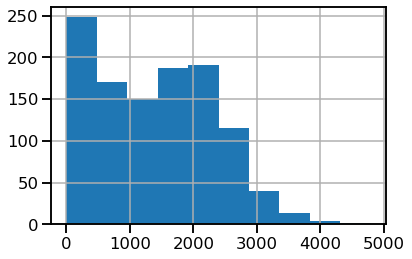

<IPython.core.display.Javascript object>

In [219]:
df_state_info_gs_census["enrollment"].hist()

In [220]:
df_state_info_gs_census.loc[
    :,
    [
        "name",
        "enrollment",
        "graduation_rates_gradRates_eligibility_allStudents",
        "graduation_rates_gradRates_eligibility_LIstudents",
    ],
].sort_values(by="enrollment").head(20)

,name,enrollment,graduation_rates_gradRates_eligibility_allStudents,graduation_rates_gradRates_eligibility_LIstudents
475,Yosemite Park High School,1.0,NaN,NaN
1112,Cold Springs High School,4.0,NaN,NaN
190,Clear Passage Educational Center,4.0,NaN,NaN
1111,South Fork High School,4.0,100.0,100.0
132,Mattole Triple Junction High School,9.0,NaN,NaN
488,Whale Gulch High School,9.0,100.0,100.0
489,Leggett Valley High School,14.0,NaN,NaN
146,Death Valley High Academy,17.0,80.0,75.0
462,Mountain Oaks High School,18.0,100.0,100.0
1013,Downieville Junior-Senior High School,20.0,100.0,100.0


<IPython.core.display.Javascript object>

In [221]:
df_state_info_gs_census["enrollment"].isnull().sum()

33

<IPython.core.display.Javascript object>

In [222]:
df_enrollment.head()

,E7,E8,E9,E10,E11,E12,EUS,ETOT,D7,D8,...,9_x,0_y,1_y,2_y,3_y,4_y,5_y,6_y,7_y,9_y
CDS_CODE,,,,,,,,,,,,,,,,,,,,,
1100170112607,0,0,115,108,96,88,0,407,0,0,...,5.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0
1316170131763,36,26,37,39,50,82,0,208,0,0,...,5.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0
1611190106401,0,0,44,47,47,37,0,175,0,0,...,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1611190130229,0,0,429,440,432,381,36,1718,0,0,...,67.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0
1611190130609,57,60,47,53,52,52,0,204,0,0,...,18.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


<IPython.core.display.Javascript object>

In [223]:
# Add enrollment per grades 9-12
e_grades = ["E9", "E10", "E11", "E12", "ETOT"]
df_state_info_gs_census = pd.merge(
    df_state_info_gs_census,
    df_enrollment[e_grades],
    how="left",
    left_on="CDSCode",
    right_index=True,
)
df_state_info_gs_census.head()

,Unnamed: 0,CDSCode,NCESDist,NCESSchool,StatusType,County,District,School,Street,StreetAbr,...,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 18 yrs and up,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 18-64 yrs,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up - People in families,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up - Unrelated individuals 15 yrs and up,E9,E10,E11,E12,ETOT
0,0,1100170112607,0691051,10947,Active,Alameda,Alameda County Office of Education,Envision Academy for Arts & Technology,1515 Webster Street,1515 Webster St.,...,31.0,28.9,39.3,17.1,39.3,115.0,108.0,96.0,88.0,407.0
1,1,1611190130229,0601770,00041,Active,Alameda,Alameda Unified,Alameda High,2200 Central Ave,2200 Central Ave,...,11.2,11.6,9.1,8.8,19.8,429.0,440.0,432.0,381.0,1718.0
2,2,1611190130625,0601770,08674,Active,Alameda,Alameda Unified,Alternatives in Action,6221 East 17th St,6221 East 17th St,...,28.0,29.2,17.4,30.9,43.6,41.0,43.0,50.0,31.0,165.0
3,23,1612590108944,0628050,10726,Active,Alameda,Oakland Unified,Lighthouse Community Charter High,444 Hegenberger Road,444 Hegenberger Rd.,...,28.0,29.2,17.4,30.9,43.6,80.0,62.0,59.0,59.0,260.0
4,3,1611270130450,0601860,00059,Active,Alameda,Albany City Unified,Albany High,603 Key Route Boulevard,603 Key Route Blvd.,...,11.5,12.3,6.2,8.5,25.3,307.0,314.0,302.0,285.0,1210.0


<IPython.core.display.Javascript object>

In [224]:
df_state_info_gs_census.shape

(1152, 223)

<IPython.core.display.Javascript object>

### Add COVID data

Are some areas being hit harder?
(3/27/20)

In [19]:
os.getcwd()

'/Users/lacar/Documents/Data_science/Jupyter_notebooks/Education_study'

<IPython.core.display.Javascript object>

In [20]:
os.listdir()
df_covid = pd.read_csv("/Users/lacar/Documents/Data_science/Jupyter_notebooks/covid_2020/covid-19-data/us-counties.csv")

df_covid["county_state"] = df_covid["county"] + " County, " + df_covid["state"]
df_covid.head()

,date,county,state,fips,cases,deaths,county_state
0,2020-01-21,Snohomish,Washington,53061.0,1,0,"Snohomish County, Washington"
1,2020-01-22,Snohomish,Washington,53061.0,1,0,"Snohomish County, Washington"
2,2020-01-23,Snohomish,Washington,53061.0,1,0,"Snohomish County, Washington"
3,2020-01-24,Cook,Illinois,17031.0,1,0,"Cook County, Illinois"
4,2020-01-24,Snohomish,Washington,53061.0,1,0,"Snohomish County, Washington"


<IPython.core.display.Javascript object>

In [21]:
df_covid.shape

(35698, 7)

<IPython.core.display.Javascript object>

#### CA

In [150]:
df_covid_CA = df_covid[df_covid["state"].isin(states_list)].copy()
df_covid_CA_by_date = df_covid_CA.groupby("date").sum()
df_covid_CA_by_date.reset_index(inplace=True)
df_covid_CA_by_date[["new_cases", "new_deaths"]] = df_covid_CA_by_date.loc[
    :, ["cases", "deaths"]
].diff()
df_covid_CA_by_date

,date,fips,cases,deaths,new_cases,new_deaths
0,2020-01-21,53061.0,1,0,NaN,NaN
1,2020-01-22,53061.0,1,0,0.0,0.0
2,2020-01-23,53061.0,1,0,0.0,0.0
3,2020-01-24,53061.0,1,0,0.0,0.0
4,2020-01-25,59120.0,2,0,1.0,0.0
...,...,...,...,...,...,...
62,2020-03-23,2073197.0,4606,153,721.0,19.0
63,2020-03-24,2091304.0,5433,181,827.0,28.0
64,2020-03-25,2241517.0,6176,208,743.0,27.0
65,2020-03-26,2241517.0,7740,245,1564.0,37.0


<IPython.core.display.Javascript object>

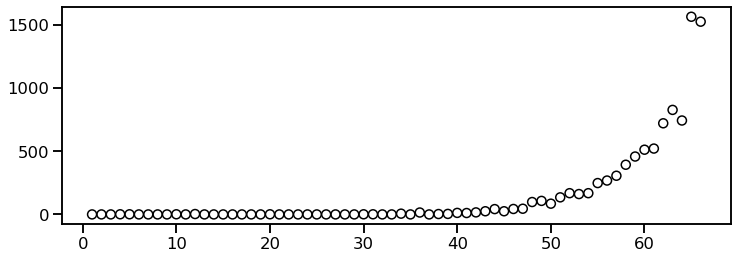

<IPython.core.display.Javascript object>

In [151]:
f, ax1 = plt.subplots(figsize=(12, 4))

ax1.scatter(df_covid_CA_by_date.index, df_covid_CA_by_date["new_cases"], facecolors='none', edgecolors='k');


In [22]:
def reorg_table_by_category(df_county_state_lim, category):
    # Re-org table
    df_covid_states_county_by_date_county_category = (
        df_county_state_lim.groupby(["date", "county_state"]).sum()[category].unstack()
    )
    df_covid_states_county_by_date_county_category.dropna(how="all", inplace=True)
    df_covid_states_county_by_date_county_category.reset_index(inplace=True)

    return df_covid_states_county_by_date_county_category

<IPython.core.display.Javascript object>

## Feature confirmation

In [225]:
sns.set_context(
    "talk", rc={"font.size": 12, "axes.titlesize": 14, "axes.labelsize": 10}
)

<IPython.core.display.Javascript object>

In [226]:
def scatter_plot_open_circles(df, feature_x, feature_y, ax):
    x = df[feature_x]
    y = df[feature_y]
    ax.scatter(x, y, facecolors="none", edgecolors=B_dkgray)
    ax.set_xlabel(feature_x)
    ax.set_ylabel(feature_y)

<IPython.core.display.Javascript object>

In [227]:
def hist_plot(df, feature, ax):
    df[feature].hist(ax=ax, bins=30, color=B_slate)
    ax.set_title(feature)

<IPython.core.display.Javascript object>

### Feature engineering and categories

**Generate a non low income college eligibility percentage**

Given:
- pct low income students
- pct of all students college eligible
- pct of low income that are college eligible (SPLICE)
- enrollment, including grade 12

Get:
- pct non low income students  = 100 - (pct_LI_students)
- number graduated from E12

In [228]:
df_state_info_gs_census["School"].head()

0    Envision Academy for Arts & Technology
1                              Alameda High
2                    Alternatives in Action
3         Lighthouse Community Charter High
4                               Albany High
Name: School, dtype: object

<IPython.core.display.Javascript object>

In [231]:
df_state_info_gs_census[
    [
        "School",
        "enrollment",
        "ETOT",
        "E12",
        "pct_LI_students",
        "graduation_rates_UCCSU_eligibility_LIstudents",
        "graduation_rates_UCCSU_eligibility_allStudents",
    ]
].head()

,School,enrollment,ETOT,E12,pct_LI_students,graduation_rates_UCCSU_eligibility_LIstudents,graduation_rates_UCCSU_eligibility_allStudents
0,Envision Academy for Arts & Technology,407.0,407.0,88.0,67.0,100.0,100.0
1,Alameda High,1853.0,1718.0,381.0,18.0,50.0,66.0
2,Alternatives in Action,165.0,165.0,31.0,NaN,100.0,100.0
3,Lighthouse Community Charter High,214.0,260.0,59.0,80.0,100.0,100.0
4,Albany High,1210.0,1210.0,285.0,17.0,45.0,63.0


<IPython.core.display.Javascript object>

In [377]:
# Have a non low income college eligibility

# Given pct low income students
df_state_info_gs_census["pct_nonLI_students"] = (
    100 - df_state_info_gs_census["pct_LI_students"]
)
df_state_info_gs_census["est_LI_grade12_students"] = (
    df_state_info_gs_census["E12"] * 0.01 * df_state_info_gs_census["pct_LI_students"]
)
df_state_info_gs_census["est_nonLI_grade12_students"] = (
    df_state_info_gs_census["E12"]
    * 0.01
    * df_state_info_gs_census["pct_nonLI_students"]
)

df_state_info_gs_census["est_UCCSU_eligible_all"] = (
    df_state_info_gs_census["E12"]
    * 0.01
    * df_state_info_gs_census["graduation_rates_UCCSU_eligibility_allStudents"]
)
df_state_info_gs_census["est_UCCSU_eligible_LI"] = (
    df_state_info_gs_census["est_LI_grade12_students"]
    * 0.01
    * df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"]
)
df_state_info_gs_census["est_UCCSU_eligible_nonLI"] = (
    df_state_info_gs_census["est_UCCSU_eligible_all"]
    - df_state_info_gs_census["est_UCCSU_eligible_LI"]
)
df_state_info_gs_census["graduation_rates_UCCSU_eligibility_nonLIstudents"] = 100 * (
    df_state_info_gs_census["est_UCCSU_eligible_nonLI"]
    / df_state_info_gs_census["est_nonLI_grade12_students"]
)

df_state_info_gs_census["nonLI-LI_UCCSU_eligibility_gap"] = (
    df_state_info_gs_census["graduation_rates_UCCSU_eligibility_nonLIstudents"]
    - df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"]
)

<IPython.core.display.Javascript object>

In [378]:
df_state_info_gs_census.head()

,Unnamed: 0,CDSCode,NCESDist,NCESSchool,StatusType,County,District,School,Street,StreetAbr,...,pct_nonLI_students,est_LI_grade12_students,est_nonLI_grade12_students,est_UCCSU_eligible_all,est_UCCSU_eligible_LI,est_UCCSU_eligible_nonLI,graduation_rates_UCCSU_eligibility_nonLIstudents,Magnet_cat_encoded,Charter_cat_encoded,nonLI-LI_UCCSU_eligibility_gap
0,0,1100170112607,0691051,10947,Active,Alameda,Alameda County Office of Education,Envision Academy for Arts & Technology,1515 Webster Street,1515 Webster St.,...,33.0,58.96,29.04,88.00,58.9600,29.0400,100.000000,0.0,1,0.000000e+00
1,1,1611190130229,0601770,00041,Active,Alameda,Alameda Unified,Alameda High,2200 Central Ave,2200 Central Ave,...,82.0,68.58,312.42,251.46,34.2900,217.1700,69.512195,0.0,0,1.951220e+01
2,2,1611190130625,0601770,08674,Active,Alameda,Alameda Unified,Alternatives in Action,6221 East 17th St,6221 East 17th St,...,NaN,NaN,NaN,31.00,NaN,NaN,NaN,0.0,1,NaN
3,23,1612590108944,0628050,10726,Active,Alameda,Oakland Unified,Lighthouse Community Charter High,444 Hegenberger Road,444 Hegenberger Rd.,...,20.0,47.20,11.80,59.00,47.2000,11.8000,100.000000,0.0,1,4.263256e-14
4,3,1611270130450,0601860,00059,Active,Alameda,Albany City Unified,Albany High,603 Key Route Boulevard,603 Key Route Blvd.,...,83.0,48.45,236.55,179.55,21.8025,157.7475,66.686747,0.0,0,2.168675e+01


<IPython.core.display.Javascript object>

In [379]:
df_state_info_gs_census[
    [
        "School",
        "enrollment",
        "ETOT",
        "E12",
        "pct_LI_students",
        "pct_nonLI_students",
        "graduation_rates_UCCSU_eligibility_LIstudents",
        "graduation_rates_UCCSU_eligibility_nonLIstudents",
        "graduation_rates_UCCSU_eligibility_allStudents",
        "nonLI-LI_UCCSU_eligibility_gap",
    ]
].tail()

,School,enrollment,ETOT,E12,pct_LI_students,pct_nonLI_students,graduation_rates_UCCSU_eligibility_LIstudents,graduation_rates_UCCSU_eligibility_nonLIstudents,graduation_rates_UCCSU_eligibility_allStudents,nonLI-LI_UCCSU_eligibility_gap
1147,Woodland Senior High,1318.0,1318.0,300.0,63.0,37.0,38.0,48.810811,42.0,10.810811
1148,Lindhurst High,1122.0,1122.0,249.0,84.0,16.0,30.0,36.250000,31.0,6.250000
1149,Marysville Charter Academy for the Arts,376.0,232.0,38.0,44.0,56.0,72.0,63.071429,67.0,-8.928571
1150,Marysville High,893.0,893.0,202.0,62.0,38.0,29.0,39.526316,33.0,10.526316
1151,Wheatland Union High,707.0,707.0,168.0,37.0,63.0,51.0,52.587302,52.0,1.587302


<IPython.core.display.Javascript object>

In [258]:
# Replace magnet and charter status with category encoding variables
df_state_info_gs_census["Magnet_cat_encoded"] = df_state_info_gs_census[
    "Magnet"
].replace({"No Data": None, "N": 0, "Y": 1})
df_state_info_gs_census["Charter_cat_encoded"] = df_state_info_gs_census[
    "Charter"
].replace({"No Data": None, "N": 0, "Y": 1})

<IPython.core.display.Javascript object>

In [259]:
# Census columns that start with '%'
col_census_pct = df_state_info_gs_census.columns[
    df_state_info_gs_census.columns.str.startswith("%")
]
# Broad categories in pct census columns
print(set([i.split("-")[0] for i in col_census_pct.tolist()]))

{'%; HEALTH_INS_COVERAGE ', '%; WORKER_CLASS ', '%; INCOME_BENEFITS ', '%; INDUSTRY ', '%; %', '%; EMPLOY_STATUS ', '%; WORK_COMMUTE ', '%; OCCUPATION '}


<IPython.core.display.Javascript object>

In [260]:
# Census income columns (starts with 'Est')
col_census_est = df_state_info_gs_census.columns[
    df_state_info_gs_census.columns.str.startswith("Est")
]
# Change so that all are numeric/float, using appply
df_state_info_gs_census[col_census_est] = (
    df_state_info_gs_census[col_census_est]
    .apply(pd.to_numeric, errors="coerce")
    .dropna()
    .astype("float")
)
col_census_est.tolist()

['Est.; INCOME_BENEFITS - Total households - Median household income ($)',
 'Est.; INCOME_BENEFITS - Total households - Mean household income ($)',
 'Est.; INCOME_BENEFITS - w/ Social Security - Mean Social Security income ($)',
 'Est.; INCOME_BENEFITS - w/ retirement income',
 'Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($)',
 'Est.; INCOME_BENEFITS - w/ cash public assistance income',
 'Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)',
 'Est.; INCOME_BENEFITS - Families - Median family income ($)',
 'Est.; INCOME_BENEFITS - Families - Mean family income ($)',
 'Est.; INCOME_BENEFITS - Per capita income ($)',
 'Est.; INCOME_BENEFITS - Nonfamily households - Median nonfamily income ($)',
 'Est.; INCOME_BENEFITS - Nonfamily households - Mean nonfamily income ($)']

<IPython.core.display.Javascript object>

In [261]:
# School info columns
col_school_info_magnet_charter = ["Magnet_cat_encoded", "Charter_cat_encoded"]
col_school_info_magnet_charter

['Magnet_cat_encoded', 'Charter_cat_encoded']

<IPython.core.display.Javascript object>

In [262]:
# High level GS school rating columns
col_hl_ratings = [
    "college_readiness",
    "test_scores",
    "advanced_courses",
    "equity_overview",
    "race_ethnicity",
    "low_income",
    "disabilities",
]
col_gs_hl_ratings = ["gsRating"] + col_hl_ratings
# df_state_info_gs_census[col_gs_hl_ratings] = df_state_info_gs_census[col_gs_hl_ratings].apply(pd.to_numeric, errors='coerce').dropna().astype('float')
# Data types look like they're already float
# initial_analysis(df_state_info_gs_census[col_gs_hl_ratings])
col_gs_hl_ratings

['gsRating',
 'college_readiness',
 'test_scores',
 'advanced_courses',
 'equity_overview',
 'race_ethnicity',
 'low_income',
 'disabilities']

<IPython.core.display.Javascript object>

In [263]:
col_teacher_ratings = [
    "students_per_teacher",
    "students_per_counselor",
    "pct_teachers_3years_or_more",
    "pct_teachers_who_r_certified",
    "avg_teacher_salary",
]
col_teacher_ratings

['students_per_teacher',
 'students_per_counselor',
 'pct_teachers_3years_or_more',
 'pct_teachers_who_r_certified',
 'avg_teacher_salary']

<IPython.core.display.Javascript object>

In [269]:
col_lowincome_ratings = [
    "test_score_rating_allStudents",
    "test_score_rating_LIstudents",
    "test_score_rating_notLIstudents",
    "test_scores_english_allStudents",
    "test_scores_english_allStudents_n_students",
    "test_scores_english_LIstudents",
    "test_scores_english_LIstudents_n_students",
    "test_scores_math_allStudents",
    "test_scores_math_allStudents_n_students",
    "test_scores_math_LIstudents",
    "test_scores_math_LIstudents_n_students",
    "graduation_rates_UCCSU_eligibility_allStudents",
    "graduation_rates_UCCSU_eligibility_LIstudents",
    "graduation_rates_UCCSU_eligibility_nonLIstudents",
    "graduation_rates_gradRates_eligibility_allStudents",
    "graduation_rates_gradRates_eligibility_LIstudents",
    "pct_LI_students",
]

# Need to remove target from this list without altering original list
col_lowincome_ratings_notarget = col_lowincome_ratings[:]
col_lowincome_ratings_notarget.remove("graduation_rates_UCCSU_eligibility_LIstudents")
col_lowincome_ratings_notarget

['test_score_rating_allStudents',
 'test_score_rating_LIstudents',
 'test_score_rating_notLIstudents',
 'test_scores_english_allStudents',
 'test_scores_english_allStudents_n_students',
 'test_scores_english_LIstudents',
 'test_scores_english_LIstudents_n_students',
 'test_scores_math_allStudents',
 'test_scores_math_allStudents_n_students',
 'test_scores_math_LIstudents',
 'test_scores_math_LIstudents_n_students',
 'graduation_rates_UCCSU_eligibility_allStudents',
 'graduation_rates_UCCSU_eligibility_nonLIstudents',
 'graduation_rates_gradRates_eligibility_allStudents',
 'graduation_rates_gradRates_eligibility_LIstudents',
 'pct_LI_students']

<IPython.core.display.Javascript object>

### First pass feature filtering

In [270]:
all_features = (
    ["enrollment"]
    + col_census_pct.tolist()
    + col_census_est.tolist()
    + col_school_info_magnet_charter
    + col_gs_hl_ratings
    + col_teacher_ratings
    + col_lowincome_ratings_notarget
)

<IPython.core.display.Javascript object>

In [271]:
# Check for features that have been duplicated
# [i for i in col_census_pct.tolist() if ("_y" not in i)]
all_features = [i for i in all_features if ("_y" not in i)]

<IPython.core.display.Javascript object>

In [272]:
all_features_filt = (
    df_state_info_gs_census[all_features]
    .dropna(thresh=0.67 * len(df_state_info_gs_census), axis=1)
    .columns.tolist()
)

<IPython.core.display.Javascript object>

In [273]:
print(
    "No. of features where at least 2/3 of the schools have values for a feature: \n",
    len(all_features_filt),
)

No. of features where at least 2/3 of the schools have values for a feature: 
 137


<IPython.core.display.Javascript object>

In [274]:
# Identify which features were removed
print(
    "Features that had too many missing values: ",
    set(all_features) - set(all_features_filt),
)

Features that had too many missing values:  {'advanced_courses', 'disabilities', 'race_ethnicity'}


<IPython.core.display.Javascript object>

## Check for normally distributed features

In [65]:
# Looking at Shapiro-Wilk test - this is like taking the slope of a Q-Q plot https://www.youtube.com/watch?v=dRAqSsgkCUc
from scipy.stats import shapiro

for col in df_state_info_gs_census[all_features_filt].columns:
    try:
        stat, p = shapiro(df_state_info_gs_census[col])
        if p > 0.05:
            print(stat, p, col)
    except:
        continue

nan 1.0 %; EMPLOY_STATUS - Own children of the householder under 6 yrs - All parents in family in labor force
nan 1.0 %; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Unemployed: - w/ health ins coverage
nan 1.0 %; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Unemployed: - w/ health ins coverage - w/ private health insurance
nan 1.0 %; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Unemployed: - w/ health ins coverage - w/ public coverage
nan 1.0 %; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Unemployed: - No health ins coverage
nan 1.0 Est.; INCOME_BENEFITS - Total households - Median household income ($)
nan 1.0 Est.; INCOME_BENEFITS - Total households - Mean household income ($)
nan 1.0 Est.; INCOME_BENEFITS - w/ Social Security - Mean Social Security income ($)
nan 1.0 Est.; INCOME_BENEFITS - w/ retirement income
nan 1

<IPython.core.display.Javascript object>

In [66]:
len(all_features_filt)

136

<IPython.core.display.Javascript object>

### Check for correlated features

Evaluate VIF - Variance inflation factor

- VIF is greater than 10 then remove? An arbitrary cut-off, may be dependent on the task

In [275]:
df_state_info_gs_census[
    [
        "enrollment",
        "pct_LI_students",
        "graduation_rates_gradRates_eligibility_LIstudents",
    ]
].sort_values(by="enrollment")

,enrollment,pct_LI_students,graduation_rates_gradRates_eligibility_LIstudents
475,1.0,NaN,NaN
1112,4.0,NaN,NaN
190,4.0,NaN,NaN
1111,4.0,NaN,100.0
132,9.0,NaN,NaN
...,...,...,...
809,NaN,NaN,NaN
908,NaN,NaN,NaN
945,NaN,NaN,11.0
993,NaN,NaN,NaN


<IPython.core.display.Javascript object>

In [276]:
df_state_info_gs_census[
    "graduation_rates_gradRates_eligibility_LIstudents"
].isnull().sum()

72

<IPython.core.display.Javascript object>

### Census category text inspection

Before filtering:
- INCOME_BENEFITS - percentage (28 columns) - check for redundant columns and correlated and anti-correlated features
- INCOME_BENEFITS - estimated values - (12 columns) - manually select features
- HEALTH_INS_COVERAGE (17 columns) - manually select columns
- WORK_COMMUTE - adds to 100% (6 columns) - interesting to keep, but drop rare categories
- OCCUPATION - adds to 100% (5 columns) - perhaps drop - may be redundant with industry
- INDUSTRY - adds to 100% (13 columns) - interesting to keep but inspect
- WORKER_CLASS - adds to 100% (4 columns) - OK to keep but inspect
- EMPLOY_STATUS - (12 columns) - OK to keep but inspect
- %-AGE_FAMILIES_INCOME_BELOW_POVERTY (13 columns) - follow up


In [277]:
[print(i) for i in col_census_pct]

%; INCOME_BENEFITS - w/ retirement income_x
%; INCOME_BENEFITS - w/ cash public assistance income_x
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Employed
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Unemployed
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces
%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force
%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed
%; EMPLOY_STATUS - Own children of the householder under 6 yrs - All parents in family in labor force
%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - 

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

<IPython.core.display.Javascript object>

#### Income benefits columns

##### Evaluation of pct income benefits columns

In [278]:
col_census_pct_ib = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains("INCOME_BENEFITS")
].tolist()

# Drop columns containing '%; INCOME_BENEFITS - Families -' since it's redundant with '%; INCOME_BENEFITS - Total households - '
col2drop = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains(
        "%; INCOME_BENEFITS - Families"
    )
].tolist()

# Drop duplicated columns
col2drop = col2drop + [
    "%; INCOME_BENEFITS - w/ retirement income_y",
    "%; INCOME_BENEFITS - w/ cash public assistance income_y",
]

col_census_pct_ib = list(set(col_census_pct_ib) - set(col2drop))

# Iteration 1 - hand select other columns to account for correlations anti-correlations, etc.
col_census_pct_ib = [
    "%; INCOME_BENEFITS - Total households - Less than $10,000",
    "%; INCOME_BENEFITS - Total households - $10,000 to $14,999",
    "%; INCOME_BENEFITS - Total households - $15,000 to $24,999",
    "%; INCOME_BENEFITS - Total households - $25,000 to $34,999",
    "%; INCOME_BENEFITS - Total households - $35,000 to $49,999",
    "%; INCOME_BENEFITS - Total households - $50,000 to $74,999",
    "%; INCOME_BENEFITS - Total households - $75,000 to $99,999",
    "%; INCOME_BENEFITS - Total households - $100,000 to $149,999",
    "%; INCOME_BENEFITS - Total households - $150,000 to $199,999",
    "%; INCOME_BENEFITS - Total households - $200,000 or more",
    "%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months",
    "%; INCOME_BENEFITS - w/ Social Security",
    "%; INCOME_BENEFITS - w/ Supplemental Security Income",
]

<IPython.core.display.Javascript object>

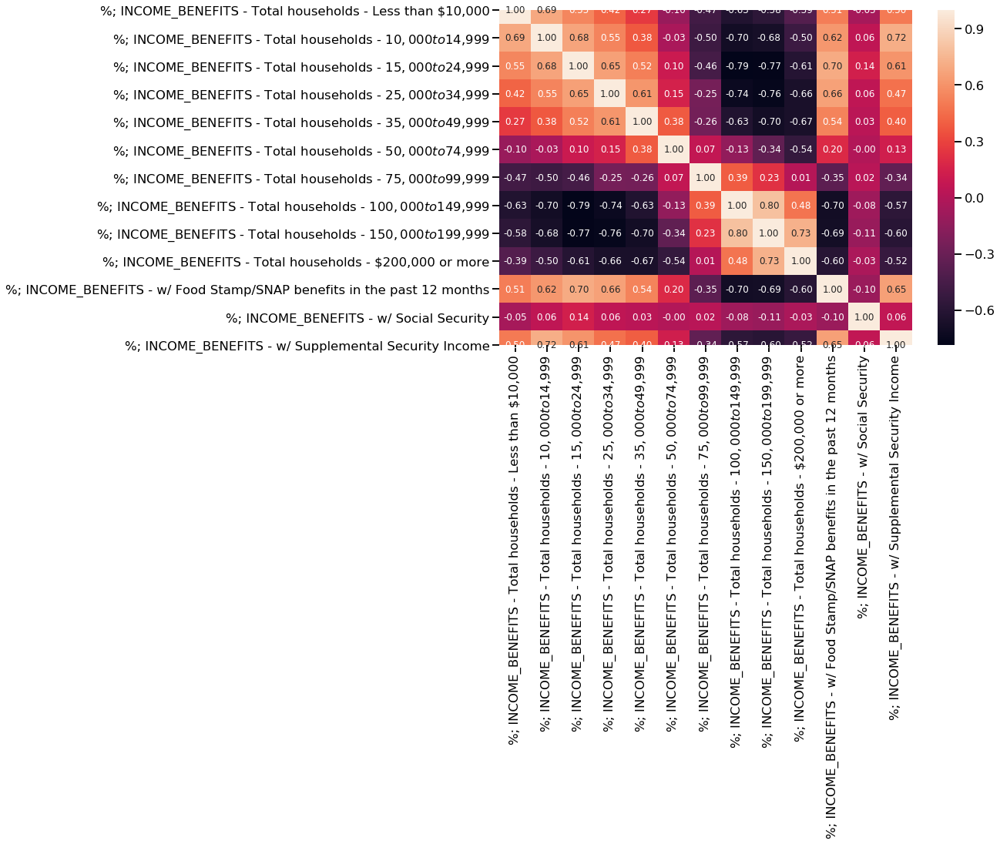

<IPython.core.display.Javascript object>

In [279]:
# Check for correlated and anti-correlated features - done before and after column filtering
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_ib].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

/Users/lacar/anaconda/envs/insight/lib/python3.6/site-packages/seaborn/axisgrid.py:1306: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.tight_layout()


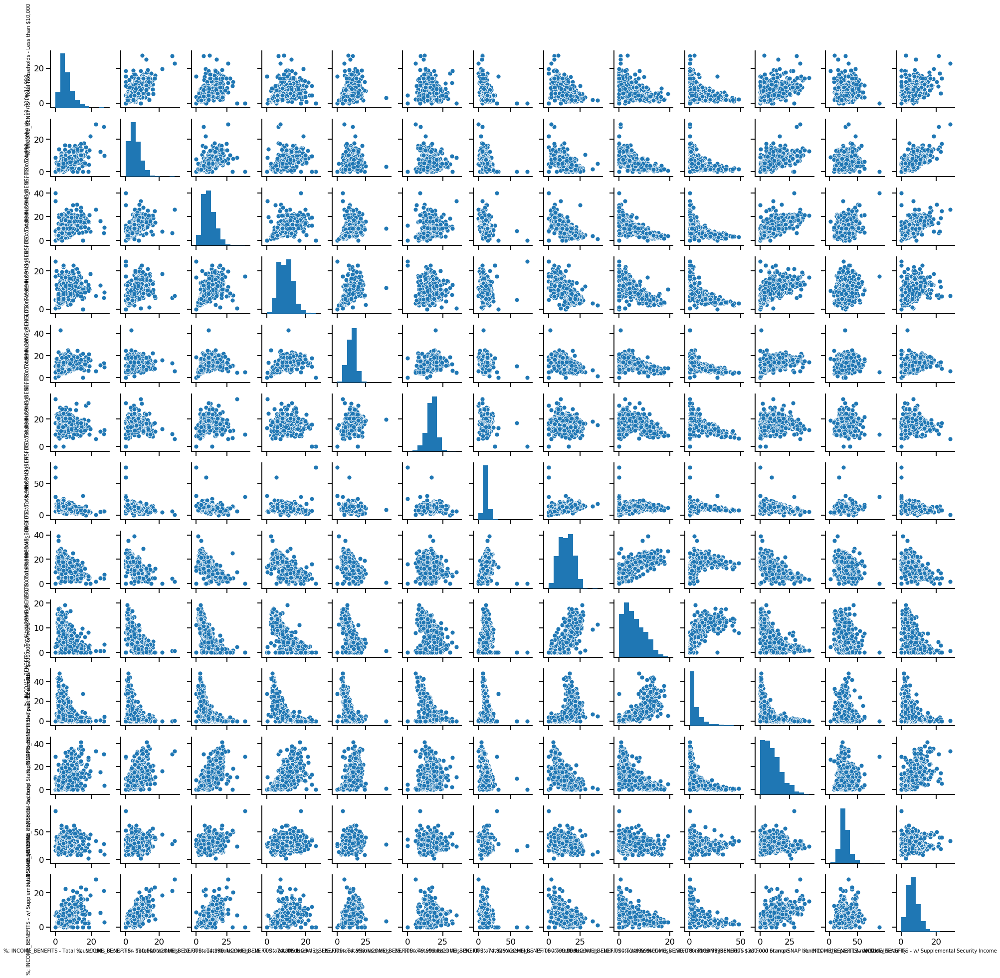

<IPython.core.display.Javascript object>

In [280]:
# Categorical breakdown of percent household income
sns.pairplot(df_state_info_gs_census.loc[:, col_census_pct_ib])

In [281]:
# Iteration 2 - hand select other columns to account for correlations anti-correlations, etc.

# % cash public assistance correlates with Food Stamp benefits
col_census_pct_ib_final = [
    "%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months",
    "%; INCOME_BENEFITS - w/ Social Security",
    "%; INCOME_BENEFITS - w/ Supplemental Security Income",
]

<IPython.core.display.Javascript object>

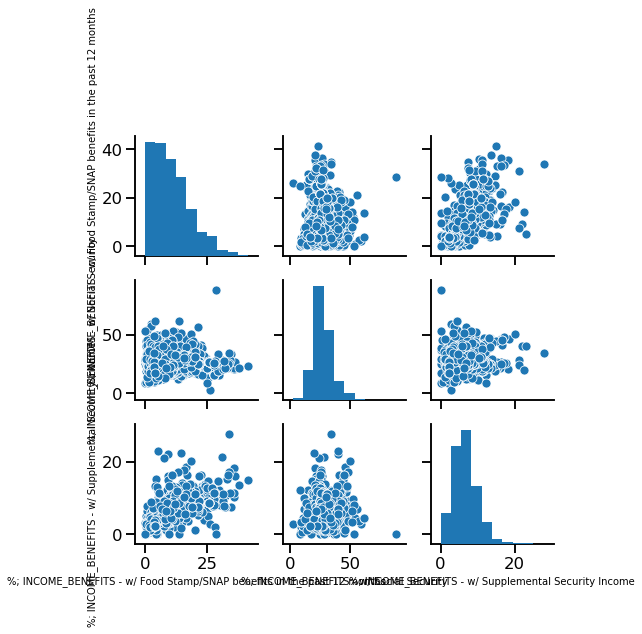

<IPython.core.display.Javascript object>

In [282]:
# Categorical breakdown of percent household income after feature culling
sns.pairplot(df_state_info_gs_census.loc[:, col_census_pct_ib_final]);


In [283]:
# View all correlation values, reshaping table
# df_state_info_gs_census[col_census_pct_ib[0:3]].corr(method='pearson')

<IPython.core.display.Javascript object>

##### Evaluation of estimated income benefits

In [284]:
col_census_est_ib = col_census_est[
    df_state_info_gs_census[col_census_est].columns.str.contains("INCOME_BENEFITS")
]
col_census_est_ib

Index(['Est.; INCOME_BENEFITS - Total households - Median household income ($)',
       'Est.; INCOME_BENEFITS - Total households - Mean household income ($)',
       'Est.; INCOME_BENEFITS - w/ Social Security - Mean Social Security income ($)',
       'Est.; INCOME_BENEFITS - w/ retirement income',
       'Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($)',
       'Est.; INCOME_BENEFITS - w/ cash public assistance income',
       'Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)',
       'Est.; INCOME_BENEFITS - Families - Median family income ($)',
       'Est.; INCOME_BENEFITS - Families - Mean family income ($)',
       'Est.; INCOME_BENEFITS - Per capita income ($)',
       'Est.; INCOME_BENEFITS - Nonfamily households - Median nonfamily income ($)',
       'Est.; INCOME_BENEFITS - Nonfamily households - Mean nonfamily income ($)'],
      dtype='object')

<IPython.core.display.Javascript object>

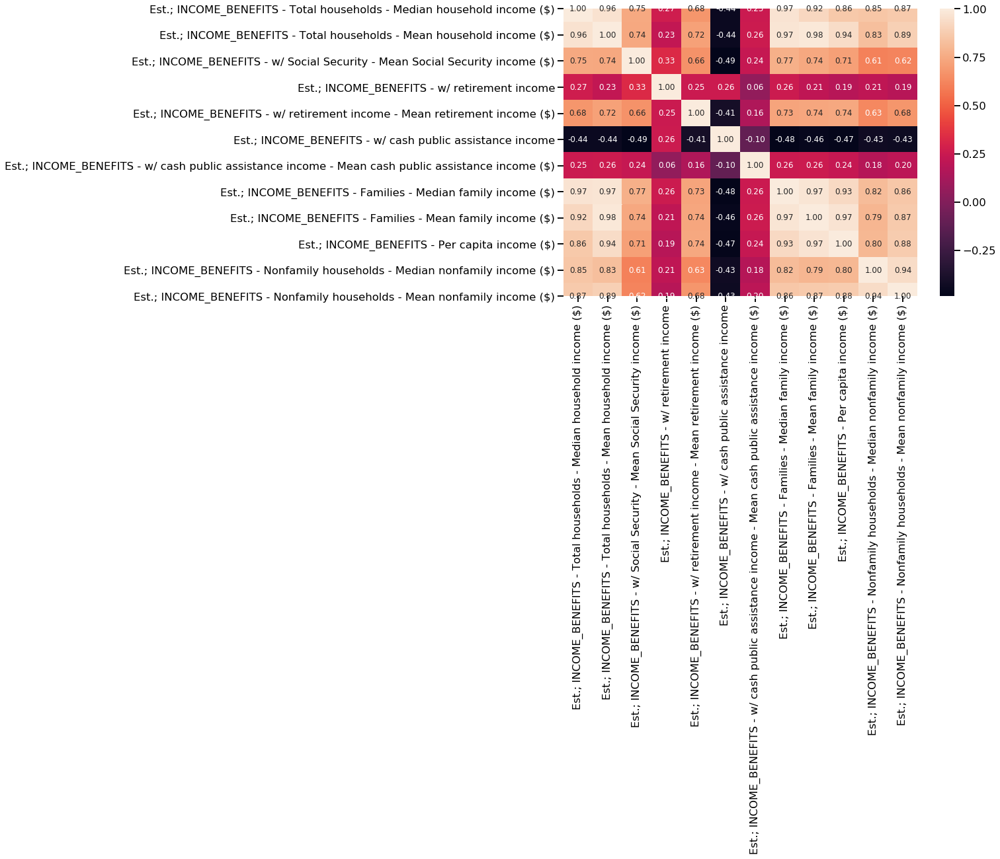

<IPython.core.display.Javascript object>

In [285]:
# Check for correlated and anti-correlated features - done before and after column filtering
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(
    df_state_info_gs_census[col_census_est_ib].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

In [286]:
# Iteration 1 - hand select other columns to account for correlations anti-correlations, etc.
col_census_est_ib_final = [
    "Est.; INCOME_BENEFITS - Total households - Median household income ($)",
    "Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($)",
    "Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)",
]

<IPython.core.display.Javascript object>

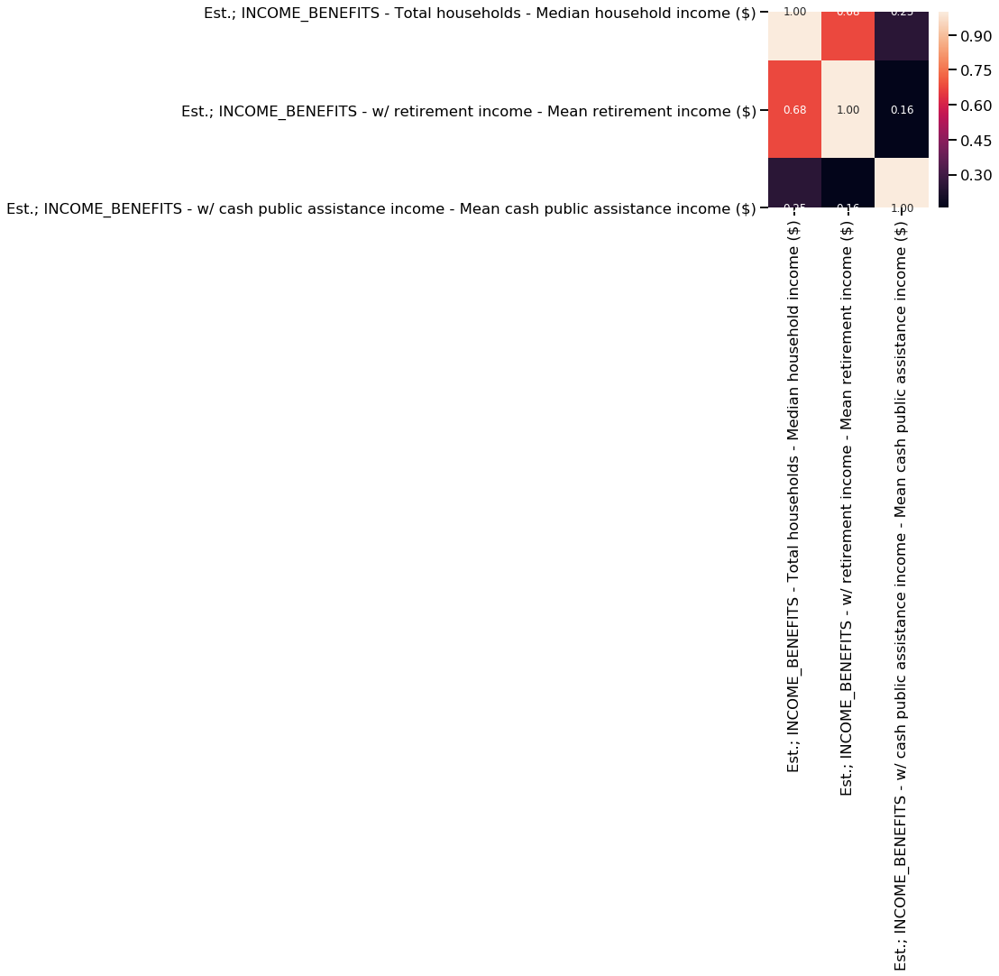

<IPython.core.display.Javascript object>

In [287]:
# Check for correlated and anti-correlated features - done before and after column filtering
fig, ax = plt.subplots(figsize=(4, 4))
sns.heatmap(
    df_state_info_gs_census[col_census_est_ib_final].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

##### Examination space with text inspection

In [288]:
category_col = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains("INCOME_BENEFITS")
]
category_col

Index(['%; INCOME_BENEFITS - w/ retirement income_x',
       '%; INCOME_BENEFITS - w/ cash public assistance income_x',
       '%; INCOME_BENEFITS - Total households - Less than $10,000',
       '%; INCOME_BENEFITS - Total households - $10,000 to $14,999',
       '%; INCOME_BENEFITS - Total households - $15,000 to $24,999',
       '%; INCOME_BENEFITS - Total households - $25,000 to $34,999',
       '%; INCOME_BENEFITS - Total households - $35,000 to $49,999',
       '%; INCOME_BENEFITS - Total households - $50,000 to $74,999',
       '%; INCOME_BENEFITS - Total households - $75,000 to $99,999',
       '%; INCOME_BENEFITS - Total households - $100,000 to $149,999',
       '%; INCOME_BENEFITS - Total households - $150,000 to $199,999',
       '%; INCOME_BENEFITS - Total households - $200,000 or more',
       '%; INCOME_BENEFITS - w/ earnings',
       '%; INCOME_BENEFITS - w/ Social Security',
       '%; INCOME_BENEFITS - w/ retirement income_y',
       '%; INCOME_BENEFITS - w/ Supplement

<IPython.core.display.Javascript object>

In [289]:
category_col = col_census_est[
    df_state_info_gs_census[col_census_est].columns.str.contains("INCOME_BENEFITS")
]
len(category_col)

12

<IPython.core.display.Javascript object>

In [290]:
df_state_info_gs_census[category_col].head()

,Est.; INCOME_BENEFITS - Total households - Median household income ($),Est.; INCOME_BENEFITS - Total households - Mean household income ($),Est.; INCOME_BENEFITS - w/ Social Security - Mean Social Security income ($),Est.; INCOME_BENEFITS - w/ retirement income,Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($),Est.; INCOME_BENEFITS - w/ cash public assistance income,Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($),Est.; INCOME_BENEFITS - Families - Median family income ($),Est.; INCOME_BENEFITS - Families - Mean family income ($),Est.; INCOME_BENEFITS - Per capita income ($),Est.; INCOME_BENEFITS - Nonfamily households - Median nonfamily income ($),Est.; INCOME_BENEFITS - Nonfamily households - Mean nonfamily income ($)
0,32993.0,55911.0,12978.0,659.0,29027.0,368.0,5055.0,38980.0,67067.0,32425.0,29122.0,51831.0
1,72884.0,99612.0,17113.0,3804.0,32115.0,827.0,4632.0,88693.0,118416.0,41592.0,52815.0,67936.0
2,31903.0,43104.0,12293.0,1086.0,19269.0,1268.0,5347.0,34633.0,44970.0,13082.0,18963.0,28948.0
3,31903.0,43104.0,12293.0,1086.0,19269.0,1268.0,5347.0,34633.0,44970.0,13082.0,18963.0,28948.0
4,80970.0,105995.0,17921.0,1085.0,36487.0,83.0,4229.0,95880.0,118328.0,42019.0,49099.0,74376.0


<IPython.core.display.Javascript object>

In [291]:
df_state_info_gs_census[category_col].sum(axis=1)

0       356416.0
1       600439.0
2       254866.0
3       254866.0
4       626472.0
          ...   
1147    434406.0
1148    367796.0
1149    342714.0
1150    342714.0
1151    430859.0
Length: 1152, dtype: float64

<IPython.core.display.Javascript object>

##### Examination space with visualizations of various features

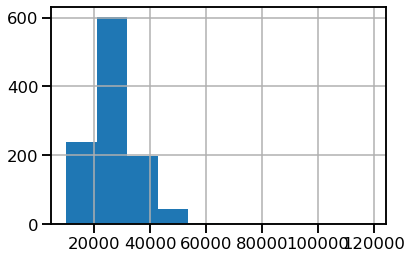

<IPython.core.display.Javascript object>

In [292]:
# Histogram
df_state_info_gs_census[category_col].iloc[:, 4].hist()

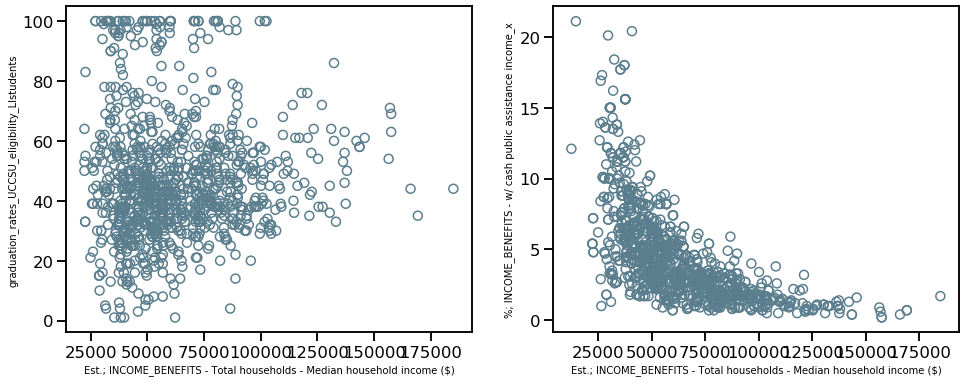

<IPython.core.display.Javascript object>

In [293]:
# Scatter plots
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
scatter_plot_open_circles(df_state_info_gs_census, 
                          'Est.; INCOME_BENEFITS - Total households - Median household income ($)', 
                          'graduation_rates_UCCSU_eligibility_LIstudents', 
                          ax1)

scatter_plot_open_circles(df_state_info_gs_census, 
                          'Est.; INCOME_BENEFITS - Total households - Median household income ($)', 
                          '%; INCOME_BENEFITS - w/ cash public assistance income_x', 
                          ax2)


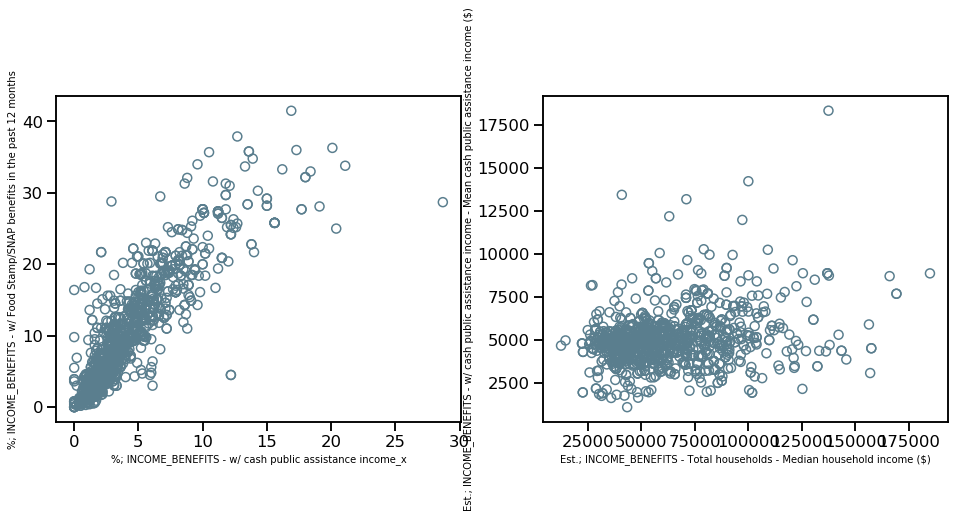

<IPython.core.display.Javascript object>

In [294]:
# Scatter plots
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
scatter_plot_open_circles(df_state_info_gs_census, 
                          '%; INCOME_BENEFITS - w/ cash public assistance income_x', 
                          '%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months', 
                          ax1)

scatter_plot_open_circles(df_state_info_gs_census, 
                          'Est.; INCOME_BENEFITS - Total households - Median household income ($)',
                          'Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)', 
                          ax2)


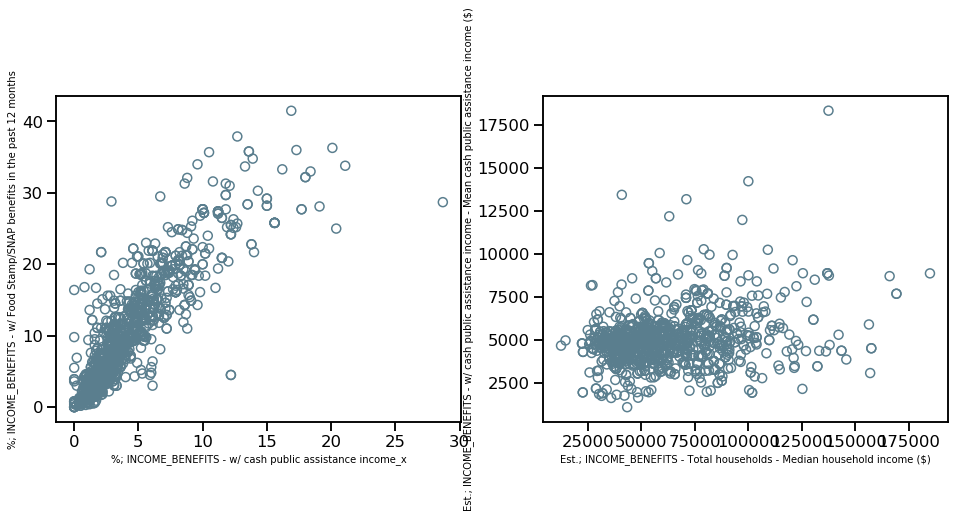

<IPython.core.display.Javascript object>

In [295]:
# Scatter plots - do I need percent and estimated income benefit columns?
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; INCOME_BENEFITS - w/ cash public assistance income_x",
    "%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months",
    ax1,
)

scatter_plot_open_circles(
    df_state_info_gs_census,
    "Est.; INCOME_BENEFITS - Total households - Median household income ($)",
    "Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)",
    ax2,
)

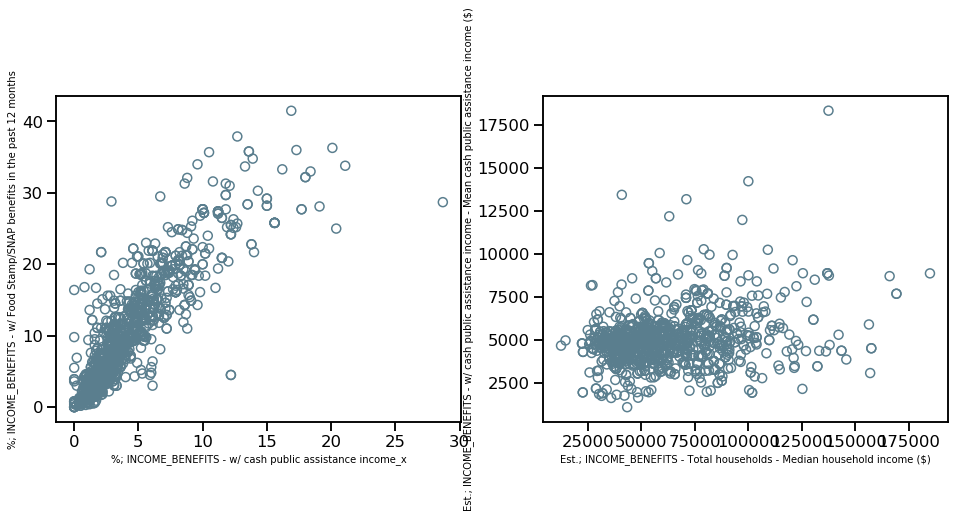

<IPython.core.display.Javascript object>

In [296]:
# Scatter plots - do I need percent and estimated income benefit columns?
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
scatter_plot_open_circles(df_state_info_gs_census, 
                          '%; INCOME_BENEFITS - w/ cash public assistance income_x', 
                          '%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months', 
                          ax1)

scatter_plot_open_circles(df_state_info_gs_census, 
                          'Est.; INCOME_BENEFITS - Total households - Median household income ($)',
                          'Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)', 
                          ax2)


#### Health insurance columns

In [297]:
col_census_pct_hi = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains("HEALTH_INS")
].tolist()

<IPython.core.display.Javascript object>

In [298]:
col_census_pct_hi

['%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ private health insurance',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - No health ins coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Employed: - w/ health ins coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Employed: - w/ health ins coverage - w/ private health insurance',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Employed: - w/ health ins coverage - w/ public coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized p

<IPython.core.display.Javascript object>

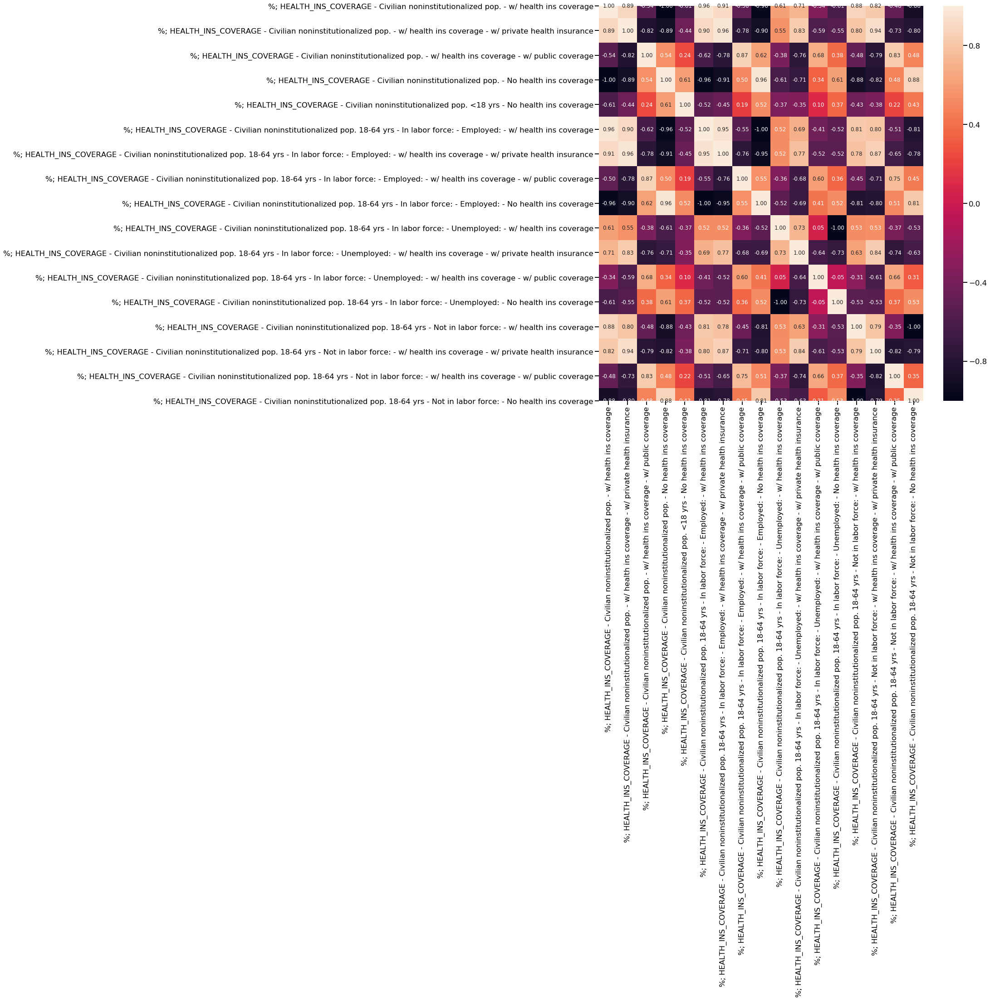

<IPython.core.display.Javascript object>

In [299]:
fig, ax = plt.subplots(figsize=(16, 16))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_hi].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

In [300]:
# Iteration 1 - hand select other columns to account for correlations anti-correlations, etc.
# Removed those with

col_census_pct_hi_v0 = [
    "%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage",
    "%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage",
    "%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage",
]

<IPython.core.display.Javascript object>

In [301]:
df_state_info_gs_census[col_census_pct_hi_v0].corr(method="pearson")

,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage,1.000000,-0.540853,-0.609231
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage,-0.540853,1.000000,0.242434
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage,-0.609231,0.242434,1.000000


<IPython.core.display.Javascript object>

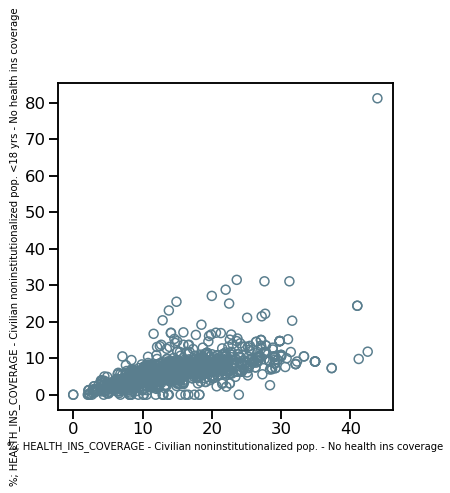

<IPython.core.display.Javascript object>

In [302]:
# Scatter plots - do I need percent and estimated income benefit columns?
f, (ax1) = plt.subplots(1, 1, figsize=(6, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - No health ins coverage",
    "%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage",
    ax1,
)

In [303]:
col_census_pct_hi_final = col_census_pct_hi_v0.copy()
col_census_pct_hi_final

['%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage']

<IPython.core.display.Javascript object>

#### Work commute columns

In [304]:
col_census_pct_wc = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains("WORK_COMMUTE")
].tolist()
col_census_pct_wc

['%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Walked',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Other means',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Worked at home']

<IPython.core.display.Javascript object>

In [305]:
df_state_info_gs_census[col_census_pct_wc].corr(method="pearson")

,"%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone","%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled",%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab),%; WORK_COMMUTE - Workers 16 yrs and up - Walked,%; WORK_COMMUTE - Workers 16 yrs and up - Other means,%; WORK_COMMUTE - Workers 16 yrs and up - Worked at home
"%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone",1.000000,-0.134708,-0.748350,-0.621511,-0.478256,-0.256264
"%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled",-0.134708,1.000000,-0.076330,-0.187178,-0.069642,-0.390938
%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab),-0.748350,-0.076330,1.000000,0.287804,0.195814,-0.073084
%; WORK_COMMUTE - Workers 16 yrs and up - Walked,-0.621511,-0.187178,0.287804,1.000000,0.385832,0.162550
%; WORK_COMMUTE - Workers 16 yrs and up - Other means,-0.478256,-0.069642,0.195814,0.385832,1.000000,-0.024728
%; WORK_COMMUTE - Workers 16 yrs and up - Worked at home,-0.256264,-0.390938,-0.073084,0.162550,-0.024728,1.000000


<IPython.core.display.Javascript object>

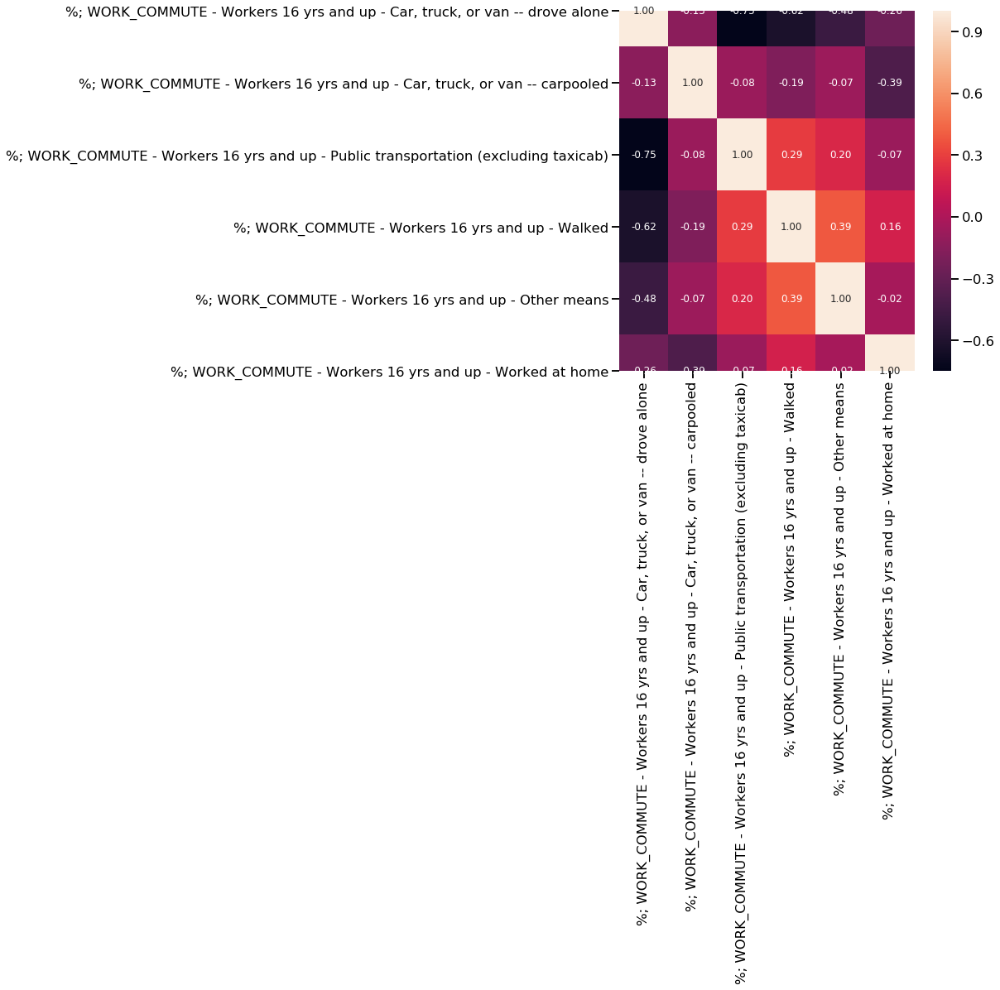

<IPython.core.display.Javascript object>

In [306]:
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_wc].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

In [307]:
# f, ax1 = plt.subplots(figsize=(14, 6))

# ax1.stackplot(
#     range(len(df_state_info_gs_census)),
#     df_state_info_gs_census[work_commute_col].iloc[:, 0],
#     df_state_info_gs_census[work_commute_col].iloc[:, 1],
#     df_state_info_gs_census[work_commute_col].iloc[:, 2],
#     df_state_info_gs_census[work_commute_col].iloc[:, 3],
#     df_state_info_gs_census[work_commute_col].iloc[:, 4],
#     df_state_info_gs_census[work_commute_col].iloc[:, 5],
#     colors=B_colors_cat[0:6],
#     labels=[
#         "drove alone",
#         "carpool",
#         "public transportation",
#         "walked",
#         "other",
#         "worked from home",
#     ],
# )

# ax1.legend()

<IPython.core.display.Javascript object>

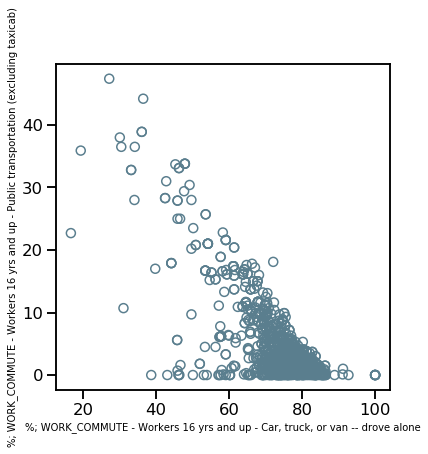

<IPython.core.display.Javascript object>

In [308]:
# Scatter plots - do I need percent and estimated income benefit columns?
f, (ax1) = plt.subplots(1, 1, figsize=(6, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone",
    "%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)",
    ax1,
)

**The Pearson is -.0.75. It's borderline, but I'll keep both "drove alone" and "public transportation" since it's possible that they could be giving different information. But I will drop "other" and "work from home"**

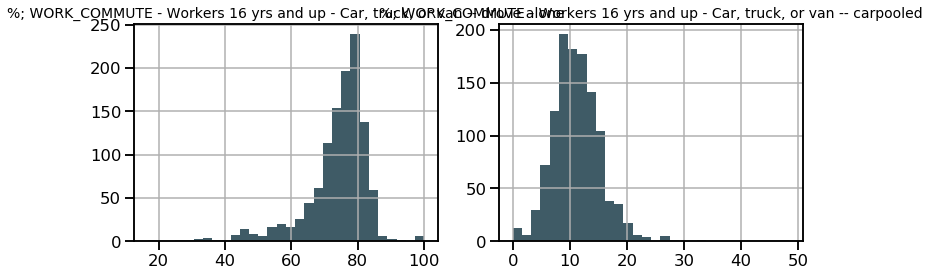

<IPython.core.display.Javascript object>

In [309]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

hist_plot(
    df_state_info_gs_census,
    "%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone",
    ax1,
)

hist_plot(
    df_state_info_gs_census,
    "%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled",
    ax2,
)

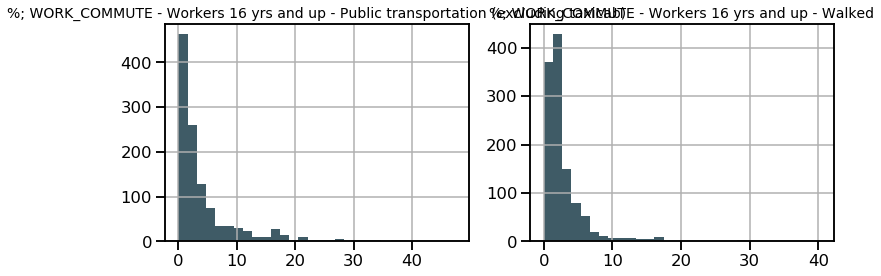

<IPython.core.display.Javascript object>

In [310]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

hist_plot(
    df_state_info_gs_census,
    "%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)",
    ax1,
)

hist_plot(
    df_state_info_gs_census, "%; WORK_COMMUTE - Workers 16 yrs and up - Walked", ax2,
)

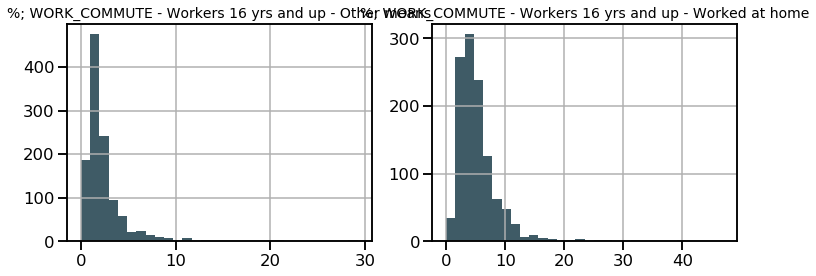

<IPython.core.display.Javascript object>

In [311]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

hist_plot(
    df_state_info_gs_census,
    "%; WORK_COMMUTE - Workers 16 yrs and up - Other means",
    ax1,
)

hist_plot(
    df_state_info_gs_census,
    "%; WORK_COMMUTE - Workers 16 yrs and up - Worked at home",
    ax2,
)

In [312]:
# Chose these since they had a more normal distribution and minimized correlations/anti-correlations
col_census_pct_wc_final = [
    "%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone",
    "%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled",
    "%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)",
    "%; WORK_COMMUTE - Workers 16 yrs and up - Walked",
    "%; WORK_COMMUTE - Workers 16 yrs and up - Worked at home",
]

<IPython.core.display.Javascript object>

#### Occupation and industry columns

In [313]:
col_census_pct_occ = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains("OCCUPATION")
].tolist()
col_census_pct_occ

['%; OCCUPATION - Civilian employed pop. 16 yrs and up - Management, business, science, and arts occupations',
 '%; OCCUPATION - Civilian employed pop. 16 yrs and up - Service occupations',
 '%; OCCUPATION - Civilian employed pop. 16 yrs and up - Sales and office occupations',
 '%; OCCUPATION - Civilian employed pop. 16 yrs and up - Natural resources, construction, and maintenance occupations',
 '%; OCCUPATION - Civilian employed pop. 16 yrs and up - Production, transportation, and material moving occupations']

<IPython.core.display.Javascript object>

In [314]:
df_state_info_gs_census[col_census_pct_occ].corr(method="pearson")

,"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Management, business, science, and arts occupations",%; OCCUPATION - Civilian employed pop. 16 yrs and up - Service occupations,%; OCCUPATION - Civilian employed pop. 16 yrs and up - Sales and office occupations,"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Natural resources, construction, and maintenance occupations","%; OCCUPATION - Civilian employed pop. 16 yrs and up - Production, transportation, and material moving occupations"
"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Management, business, science, and arts occupations",1.000000,-0.651119,-0.112866,-0.637251,-0.772026
%; OCCUPATION - Civilian employed pop. 16 yrs and up - Service occupations,-0.651119,1.000000,-0.005824,0.171893,0.314625
%; OCCUPATION - Civilian employed pop. 16 yrs and up - Sales and office occupations,-0.112866,-0.005824,1.000000,-0.377559,0.019558
"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Natural resources, construction, and maintenance occupations",-0.637251,0.171893,-0.377559,1.000000,0.327353
"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Production, transportation, and material moving occupations",-0.772026,0.314625,0.019558,0.327353,1.000000


<IPython.core.display.Javascript object>

In [315]:
col_census_pct_industry = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains("INDUSTRY")
].tolist()
col_census_pct_industry

['%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Construction',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Wholesale trade',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Retail trade',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Transportation and warehousing, and utilities',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Information',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Finance and insurance, and real estate and rental and leasing',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Educational services, and health care and social assistance',
 '%; INDUSTRY - Civilian employed pop. 16 yrs an

<IPython.core.display.Javascript object>

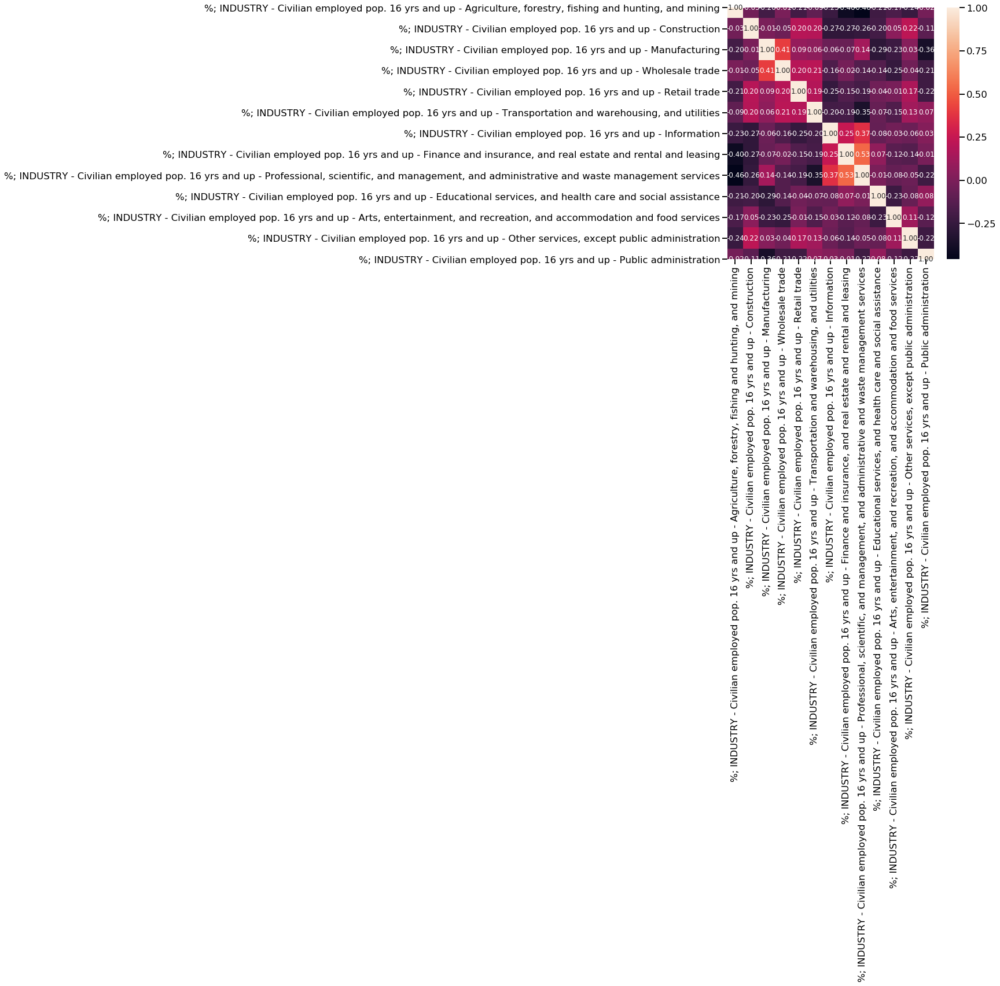

<IPython.core.display.Javascript object>

In [316]:
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_industry].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

In [317]:
# df_state_info_gs_census[col_census_pct_industry].corr(method="pearson")

<IPython.core.display.Javascript object>

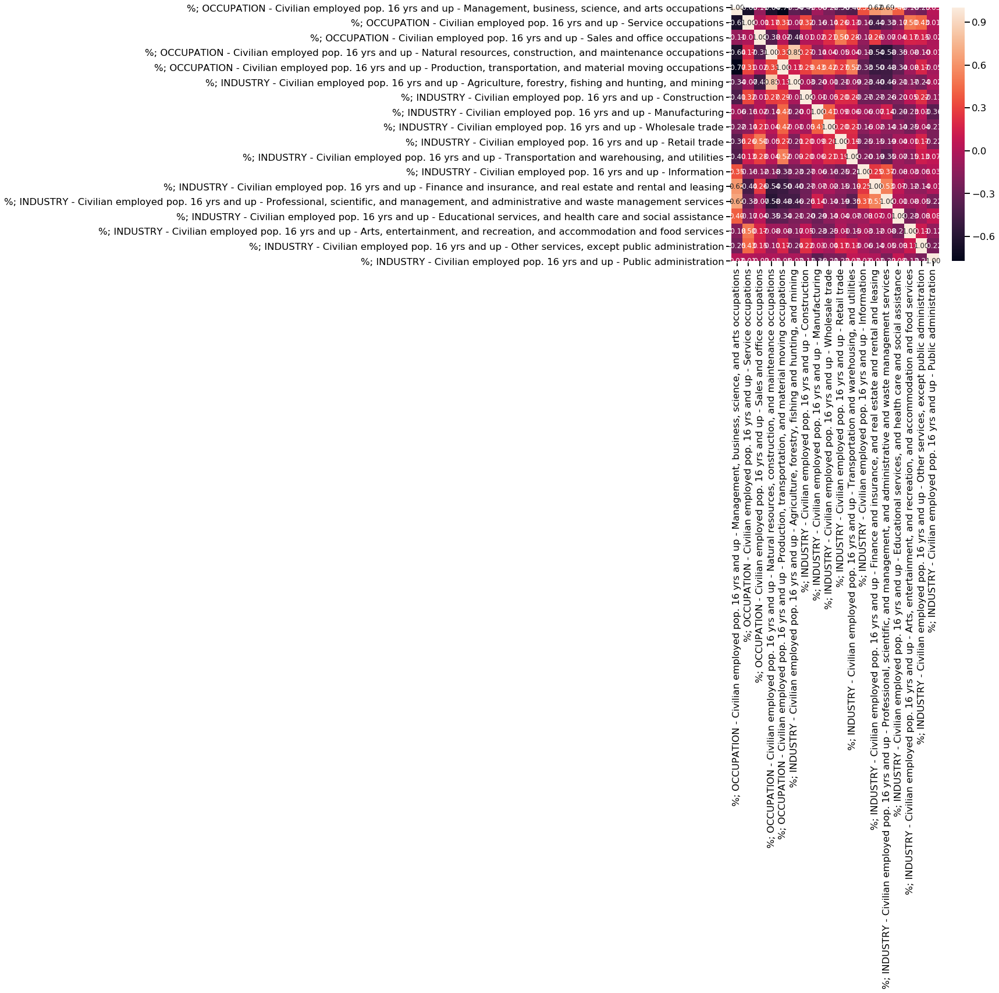

<IPython.core.display.Javascript object>

In [318]:
# Occupational and industry columns
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_occ + col_census_pct_industry].corr(
        method="pearson"
    ),
    annot=True,
    fmt="0.2f",
)

In [319]:
df_state_info_gs_census[col_census_pct_occ + col_census_pct_industry].corr(
    method="pearson"
)

,"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Management, business, science, and arts occupations",%; OCCUPATION - Civilian employed pop. 16 yrs and up - Service occupations,%; OCCUPATION - Civilian employed pop. 16 yrs and up - Sales and office occupations,"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Natural resources, construction, and maintenance occupations","%; OCCUPATION - Civilian employed pop. 16 yrs and up - Production, transportation, and material moving occupations","%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Construction,%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing,%; INDUSTRY - Civilian employed pop. 16 yrs and up - Wholesale trade,%; INDUSTRY - Civilian employed pop. 16 yrs and up - Retail trade,"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Transportation and warehousing, and utilities",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Information,"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Finance and insurance, and real estate and rental and leasing","%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services","%; INDUSTRY - Civilian employed pop. 16 yrs and up - Educational services, and health care and social assistance","%; INDUSTRY - Civilian employed pop. 16 yrs and up - Arts, entertainment, and recreation, and accommodation and food services","%; INDUSTRY - Civilian employed pop. 16 yrs and up - Other services, except public administration",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration
"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Management, business, science, and arts occupations",1.000000,-0.651119,-0.112866,-0.637251,-0.772026,-0.336756,-0.412884,-0.064357,-0.216176,-0.359250,-0.401320,0.354922,0.619367,0.686628,0.402354,-0.181746,-0.251939,0.029640
%; OCCUPATION - Civilian employed pop. 16 yrs and up - Service occupations,-0.651119,1.000000,-0.005824,0.171893,0.314625,-0.065766,0.317193,-0.158169,-0.144442,0.263628,0.128541,-0.162298,-0.443095,-0.326043,-0.173869,0.496177,0.433081,0.012932
%; OCCUPATION - Civilian employed pop. 16 yrs and up - Sales and office occupations,-0.112866,-0.005824,1.000000,-0.377559,0.019558,-0.476017,0.008806,0.019921,0.210372,0.496428,0.284236,-0.123303,0.262218,-0.068594,0.036469,0.167170,0.149692,-0.015600
"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Natural resources, construction, and maintenance occupations",-0.637251,0.171893,-0.377559,1.000000,0.327353,0.846018,0.274436,-0.139901,0.038191,-0.051668,0.038276,-0.183049,-0.535469,-0.579994,-0.351597,-0.075552,-0.099985,-0.009806
"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Production, transportation, and material moving occupations",-0.772026,0.314625,0.019558,0.327353,1.000000,0.132925,0.287661,0.430231,0.415384,0.270263,0.521042,-0.330199,-0.500786,-0.481135,-0.335958,-0.078284,0.170713,-0.054744
"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining",-0.336756,-0.065766,-0.476017,0.846018,0.132925,1.000000,-0.034049,-0.197875,-0.006528,-0.205810,-0.093545,-0.231081,-0.401008,-0.457953,-0.214443,-0.172716,-0.236332,-0.021795
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Construction,-0.412884,0.317193,0.008806,0.274436,0.287661,-0.034049,1.000000,-0.006547,-0.051895,0.200251,0.195629,-0.271239,-0.271492,-0.257875,-0.196911,0.052843,0.224600,-0.112985
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing,-0.064357,-0.158169,0.019921,-0.139901,0.430231,-0.197875,-0.006547,1.000000,0.408274,0.085309,0.061410,-0.058021,-0.067525,0.137603,-0.285511,-0.225374,0.033621,-0.363136
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Wholesale trade,-0.216176,-0.144442,0.210372,0.038191,0.415384,-0.006528,-0.051895,0.408274,1.00

<IPython.core.display.Javascript object>

**I'll keep the industry columns but drop the occupation columns. The former is more variable and has fewer correlations/anti-correlations.**

In [320]:
col_census_pct_industry_final = col_census_pct_industry.copy()

<IPython.core.display.Javascript object>

#### Worker class columns

In [321]:
col_census_pct_workerclass = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains("WORKER_CLASS")
].tolist()

df_state_info_gs_census[col_census_pct_workerclass].corr(method="pearson")

,%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers,%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Government workers,%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Self-employed in own not incorporated business workers,%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Unpaid family workers
%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers,1.000000,-0.855091,-0.424615,-0.223774
%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Government workers,-0.855091,1.000000,-0.084067,0.050251
%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Self-employed in own not incorporated business workers,-0.424615,-0.084067,1.000000,0.072156
%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Unpaid family workers,-0.223774,0.050251,0.072156,1.000000


<IPython.core.display.Javascript object>

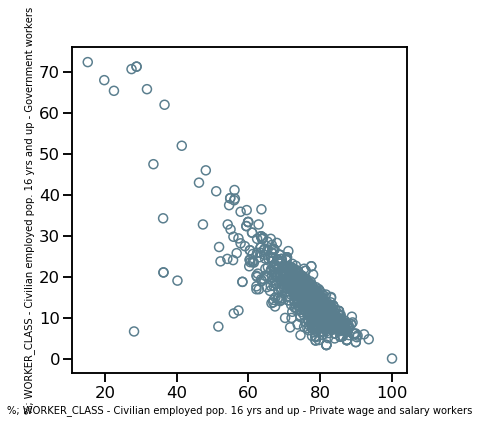

<IPython.core.display.Javascript object>

In [322]:
# Scatter plots - do I need percent and estimated income benefit columns?
f, (ax1) = plt.subplots(1, 1, figsize=(6, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers",
    "%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Government workers",
    ax1,
)

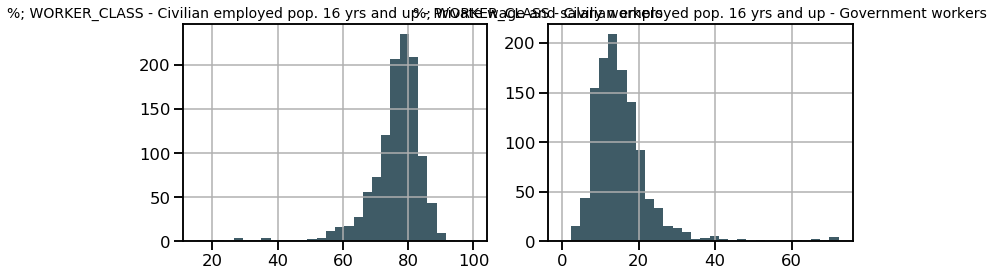

<IPython.core.display.Javascript object>

In [323]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

hist_plot(
    df_state_info_gs_census,
    "%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers",
    ax1,
)

hist_plot(
    df_state_info_gs_census,
    "%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Government workers",
    ax2,
)

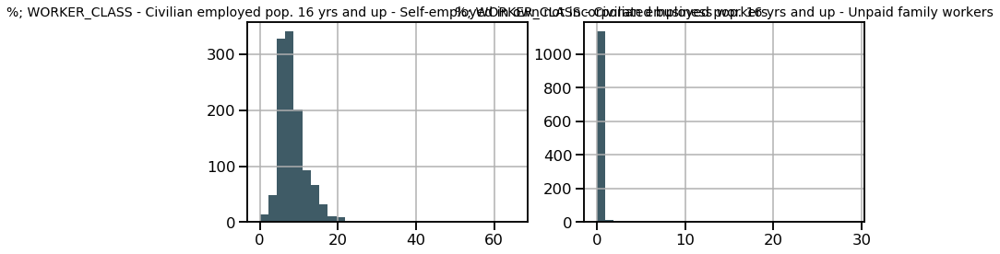

<IPython.core.display.Javascript object>

In [324]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

hist_plot(
    df_state_info_gs_census,
    "%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Self-employed in own not incorporated business workers",
    ax1,
)

hist_plot(
    df_state_info_gs_census,
    "%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Unpaid family workers",
    ax2,
)

**Drop government workers since they're highly correlated with private wage and salary workers. Also drop Unpaid family workers since they're pretty rare.**

In [325]:
col_census_pct_workerclass_final = [
    "%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers",
    "%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Self-employed in own not incorporated business workers",
]

<IPython.core.display.Javascript object>

#### Employment status columns

In [326]:
col_census_pct_employstatus = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains("EMPLOY_STATUS")
].tolist()

df_state_info_gs_census[col_census_pct_employstatus].corr(method="pearson")

,%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force,%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force,%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Employed,%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Unemployed,%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces,%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force,%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate,%; EMPLOY_STATUS - Females 16 yrs and up - In labor force,%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force,%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed,%; EMPLOY_STATUS - Own children of the householder under 6 yrs - All parents in family in labor force,%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - All parents in family in labor force
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force,1.000000,0.980370,0.940891,0.009738,0.076908,-1.000000,-0.333101,0.816019,0.811268,0.763717,0.251985,0.337010
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force,0.980370,1.000000,0.954733,0.026683,-0.121120,-0.980370,-0.322781,0.806772,0.813365,0.763647,0.275864,0.339235
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Employed,0.940891,0.954733,1.000000,-0.271813,-0.090588,-0.940891,-0.586093,0.792304,0.796778,0.838028,0.280439,0.345632
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Unemployed,0.009738,0.026683,-0.271813,1.000000,-0.087336,-0.009738,0.925408,-0.052375,-0.046089,-0.345300,-0.048061,-0.061140
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces,0.076908,-0.121120,-0.090588,-0.087336,1.000000,-0.076908,-0.046006,0.028574,-0.028693,-0.016118,-0.124341,-0.019294
%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force,-1.000000,-0.980370,-0.940891,-0.009738,-0.076908,1.000000,0.333101,-0.816019,-0.811268,-0.763717,-0.251985,-0.337010
%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate,-0.333101,-0.322781,-0.586093,0.925408,-0.046006,0.333101,1.000000,-0.311368,-0.306947,-0.570974,-0.134355,-0.190993
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force,0.816019,0.806772,0.792304,-0.052375,0.028574,-0.816019,-0.311368,1.000000,0.997781,0.928405,0.407410,0.501666
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force,0.811268,0.813365,0.796778,-0.046089,-0.028693,-0.811268,-0.306947,0.997781,1.000000,0.928807,0.413591,0.503153
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed,0.763717,0.763647,0.838028,-0.345300,-0.016118,-0.763717,-0.570974,0.928405,0.928807,1.000000,0.403864,0.490307


<IPython.core.display.Javascript object>

In [327]:
col_census_pct_employstatus

['%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force',
 '%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force',
 '%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Employed',
 '%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Unemployed',
 '%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces',
 '%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force',
 '%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate',
 '%; EMPLOY_STATUS - Females 16 yrs and up - In labor force',
 '%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force',
 '%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed',
 '%; EMPLOY_STATUS - Own children of the householder under 6 yrs - All parents in family in labor force',
 '%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - All parents in family in labor force']

<IPython.core.display.Javascript object>

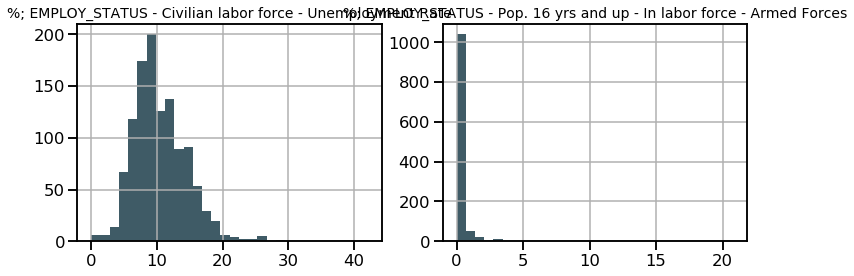

<IPython.core.display.Javascript object>

In [328]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

hist_plot(
    df_state_info_gs_census,
    "%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate",
    ax1,
)

hist_plot(
    df_state_info_gs_census,
    "%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces",
    ax2,
)

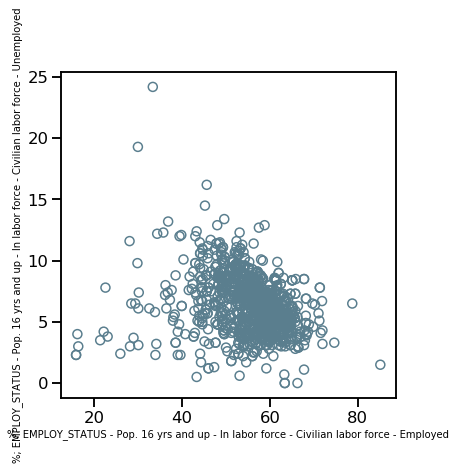

<IPython.core.display.Javascript object>

In [329]:
# Note - I don't entirely understand why
# "In labor force - Civilian labor force - Employed and Civilian labor force" and "Unemployment Rate" are not anti-correlated
# I'll keep only the latter

f, (ax1) = plt.subplots(1, 1, figsize=(6, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Employed",
    "%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Unemployed",
    ax1,
)

In [330]:
col_census_pct_employstatus_final = [
    "%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force",
    "%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate",
    "%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed",
    "%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - All parents in family in labor force",
]

<IPython.core.display.Javascript object>

In [331]:
df_state_info_gs_census[col_census_pct_employstatus_final].corr(method="pearson")

,%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force,%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate,%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed,%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - All parents in family in labor force
%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force,1.000000,0.333101,-0.763717,-0.337010
%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate,0.333101,1.000000,-0.570974,-0.190993
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed,-0.763717,-0.570974,1.000000,0.490307
%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - All parents in family in labor force,-0.337010,-0.190993,0.490307,1.000000


<IPython.core.display.Javascript object>

/Users/lacar/anaconda/envs/insight/lib/python3.6/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Users/lacar/anaconda/envs/insight/lib/python3.6/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


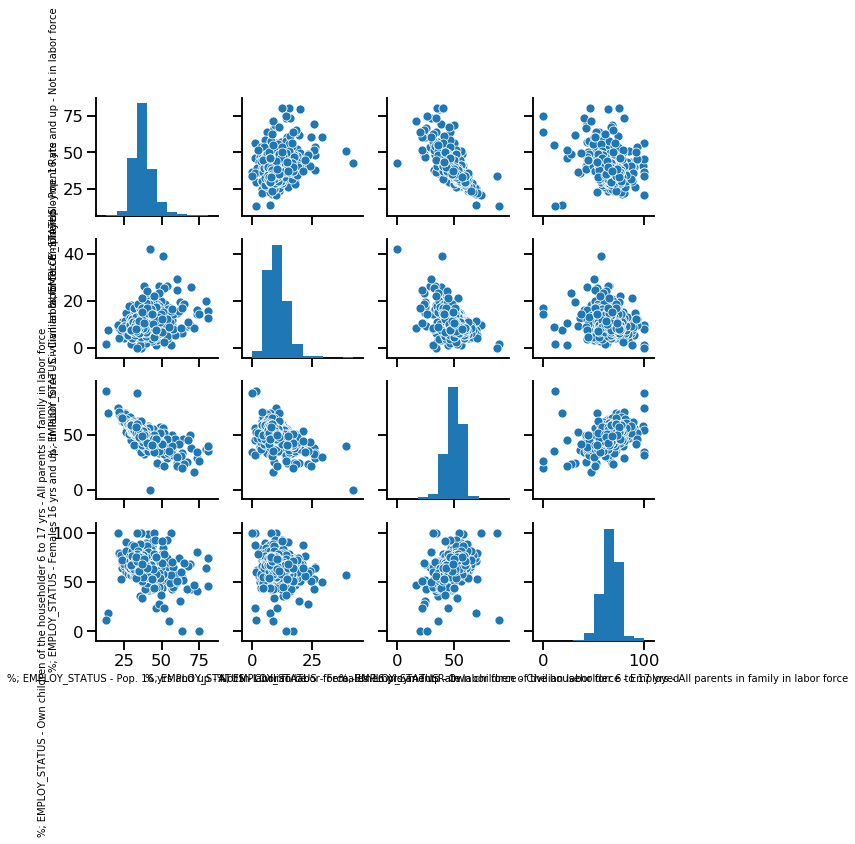

<IPython.core.display.Javascript object>

In [332]:
sns.pairplot(df_state_info_gs_census[col_census_pct_employstatus_final])

#### Percentage of families below poverty line columns

In [333]:
col_census_pct_povertyline = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains(
        "AGE_FAMILIES_INCOME_BELOW_POVERTY"
    )
].tolist()

df_state_info_gs_census[col_census_pct_povertyline].corr(method="pearson")

,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families - w/ related children of the householder <18 yrs,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Married couple families,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Married couple families - w/ related children of the householder <18 yrs,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All people,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Under 18 yrs,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Under 18 yrs - Related children of the householder <18 yrs,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Under 18 yrs - Related children of the householder <18 yrs - Related children of the householder 5 to 17 yrs,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 18 yrs and up,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 18-64 yrs,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up - People in families,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up - Unrelated individuals 15 yrs and up
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families,1.000000,0.954137,0.926511,0.873690,0.938880,0.937910,0.938793,0.909696,0.888291,0.863695,0.665770,0.985584,0.665761
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families - w/ related children of the householder <18 yrs,0.954137,1.000000,0.862861,0.889190,0.924765,0.976169,0.976855,0.935318,0.863638,0.860427,0.598186,0.962573,0.636493
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Married couple families,0.926511,0.862861,1.000000,0.929360,0.883640,0.873200,0.875453,0.873852,0.838648,0.802205,0.694139,0.927728,0.646620
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Married couple families - w/ related children of the householder <18 yrs,0.873690,0.889190,0.929360,1.000000,0.858592,0.897362,0.900181,0.896312,0.800083,0.788392,0.593411,0.905739,0.603573
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All people,0.938880,0.924765,0.883640,0.858592,1.000000,0.931017,0.929077,0.913223,0.982513,0.970192,0.652274,0.952240,0.774758
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Under 18 yrs,0.937910,0.976169,0.873200,0.897362,0.931017,1.000000,0.999361,0.974867,0.857546,0.847453,0.601294,0.967610,0.645443
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Under 18 yrs - Related children of the householder <18 yrs,0.938793,0.976855,0.875453,0.900181,0.929077,0.999361,1.000000,0.975530,0.855046,0.844835,0.603596,0.968728,0.640694
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Under 18 yrs - Related children of the householder <18 yrs - Related children of the householder 5 to 17 yrs,0.909696,0.935318,0.873852,0.896312,0.913223,0.974867,0.975530,1.000000,0.842408,0.824887,0.622359,0.946449,0.631928
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 18 yrs and up,0.888291,0.863638,0.838648,0.800083,0.982513,0.857546,0.855046,0.842408,1.000000,0.988064,0.660488,0.894300,0.794230
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 18-64 yrs,0.863695,0.860427,0.802205,0.788392,0.970192,0.847453,0.844835,0.824887,0.988064,1.000000,0.562505,0.875900,0.792789


<IPython.core.display.Javascript object>

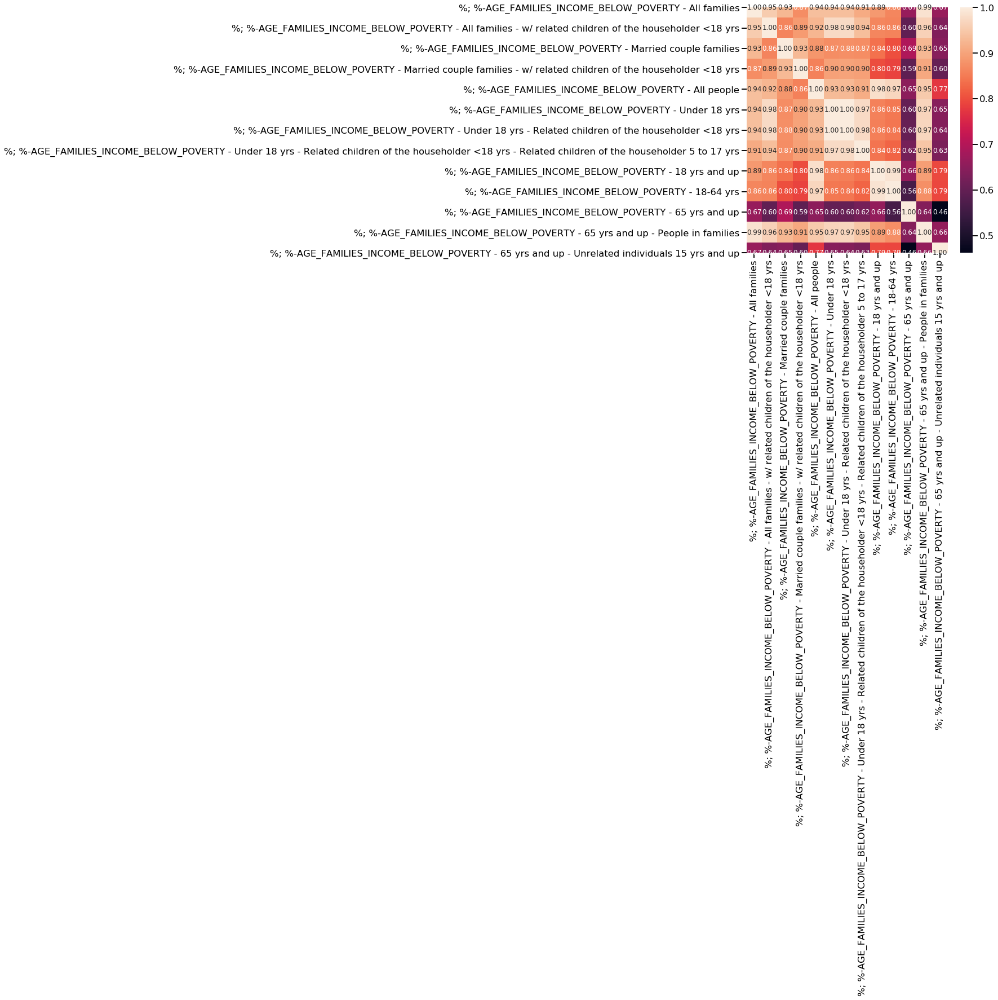

<IPython.core.display.Javascript object>

In [334]:
# Below poverty line columns
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_povertyline].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

In [335]:
# Just keep this simple - pick one element that's mostly correlated with the others
col_census_pct_povertyline_final = [
    "%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families"
]

<IPython.core.display.Javascript object>

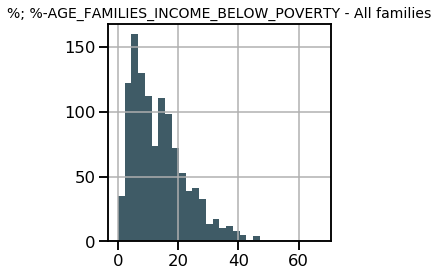

<IPython.core.display.Javascript object>

In [336]:
f, (ax1) = plt.subplots(1, 1, figsize=(4, 4))

hist_plot(
    df_state_info_gs_census,
    "%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families",
    ax1,
)



#### Combine final census features, check for other correlations

Before filtering:
- INCOME_BENEFITS - percentage (28 columns) - check for redundant columns and correlated and anti-correlated features
- INCOME_BENEFITS - estimated values - (12 columns) - manually select features
- HEALTH_INS_COVERAGE (17 columns) - manually select columns
- WORK_COMMUTE - adds to 100% (6 columns) - interesting to keep, but drop rare categories
- OCCUPATION - adds to 100% (5 columns) - perhaps drop - may be redundant with industry
- INDUSTRY - adds to 100% (13 columns) - interesting to keep but inspect
- WORKER_CLASS - adds to 100% (4 columns) - OK to keep but inspect
- EMPLOY_STATUS - (12 columns) - OK to keep but inspect
- %-AGE_FAMILIES_INCOME_BELOW_POVERTY (13 columns) - follow up

After filtering:
- INCOME_BENEFITS - percentage (3 columns)
- INCOME_BENEFITS - estimated values - (3 columns)
- HEALTH_INS_COVERAGE (3 columns)
- WORK_COMMUTE - (5 columns)
- OCCUPATION - (0 columns)
- INDUSTRY - (13 columns)
- WORKER_CLASS - (2 columns)
- EMPLOY_STATUS - (4 columns)
- %-AGE_FAMILIES_INCOME_BELOW_POVERTY (1 columns)

In [337]:
print(
    "\n income benefits, percentage - ",
    len(col_census_pct_ib_final),
    "\n income benefits, estimated - ",
    len(col_census_est_ib_final),
    "\n health insurance - ",
    len(col_census_pct_hi_final),
    "\n work commute - ",
    len(col_census_pct_wc_final),
    "\n industry - ",
    len(col_census_pct_industry_final),
    "\n worker class - ",
    len(col_census_pct_workerclass_final),
    "\n employment status - ",
    len(col_census_pct_employstatus_final),
    "\n percent below poverty line - ",
    len(col_census_pct_povertyline_final),
)


 income benefits, percentage -  3 
 income benefits, estimated -  3 
 health insurance -  3 
 work commute -  5 
 industry -  13 
 worker class -  2 
 employment status -  4 
 percent below poverty line -  1


<IPython.core.display.Javascript object>

In [338]:
census_col_final = (
    col_census_pct_ib_final
    + col_census_est_ib_final
    + col_census_pct_hi_final
    + col_census_pct_wc_final
    + col_census_pct_industry_final
    + col_census_pct_workerclass_final
    + col_census_pct_employstatus_final
    + col_census_pct_povertyline_final
)

<IPython.core.display.Javascript object>

In [339]:
col_census_pct_wc_final

['%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Walked',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Worked at home']

<IPython.core.display.Javascript object>

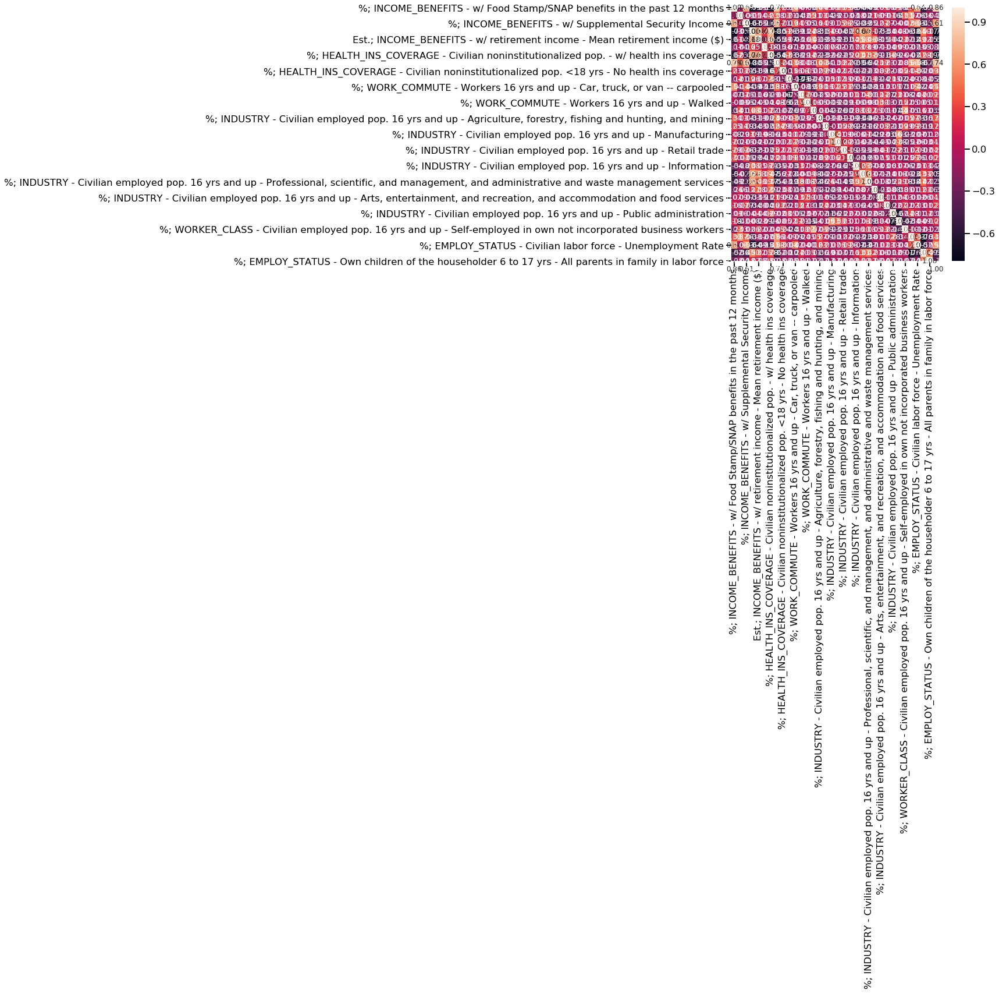

<IPython.core.display.Javascript object>

In [340]:
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(
    df_state_info_gs_census[census_col_final].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

In [341]:
df_state_info_gs_census[census_col_final].corr(method="pearson")

,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months,%; INCOME_BENEFITS - w/ Social Security,%; INCOME_BENEFITS - w/ Supplemental Security Income,Est.; INCOME_BENEFITS - Total households - Median household income ($),Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($),Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($),%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage,"%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone",...,"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Arts, entertainment, and recreation, and accommodation and food services","%; INDUSTRY - Civilian employed pop. 16 yrs and up - Other services, except public administration",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration,%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers,%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Self-employed in own not incorporated business workers,%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force,%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate,%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed,%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - All parents in family in labor force,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families
%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months,1.000000,-0.099427,0.653882,-0.729109,-0.614616,-0.167118,-0.619386,0.785270,0.234384,-0.144824,...,0.069423,0.163684,-0.090993,0.176016,-0.234750,0.304361,0.641352,-0.524672,-0.276435,0.863977
%; INCOME_BENEFITS - w/ Social Security,-0.099427,1.000000,0.062799,-0.045917,0.144984,0.041529,0.233592,0.376184,0.025823,0.208717,...,0.093868,-0.008892,0.156389,-0.408687,0.331265,0.571346,0.063432,-0.358291,-0.042409,-0.156829
%; INCOME_BENEFITS - w/ Supplemental Security Income,0.653882,0.062799,1.000000,-0.668726,-0.552836,-0.158848,-0.472583,0.692272,0.209045,-0.191171,...,0.071791,0.267682,-0.041353,-0.004280,-0.020921,0.360665,0.527050,-0.445359,-0.175205,0.609095
Est.; INCOME_BENEFITS - Total households - Median household income ($),-0.729109,-0.045917,-0.668726,1.000000,0.678153,0.251763,0.740037,-0.796097,-0.507022,0.258780,...,-0.328565,-0.342622,-0.037376,0.075379,0.062518,-0.380201,-0.637943,0.500448,0.174871,-0.778418
Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($),-0.614616,0.144984,-0.552836,0.678153,1.000000,0.157658,0.669048,-0.554159,-0.389431,0.169459,...,-0.153798,-0.302773,0.138518,-0.233325,0.215287,-0.121804,-0.493916,0.322639,0.153570,-0.632089
Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($),-0.167118,0.041529,-0.158848,0.251763,0.157658,1.000000,0.184730,-0.152103,-0.164433,0.072358,...,-0.108308,-0.044231,-0.086368,0.085013,0.019195,-0.065615,-0.151299,0.051408,-0.077360,-0.162449
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage,-0.619386,0.233592,-0.472583,0.740037,0.669048,0.184730,1.000000,-0.540853,-0.609231,0.327137,...,-0.212650,-0.358661,0.290064,-0.264410,-0.041072,-0.065481,-0.412128,0.284284,0.187646,-0.728354
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage,0.785270,0.376184,0.692272,-0.796097,-0.554159,-0.152103,-0.540853,1.000000,0.242434,-0.146072,...,0.189111,0.225574,-0.021502,-0.081656,0.053830,0.557709,0.578243,-0.620097,-0.281216,0.741289
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage,0.234384,0.025823,0.209045,-0.507022,-0.389431,-0.164433,-0.609231,0.242434,1.000000,-0.147483,...,0.087036,0.216

<IPython.core.display.Javascript object>

In [342]:
print("No. of census features ", len(census_col_final))

No. of census features  34


<IPython.core.display.Javascript object>

In [343]:
df_state_info_gs_census[census_col_final[0:2]].corr(method="pearson")

,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months,%; INCOME_BENEFITS - w/ Social Security
%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months,1.000000,-0.099427
%; INCOME_BENEFITS - w/ Social Security,-0.099427,1.000000


<IPython.core.display.Javascript object>

In [344]:
def melt_corr_df(df_corr):
    df = df_corr.where(np.triu(np.ones(df_corr.shape)).astype(np.bool))
    df = df.stack().reset_index()
    df.columns = ["Row", "Column", "Pearson r"]

    # Remove self-correlated Pearson r
    df = df[df["Pearson r"] != 1].copy()

    return df

<IPython.core.display.Javascript object>

In [345]:
df_corr_melted_census = melt_corr_df(
    df_state_info_gs_census[census_col_final].corr(method="pearson")
)

<IPython.core.display.Javascript object>

In [346]:
df_corr_melted_census.sort_values(by="Pearson r", ascending=False).head(10)

,Row,Column,Pearson r
33,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All f...,0.863977
7,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,0.785270
243,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All f...,0.741289
102,Est.; INCOME_BENEFITS - Total households - Med...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,0.740037
72,%; INCOME_BENEFITS - w/ Supplemental Security ...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,0.692272
100,Est.; INCOME_BENEFITS - Total households - Med...,Est.; INCOME_BENEFITS - w/ retirement income -...,0.678153
132,Est.; INCOME_BENEFITS - w/ retirement income -...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,0.669048
2,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,%; INCOME_BENEFITS - w/ Supplemental Security ...,0.653882
30,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,%; EMPLOY_STATUS - Civilian labor force - Unem...,0.641352
117,Est.; INCOME_BENEFITS - Total households - Med...,%; INDUSTRY - Civilian employed pop. 16 yrs an...,0.636850


<IPython.core.display.Javascript object>

In [347]:
df_corr_melted_census.sort_values(by="Pearson r", ascending=False).tail(10)

,Row,Column,Pearson r
159,Est.; INCOME_BENEFITS - w/ retirement income -...,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All f...,-0.632089
126,Est.; INCOME_BENEFITS - Total households - Med...,%; EMPLOY_STATUS - Civilian labor force - Unem...,-0.637943
68,%; INCOME_BENEFITS - w/ Supplemental Security ...,Est.; INCOME_BENEFITS - Total households - Med...,-0.668726
560,%; INDUSTRY - Civilian employed pop. 16 yrs an...,%; WORKER_CLASS - Civilian employed pop. 16 yr...,-0.674441
216,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All f...,-0.728354
3,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,Est.; INCOME_BENEFITS - Total households - Med...,-0.729109
272,"%; WORK_COMMUTE - Workers 16 yrs and up - Car,...",%; WORK_COMMUTE - Workers 16 yrs and up - Publ...,-0.748350
582,%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in...,%; EMPLOY_STATUS - Females 16 yrs and up - In ...,-0.763717
129,Est.; INCOME_BENEFITS - Total households - Med...,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All f...,-0.778418
103,Est.; INCOME_BENEFITS - Total households - Med...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,-0.796097


<IPython.core.display.Javascript object>

In [348]:
# I'll drop the poverty line element since it correlates with % of families with food stamps and it's not actionable
census_col_final_filt = (
    col_census_pct_ib_final
    + col_census_est_ib_final
    + col_census_pct_hi_final
    + col_census_pct_wc_final
    + col_census_pct_industry_final
    + col_census_pct_workerclass_final
    + col_census_pct_employstatus_final
)

<IPython.core.display.Javascript object>

In [349]:
len(census_col_final_filt)

33

<IPython.core.display.Javascript object>

### Update features - focus on actionable features

4/4/20: added enrollment (school size)

In [354]:
all_features_filt_wcensuscheck = census_col_final_filt + [
    "enrollment",
    "pct_LI_students",
    "Magnet_cat_encoded",
    "Charter_cat_encoded",
    "college_readiness",
    "students_per_teacher",
    "students_per_counselor",
    "pct_teachers_3years_or_more",
    "pct_teachers_who_r_certified",
    "avg_teacher_salary",
    "test_score_rating_LIstudents",
    "test_score_rating_notLIstudents",
    "test_scores_english_LIstudents",
    "test_scores_math_LIstudents",
    "test_scores_math_LIstudents_n_students",
    "graduation_rates_gradRates_eligibility_allStudents",
    "graduation_rates_gradRates_eligibility_LIstudents",
    "graduation_rates_UCCSU_eligibility_allStudents",
    "graduation_rates_UCCSU_eligibility_LIstudents",
    "graduation_rates_UCCSU_eligibility_nonLIstudents",
]

<IPython.core.display.Javascript object>

In [355]:
len(all_features_filt_wcensuscheck)

53

<IPython.core.display.Javascript object>

In [356]:
df_state_info_gs_census_corr = melt_corr_df(
    df_state_info_gs_census[all_features_filt_wcensuscheck].corr(method="pearson")
)

<IPython.core.display.Javascript object>

In [357]:
df_state_info_gs_census_corr.sort_values(by="Pearson r", ascending=False).head(20)

,Row,Column,Pearson r
1377,test_score_rating_LIstudents,test_score_rating_notLIstudents,0.985217
1417,graduation_rates_gradRates_eligibility_allStud...,graduation_rates_gradRates_eligibility_LIstudents,0.984875
1427,graduation_rates_UCCSU_eligibility_allStudents,graduation_rates_UCCSU_eligibility_nonLIstudents,0.954499
1426,graduation_rates_UCCSU_eligibility_allStudents,graduation_rates_UCCSU_eligibility_LIstudents,0.926377
1429,graduation_rates_UCCSU_eligibility_LIstudents,graduation_rates_UCCSU_eligibility_nonLIstudents,0.832424
7,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,0.785270
1396,test_scores_english_LIstudents,test_scores_math_LIstudents,0.763117
159,Est.; INCOME_BENEFITS - Total households - Med...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,0.740037
110,%; INCOME_BENEFITS - w/ Supplemental Security ...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,0.692272
157,Est.; INCOME_BENEFITS - Total households - Med...,Est.; INCOME_BENEFITS - w/ retirement income -...,0.678153


<IPython.core.display.Javascript object>

In [358]:
df_state_info_gs_census_corr.sort_values(by="Pearson r", ascending=False).tail(20)

,Row,Column,Pearson r
364,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,%; INDUSTRY - Civilian employed pop. 16 yrs an...,-0.560158
1156,%; EMPLOY_STATUS - Civilian labor force - Unem...,%; EMPLOY_STATUS - Females 16 yrs and up - In ...,-0.570974
37,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,college_readiness,-0.585722
305,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,-0.609231
4,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,Est.; INCOME_BENEFITS - w/ retirement income -...,-0.614616
6,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,-0.619386
374,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,%; EMPLOY_STATUS - Females 16 yrs and up - In ...,-0.620097
444,"%; WORK_COMMUTE - Workers 16 yrs and up - Car,...",%; WORK_COMMUTE - Workers 16 yrs and up - Walked,-0.621511
236,Est.; INCOME_BENEFITS - w/ retirement income -...,pct_LI_students,-0.621814
183,Est.; INCOME_BENEFITS - Total households - Med...,%; EMPLOY_STATUS - Civilian labor force - Unem...,-0.637943


<IPython.core.display.Javascript object>

In [359]:
# Look at what correlated best with the target

bool_target = df_state_info_gs_census_corr["Row"].str.contains(
    "graduation_rates_UCCSU_eligibility_LIstudents"
) | df_state_info_gs_census_corr["Column"].str.contains(
    "graduation_rates_UCCSU_eligibility_LIstudents"
)

df_state_info_gs_census_corr_target = (
    df_state_info_gs_census_corr.loc[bool_target, :]
    .sort_values(by="Pearson r", ascending=False)
    .copy()
)

<IPython.core.display.Javascript object>

In [360]:
df_state_info_gs_census_corr_target

,Row,Column,Pearson r
1426,graduation_rates_UCCSU_eligibility_allStudents,graduation_rates_UCCSU_eligibility_LIstudents,0.926377
1429,graduation_rates_UCCSU_eligibility_LIstudents,graduation_rates_UCCSU_eligibility_nonLIstudents,0.832424
1293,Charter_cat_encoded,graduation_rates_UCCSU_eligibility_LIstudents,0.488653
568,%; WORK_COMMUTE - Workers 16 yrs and up - Publ...,graduation_rates_UCCSU_eligibility_LIstudents,0.389259
1401,test_scores_english_LIstudents,graduation_rates_UCCSU_eligibility_LIstudents,0.388377
1408,test_scores_math_LIstudents,graduation_rates_UCCSU_eligibility_LIstudents,0.378830
964,%; INDUSTRY - Civilian employed pop. 16 yrs an...,graduation_rates_UCCSU_eligibility_LIstudents,0.260068
901,%; INDUSTRY - Civilian employed pop. 16 yrs an...,graduation_rates_UCCSU_eligibility_LIstudents,0.248058
1104,%; WORKER_CLASS - Civilian employed pop. 16 yr...,graduation_rates_UCCSU_eligibility_LIstudents,0.227108
1198,%; EMPLOY_STATUS - Females 16 yrs and up - In ...,graduation_rates_UCCSU_eligibility_LIstudents,0.191105


<IPython.core.display.Javascript object>

## Exploratory data analysis

In [37]:
[print(i) for i in df_state_info_gs_census.columns]

Unnamed: 0
CDSCode
NCESDist
NCESSchool
StatusType
County
District
School
Street
StreetAbr
City
Zip
State
MailStreet
MailStrAbr
MailCity
MailZip
MailState
Phone
Ext
WebSite
OpenDate
ClosedDate
Charter
CharterNum
FundingType
DOC
DOCType
SOC
SOCType
EdOpsCode
EdOpsName
EILCode
EILName
GSoffered
GSserved
Virtual
Magnet
YearRoundYN
FederalDFCDistrictID
Latitude
Longitude
AdmFName1
AdmLName1
AdmEmail1
AdmFName2
AdmLName2
AdmEmail2
AdmFName3
AdmLName3
AdmEmail3
LastUpDate
zip_code
gsId
name
type
gradeRange
enrollment
gsRating
parentRating
city
state
districtId
district
districtNCESId
address
phone
fax
website
ncesId
lat
lon
overviewLink
ratingsLink
reviewsLink
schoolStatsLink
college_readiness
test_scores
advanced_courses
equity_overview
race_ethnicity
low_income
disabilities
students_per_teacher
students_per_counselor
pct_teachers_3years_or_more
pct_teachers_who_r_certified
avg_teacher_salary
test_score_rating_allStudents
test_score_rating_LIstudents
test_score_rating_notLIstudents
test_scor

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,

<IPython.core.display.Javascript object>

In [361]:
df_state_info_gs_census["enrollment"].quantile([0.1, 0.2, 0.5, 0.75, 1])

0.10     214.0
0.20     435.0
0.50    1409.0
0.75    2100.5
1.00    4794.0
Name: enrollment, dtype: float64

<IPython.core.display.Javascript object>

In [362]:
df_state_info_gs_census["SOCType"].value_counts()

High Schools (Public)                 1146
County Community                         3
Special Education Schools (Public)       2
Continuation High Schools                1
Name: SOCType, dtype: int64

<IPython.core.display.Javascript object>

In [363]:
df_state_info_gs_census.sort_values(by="enrollment")[
    [
        "School",
        "SOCType",
        "pct_LI_students",
        "enrollment",
        "graduation_rates_UCCSU_eligibility_LIstudents",
    ]
].head(5)

,School,SOCType,pct_LI_students,enrollment,graduation_rates_UCCSU_eligibility_LIstudents
475,Yosemite Park High,High Schools (Public),NaN,1.0,NaN
1112,Cold Springs High,High Schools (Public),NaN,4.0,NaN
190,Clear Passage Educational Center,High Schools (Public),NaN,4.0,NaN
1111,South Fork High,High Schools (Public),NaN,4.0,NaN
132,Mattole Triple Junction High,High Schools (Public),NaN,9.0,NaN


<IPython.core.display.Javascript object>

In [364]:
# What are the enrollment sizes of the schools with LI graduation rate values?
bool_wotarget = df_state_info_gs_census[
    "graduation_rates_UCCSU_eligibility_LIstudents"
].isna()

df_state_info_gs_census.loc[~bool_wotarget, :].sort_values(by="enrollment").loc[
    :,
    [
        "School",
        "SOCType",
        "pct_LI_students",
        "enrollment",
        "graduation_rates_UCCSU_eligibility_LIstudents",
    ],
].head(10)

,School,SOCType,pct_LI_students,enrollment,graduation_rates_UCCSU_eligibility_LIstudents
760,Baker High,High Schools (Public),92.0,38.0,67.0
1115,Tioga High,High Schools (Public),NaN,53.0,9.0
1016,Happy Camp High,High Schools (Public),45.0,62.0,30.0
505,Coleville High,High Schools (Public),NaN,66.0,64.0
904,Shandon High,High Schools (Public),76.0,66.0,8.0
185,Herlong High,High Schools (Public),NaN,66.0,9.0
184,Herlong High,High Schools (Public),NaN,66.0,9.0
1015,Dunsmuir High,High Schools (Public),NaN,67.0,42.0
460,Sherman Thomas Charter High,High Schools (Public),NaN,68.0,46.0
187,Westwood High,High Schools (Public),NaN,82.0,11.0


<IPython.core.display.Javascript object>

In [365]:
bool_wotarget.sum()

128

<IPython.core.display.Javascript object>

### Filter by schools with at least 50 students



In [366]:
df_state_info_gs_census = df_state_info_gs_census[
    df_state_info_gs_census["enrollment"] >= 50
].copy()

<IPython.core.display.Javascript object>

In [368]:
df_state_info_gs_census.sort_values(by="enrollment")[
    [
        "School",
        "SOCType",
        "pct_LI_students",
        "enrollment",
        "E12",
        "graduation_rates_UCCSU_eligibility_LIstudents",
        "graduation_rates_UCCSU_eligibility_nonLIstudents",
    ]
].head(50)

,School,SOCType,pct_LI_students,enrollment,E12,graduation_rates_UCCSU_eligibility_LIstudents,graduation_rates_UCCSU_eligibility_nonLIstudents
1065,Oakdale Charter,High Schools (Public),NaN,51.0,NaN,NaN,NaN
949,Middle College High,High Schools (Public),29.0,52.0,NaN,NaN,NaN
1115,Tioga High,High Schools (Public),NaN,53.0,NaN,9.0,NaN
340,Collegiate Charter High School of Los Angeles,High Schools (Public),93.0,54.0,NaN,NaN,NaN
1016,Happy Camp High,High Schools (Public),45.0,62.0,NaN,30.0,NaN
505,Coleville High,High Schools (Public),NaN,66.0,NaN,64.0,NaN
184,Herlong High,High Schools (Public),NaN,66.0,NaN,9.0,NaN
185,Herlong High,High Schools (Public),NaN,66.0,NaN,9.0,NaN
904,Shandon High,High Schools (Public),76.0,66.0,NaN,8.0,NaN
1015,Dunsmuir High,High Schools (Public),NaN,67.0,NaN,42.0,NaN


<IPython.core.display.Javascript object>

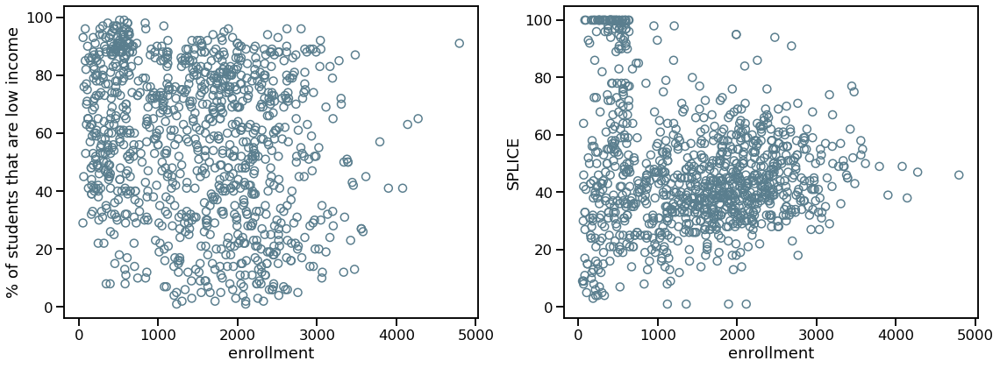

<IPython.core.display.Javascript object>

In [371]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
scatter_plot_open_circles(df_state_info_gs_census, "enrollment", "pct_LI_students", ax1)

scatter_plot_open_circles(
    df_state_info_gs_census,
    "enrollment",
    "graduation_rates_UCCSU_eligibility_LIstudents",
    ax2,
)

ax1.set_xlabel("enrollment", fontsize=18)
ax1.set_ylabel("% of students that are low income", fontsize=18)
ax2.set_xlabel("enrollment", fontsize=18)
ax2.set_ylabel("SPLICE", fontsize=18)
plt.tight_layout()

### Exploration of SPLICE and most correlated features with SPLICE

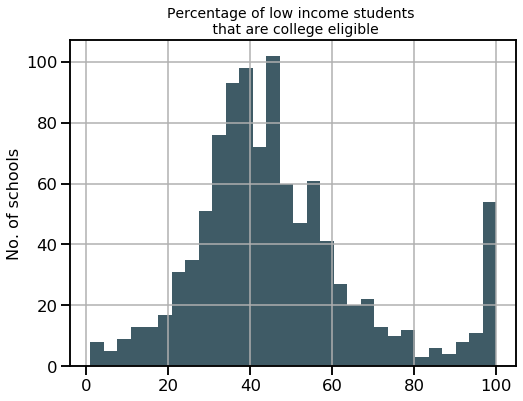

<IPython.core.display.Javascript object>

In [189]:
f, ax1 = plt.subplots(figsize=(8,6))
hist_plot(df_state_info_gs_census, "graduation_rates_UCCSU_eligibility_LIstudents", ax1)
ax1.set_ylabel("No. of schools", fontsize=16)
ax1.set_title("Percentage of low income students \n that are college eligible", fontsize=14);


In [372]:
df_state_info_gs_census[
    "graduation_rates_UCCSU_eligibility_allStudents"
] * df_state_info_gs_census["pct_LI_students"] / 100

0       67.00
1       11.88
2         NaN
3       80.00
4       10.71
        ...  
1147    26.46
1148    26.04
1149    29.48
1150    20.46
1151    19.24
Length: 1099, dtype: float64

<IPython.core.display.Javascript object>

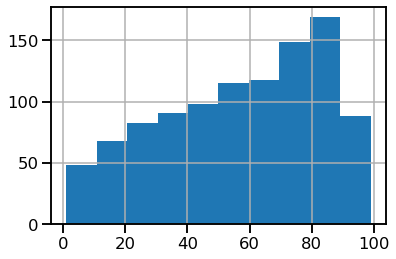

<IPython.core.display.Javascript object>

In [374]:
df_state_info_gs_census["pct_LI_students"].hist()

''

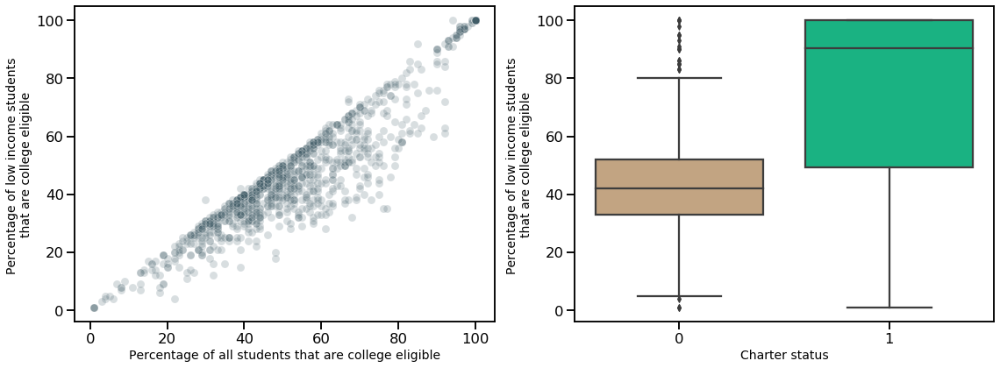

<IPython.core.display.Javascript object>

In [375]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
# scatter_plot_open_circles(
#     df_state_info_gs_census,
#     "graduation_rates_UCCSU_eligibility_allStudents",
#     "graduation_rates_UCCSU_eligibility_LIstudents",
#     ax1,
# )

sns.scatterplot(
    data=df_state_info_gs_census,
    x="graduation_rates_UCCSU_eligibility_allStudents",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    ax=ax1,
    alpha=0.2,
    color=B_slate,
    legend=False,
)
ax1.set_xlabel("Percentage of all students that are college eligible", fontsize=14)
ax1.set_ylabel(
    "Percentage of low income students \nthat are college eligible", fontsize=14
)


sns.boxplot(
    data=df_state_info_gs_census,
    x="Charter_cat_encoded",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    palette=[B_beige, B_green],
)
ax2.set_xlabel("Charter status", fontsize=14)
ax2.set_ylabel(
    "Percentage of low income students \nthat are college eligible", fontsize=14
)
plt.tight_layout()
;

In [381]:
df_state_info_gs_census.columns[df_state_info_gs_census.columns.str.contains("income")]

Index(['low_income',
       'Est.; INCOME_BENEFITS - Total households - Median household income ($)',
       'Est.; INCOME_BENEFITS - Total households - Mean household income ($)',
       'Est.; INCOME_BENEFITS - w/ Social Security - Mean Social Security income ($)',
       'Est.; INCOME_BENEFITS - w/ retirement income',
       '%; INCOME_BENEFITS - w/ retirement income_x',
       'Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($)',
       'Est.; INCOME_BENEFITS - w/ cash public assistance income',
       '%; INCOME_BENEFITS - w/ cash public assistance income_x',
       'Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)',
       'Est.; INCOME_BENEFITS - Families - Median family income ($)',
       'Est.; INCOME_BENEFITS - Families - Mean family income ($)',
       'Est.; INCOME_BENEFITS - Per capita income ($)',
       'Est.; INCOME_BENEFITS - Nonfamily households - Median nonfamily income ($)',
       'Est.; INCOM

<IPython.core.display.Javascript object>

''

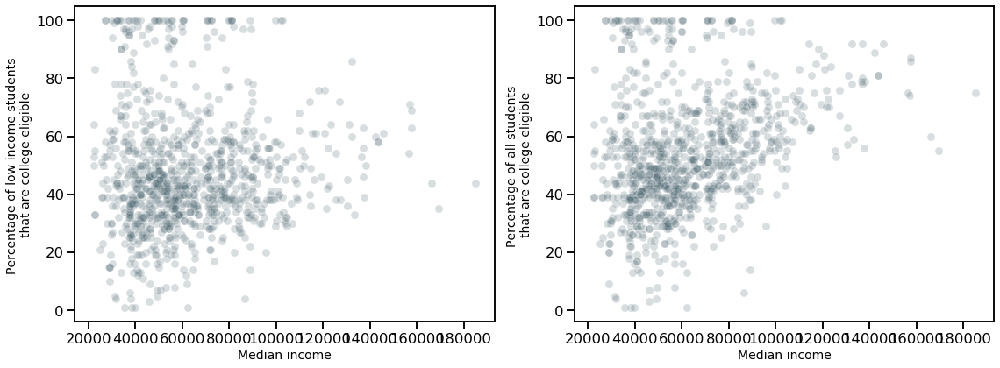

<IPython.core.display.Javascript object>

In [382]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
# scatter_plot_open_circles(
#     df_state_info_gs_census,
#     "graduation_rates_UCCSU_eligibility_allStudents",
#     "graduation_rates_UCCSU_eligibility_LIstudents",
#     ax1,
# )

sns.scatterplot(
    data=df_state_info_gs_census,
    x="Est.; INCOME_BENEFITS - Total households - Median household income ($)",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    ax=ax1,
    alpha=0.2,
    color=B_slate,
    legend=False,
)
ax1.set_xlabel("Median income", fontsize=14)
ax1.set_ylabel(
    "Percentage of low income students \nthat are college eligible", fontsize=14
)


sns.scatterplot(
    data=df_state_info_gs_census,
    x="Est.; INCOME_BENEFITS - Total households - Median household income ($)",
    y="graduation_rates_UCCSU_eligibility_allStudents",
    ax=ax2,
    alpha=0.2,
    color=B_slate,
    legend=False,
)
ax2.set_xlabel("Median income", fontsize=14)
ax2.set_ylabel("Percentage of all students \nthat are college eligible", fontsize=14)

plt.tight_layout()
;

In [188]:
df_state_info_gs_census["Charter_cat_encoded"].sum()

179

<IPython.core.display.Javascript object>

mean:  46.648727984344426
mean +/- 1SD:  25.935753315454775 67.36170265323408
mean + 2SD:  5.222778646565125 88.07467732212373


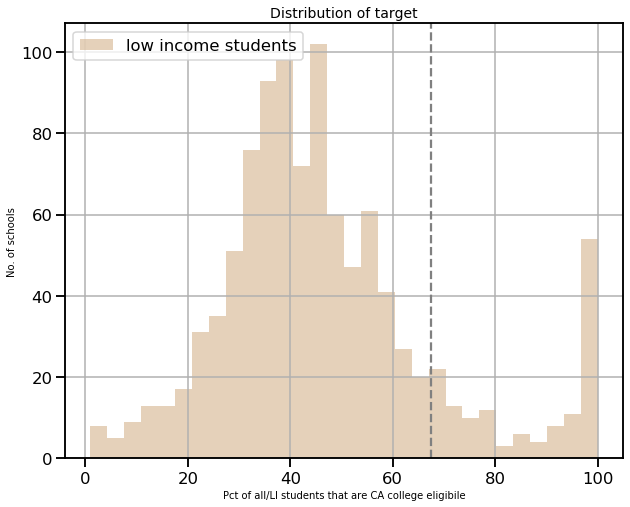

<IPython.core.display.Javascript object>

In [383]:
f, ax1 = plt.subplots(figsize=(10, 8))
df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"].hist(
    bins=30, ax=ax1, color=B_beige, alpha=0.5, label="low income students"
)
# df_state_info_gs_census["graduation_rates_UCCSU_eligibility_allStudents"].hist(
#     bins=30, ax=ax1, color=B_green, alpha=0.5, label="all students"
# )

ax1.axvline(67.4, c="gray", linestyle="dashed")
ax1.set_title("Distribution of target")
ax1.set_xlabel("Pct of all/LI students that are CA college eligibile")
ax1.set_ylabel("No. of schools")
ax1.legend()

target = df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"]
target_mean = target.mean()
target_sd = target.std()

print("mean: ", target_mean)
print("mean +/- 1SD: ", target_mean - target_sd, target_mean + target_sd)
print("mean + 2SD: ", target_mean - 2 * target_sd, target_mean + 2 * target_sd)

### Exploration of gap and features correlated with gap

mean:  11.273027246803332
mean +/- 1SD:  0.02382453794723638 22.522229955659427
mean + 2SD:  -11.22537817090886 33.77143266451552


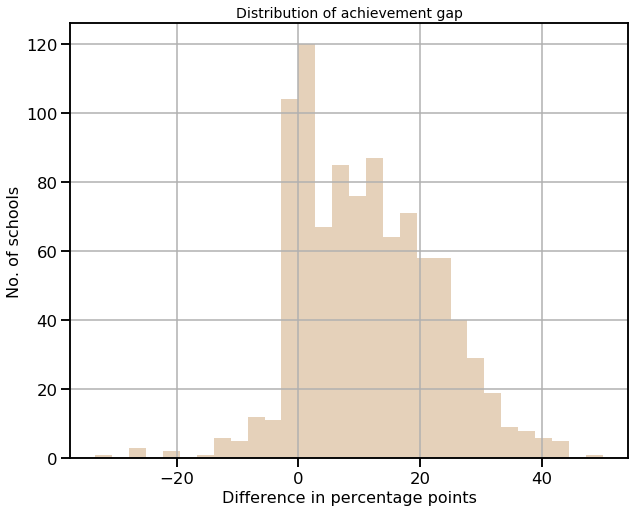

<IPython.core.display.Javascript object>

In [394]:
f, ax1 = plt.subplots(figsize=(10, 8))
df_state_info_gs_census["nonLI-LI_UCCSU_eligibility_gap"].hist(
    bins=30, ax=ax1, color=B_beige, alpha=0.5
)
# df_state_info_gs_census["graduation_rates_UCCSU_eligibility_allStudents"].hist(
#     bins=30, ax=ax1, color=B_green, alpha=0.5, label="all students"
# )

# ax1.axvline(67.4, c="gray", linestyle="dashed")
ax1.set_title("Distribution of achievement gap")
ax1.set_xlabel("Difference in percentage points", fontsize=16)
ax1.set_ylabel("No. of schools", fontsize=16)
# ax1.legend()

target = df_state_info_gs_census["nonLI-LI_UCCSU_eligibility_gap"]
target_mean = target.mean()
target_sd = target.std()

print("mean: ", target_mean)
print("mean +/- 1SD: ", target_mean - target_sd, target_mean + target_sd)
print("mean + 2SD: ", target_mean - 2 * target_sd, target_mean + 2 * target_sd)

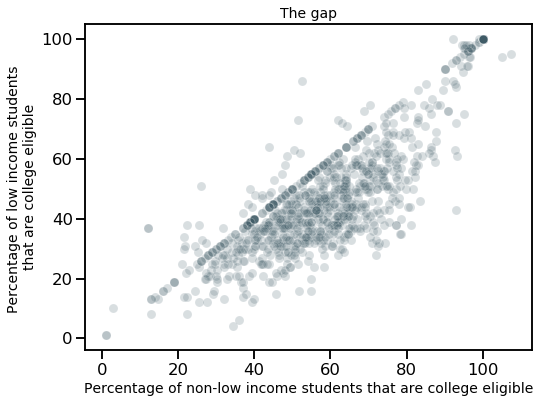

<IPython.core.display.Javascript object>

In [393]:
f, (ax1) = plt.subplots(1, 1, figsize=(8, 6))

sns.scatterplot(
    data=df_state_info_gs_census,
    x="graduation_rates_UCCSU_eligibility_nonLIstudents",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    ax=ax1,
    alpha=0.2,
    color=B_slate,
    legend=False,
)

ax1.axabline(
    
)


ax1.set_xlabel(
    "Percentage of non-low income students that are college eligible", fontsize=14
)
ax1.set_ylabel(
    "Percentage of low income students \nthat are college eligible", fontsize=14
)
ax1.set_title(
    "The gap", fontsize=14
);


## RF regression with SPLICE as the target

- Used RF to be allow for possibly correlated features (despite filtering above)
- Splitting on MSE


- Use Gridsearch
- Apply train-test-validation splits

In [395]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV

<IPython.core.display.Javascript object>

### Getting split data

In [398]:
def get_split_data(X, y, testsize):

    # Keep rows only if there are no null values for that feature and target
    k_rows2keep = pd.merge(X, y, left_index=True, right_index=True).notnull().sum(
        axis=1
    ) == (X.shape[1] + 1)
    print(
        "No. of total schools before splitting (no null values for feature set or target): ",
        sum(k_rows2keep),
    )

    X = X.loc[k_rows2keep, :].copy()
    y = y[k_rows2keep].copy()

    # Split data between train and test_(and_holdout?)
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=testsize, random_state=19
    )

    return X_train, X_test, y_train, y_test

<IPython.core.display.Javascript object>

Is it necessary to run a separate kfold cross-validation?
- oob_scorebool = True (look like this would be like the validation)

In [418]:
rm_feat = [
    "graduation_rates_UCCSU_eligibility_allStudents",
    "graduation_rates_UCCSU_eligibility_LIstudents",
    "graduation_rates_UCCSU_eligibility_nonLIstudents",
]

all_features_filt_wcensuscheck_notarget = [
    x for x in all_features_filt_wcensuscheck if x not in rm_feat
]
target = "graduation_rates_UCCSU_eligibility_LIstudents"

<IPython.core.display.Javascript object>

In [419]:
X_rf = df_state_info_gs_census[all_features_filt_wcensuscheck_notarget].copy()
y_rf = df_state_info_gs_census[target].copy()

<IPython.core.display.Javascript object>

In [420]:
X_train_rf, X_test_rf, y_train_rf, y_test_rf = get_split_data(X_rf, y_rf, 0.4)

No. of total schools before splitting (no null values for feature set or target):  825


<IPython.core.display.Javascript object>

### Running with a grid search from blog

**Run a hyperparameter grid search**

See [here](https://scikit-learn.org/stable/modules/grid_search.html)
- try randomized parameter optimization since more values can be tested
- try doing multiple metrics - R2, MSE, etc.
- note: don't have to do pruning because of RF design (see [here](https://stats.stackexchange.com/questions/36298/why-is-pruning-not-needed-for-random-forest-trees))

In [422]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start=50, stop=2000, num=10)]
# Number of features to consider at every split
max_features = ["auto", "sqrt"]
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num=11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {
    "n_estimators": n_estimators,
    "max_features": max_features,
    "max_depth": max_depth,
    "min_samples_split": min_samples_split,
    "min_samples_leaf": min_samples_leaf,
    "bootstrap": bootstrap,
}

<IPython.core.display.Javascript object>

**Example to show how to get evaluation metrics**

In [423]:
# Instantiate model - note haven't used oob_scorebool parameter
rf = RandomForestRegressor()

# Rn search using 5-fold cross-validation
rf_random = RandomizedSearchCV(
    estimator=rf,  # the model
    param_distributions=random_grid,  # from above
    n_iter=5,  # no. of paramter settings sampled
    cv=3,
    verbose=2,
    random_state=42,
    n_jobs=-1,
    refit=False,
    scoring=[
        "r2",
        "neg_root_mean_squared_error",
    ],  # look at multiple evaluation metrics
    return_train_score=True,  # computationally expensive, but output here for insight
)

rf_random.fit(X_train_rf, y_train_rf)

# y_pred = rf.predict(X_test)

Fitting 3 folds for each of 5 candidates, totalling 15 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed:   34.8s finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestRegressor(bootstrap=True,
                                                   ccp_alpha=0.0,
                                                   criterion='mse',
                                                   max_depth=None,
                                                   max_features='auto',
                                                   max_leaf_nodes=None,
                                                   max_samples=None,
                                                   min_impurity_decrease=0.0,
                                                   min_impurity_split=None,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   n_estimators=100,
                              

<IPython.core.display.Javascript object>

In [424]:
df_cv_results = pd.DataFrame(rf_random.cv_results_)
df_cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,param_min_samples_split,param_min_samples_leaf,param_max_features,param_max_depth,param_bootstrap,...,split1_test_neg_root_mean_squared_error,split2_test_neg_root_mean_squared_error,mean_test_neg_root_mean_squared_error,std_test_neg_root_mean_squared_error,rank_test_neg_root_mean_squared_error,split0_train_neg_root_mean_squared_error,split1_train_neg_root_mean_squared_error,split2_train_neg_root_mean_squared_error,mean_train_neg_root_mean_squared_error,std_train_neg_root_mean_squared_error
0,0.180434,0.000722,0.012598,0.000181,50,10,2,sqrt,50,True,...,-13.344600,-12.244979,-13.074302,0.598149,3,-7.140628,-7.835275,-7.607125,-7.527676,0.289099
1,1.497859,0.011244,0.078719,0.002499,483,10,4,sqrt,90,False,...,-12.475232,-12.221827,-12.627621,0.408028,1,-4.856307,-5.751764,-5.349721,-5.319264,0.366202
2,6.188754,0.089036,0.079011,0.002345,483,2,2,auto,60,False,...,-17.968927,-15.088104,-16.478725,1.178197,5,-3.039072,-2.939779,-3.175086,-3.051312,0.096453
3,4.858905,0.030372,0.211137,0.000462,1350,5,1,sqrt,30,True,...,-12.783770,-12.252487,-12.739824,0.381238,2,-5.085033,-5.605779,-5.444686,-5.378499,0.217684
4,9.838721,0.588033,0.094349,0.034168,916,10,1,auto,80,False,...,-17.478811,-14.425920,-16.160745,1.280704,4,-4.483023,-4.268337,-5.640106,-4.797155,0.602465


<IPython.core.display.Javascript object>

**Running to get real results**

In [425]:
# Instantiate model - note haven't used oob_scorebool parameter
rf = RandomForestRegressor()

# Rn search using 5-fold cross-validation
rf_random = RandomizedSearchCV(
    estimator=rf,  # the model
    param_distributions=random_grid,  # from above
    n_iter=100,  # no. of paramter settings sampled
    cv=5,
    verbose=2,
    random_state=42,
    n_jobs=-1,
)

rf_random.fit(X_train_rf, y_train_rf)

# y_pred = rf.predict(X_test)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  1.3min


KeyboardInterrupt: 

<IPython.core.display.Javascript object>

In [ ]:
rf_random.best_params_

This takes a while

### Evaluating multiple models

In [ ]:
# Code from Shaga

## alg_names = [
'Logistic Regression',
#'Support Vector Machines',
'Decision Tree',
'Random Forest',
#'GBDT'
]


# Initialize the ML algorithms
models = {}
for name in alg_names:
if name == 'Logistic Regression':
models[name] = LogisticRegression()
elif name == 'Decision Tree':
models[name] = DecisionTreeClassifier()
elif name == 'Support Vector Machines':
models[name] = SVC()
elif name == 'Random Forest':
models[name] = RandomForestClassifier()



# hyper-paramters for all algorithms
params = {}
for name in alg_names:
if name == 'Logistic Regression':    # change to Linear
params[name] = {
'penalty':['l2'],
'C':[.1, 1.0, 10],
'solver':['lbfgs'],#, 'newton-cg', 'sag', 'saga'],
'max_iter':[10000],
'class_weight':['balanced']
}
elif name == 'Decision Tree':
params[name] = {
'criterion':['gini','entropy'],
'max_depth':[2,3,4],
'class_weight':['balanced']
}
elif name == 'Support Vector Machines':
params[name] = {
'C':[.1, 1, 10],
'kernel':['rbf', 'linear', 'poly'],
'class_weight':['balanced']
}
elif name == 'Random Forest':
params[name] = {
'n_estimators': [50, 100, 500],
'criterion': ['gini', 'entropy'],   # change to regression
'max_depth': [2, 3, 4, 5, 7],
'class_weight':['balanced']
}

#### Tune the hyper-parameters with 10-Fold Cross Validation

# then train all algorithms based on ROC-AUC
model_opt = {}


# Train the ML algorithms
for name in alg_names:
print ("Training the " + name + " algorithm...")
model_opt[name] = GridSearchCV( models[name], params[name], cv=10, scoring='precision')

model_opt[name].fit(X_train, y_train)

print ("\n TRAINING IS DONE!! \n")
# Find the scores of each algorithm

### Evaluating with my original code

#### RF with 100 trees

In [426]:
def run_randomforest_v0(X_train, y_train, X_test, y_test):
    # Instantiate model with 100 decision trees
    rf = RandomForestRegressor(n_estimators=100, random_state=19,)
    rf.fit(X_train, y_train)
    y_pred = rf.predict(X_test)
    df_eval = pd.DataFrame({"test": y_test, "pred": y_pred})

    return rf, df_eval

<IPython.core.display.Javascript object>

In [427]:
rf_v0, df_eval_v0 = run_randomforest_v0(X_train_rf, y_train_rf, X_test_rf, y_test_rf)

<IPython.core.display.Javascript object>

In [428]:
X_train_rf.shape

(495, 50)

<IPython.core.display.Javascript object>

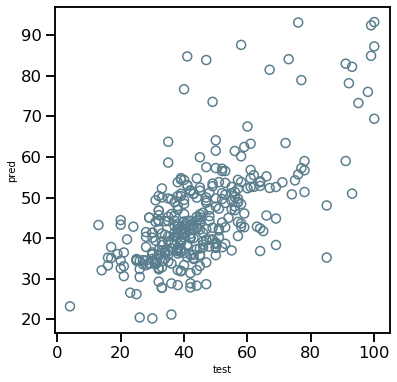

<IPython.core.display.Javascript object>

In [429]:
f, (ax1) = plt.subplots(1, 1, figsize=(6, 6))
scatter_plot_open_circles(df_eval_v0, "test", "pred", ax1)

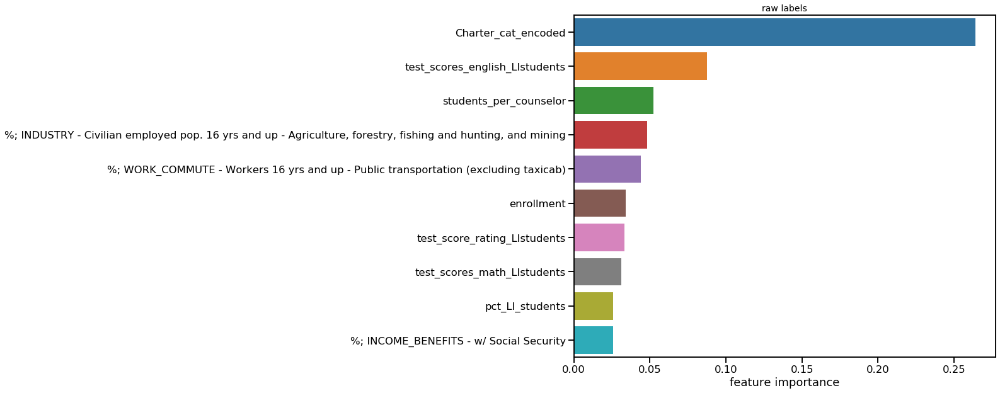

<IPython.core.display.Javascript object>

In [430]:
# Show most important features
features = X_train_rf.columns.tolist()
feature_imp = pd.Series(rf_v0.feature_importances_, index=features).sort_values(ascending=False)

# Creating a bar plot
#f, (ax1, ax2) = plt.subplots(2, 1, figsize=(12,16))
f, (ax1) = plt.subplots(1, 1, figsize=(12,10))

#ax1 = 
sns.barplot(x=feature_imp[0:10], y=feature_imp.index[0:10], ax=ax1)
ax1.set_title('raw labels')
ax1.set_xlabel('feature importance', fontsize=18);

# sns.barplot(x=feature_imp[0:10], y=feature_imp.index[0:10], ax=ax2)
# new_labels = ['% college eligible - all students', 
#               '% low income students', 
#               '% industry - professional, scientific, management', 
#               'math test scores (all students)', 
#               'avg. teacher salary', 
#               'English test scores (all students)', 
#               '% with supplemental security income', 
#               'mean retirement income', 
#               '% income $35-50K', 
#               '% not in labor force with health insurance coverage']
# ax2.set_yticklabels(new_labels)
# ax2.set_xlabel('feature importance', fontsize=18);
# ax1.set_xticklabels(new_labels, rotation=45, ha='right');
#ax1.set_xticklabels(range(1,11));
#ax1.legend(new_labels, bbox_to_anchor=(1, 1), loc='upper left', ncol=1, fontsize=10);


In [431]:
# Top 10
feature_imp[0:10]

Charter_cat_encoded                                                                                            0.264099
test_scores_english_LIstudents                                                                                 0.087552
students_per_counselor                                                                                         0.052315
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining    0.048243
%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)                            0.044014
enrollment                                                                                                     0.034129
test_score_rating_LIstudents                                                                                   0.033262
test_scores_math_LIstudents                                                                                    0.031363
pct_LI_students                         

<IPython.core.display.Javascript object>

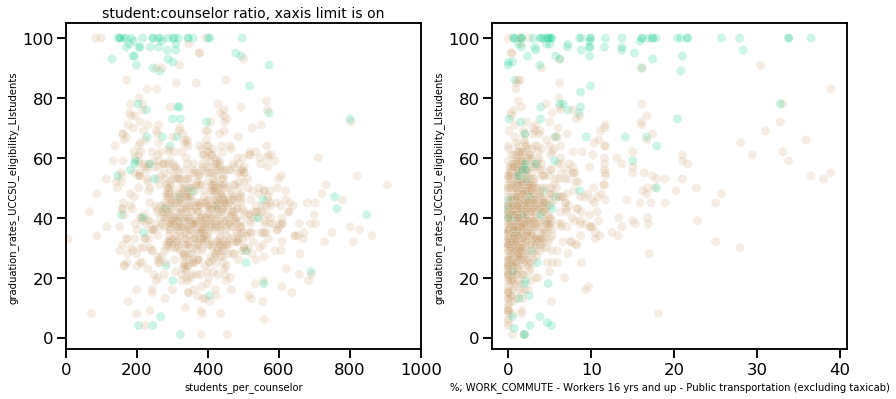

<IPython.core.display.Javascript object>

In [432]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
sns.scatterplot(
    data=df_state_info_gs_census,
    x="students_per_counselor",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    hue="Charter_cat_encoded",
    palette=[B_beige, B_green],
    ax=ax1,
    alpha=0.2,
    legend=False,
)

ax1.set_xlim([0, 1000])
ax1.set_title("student:counselor ratio, xaxis limit is on")

sns.scatterplot(
    data=df_state_info_gs_census,
    x="%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    hue="Charter_cat_encoded",
    palette=[B_beige, B_green],
    ax=ax2,
    alpha=0.2,
    legend=False,
)

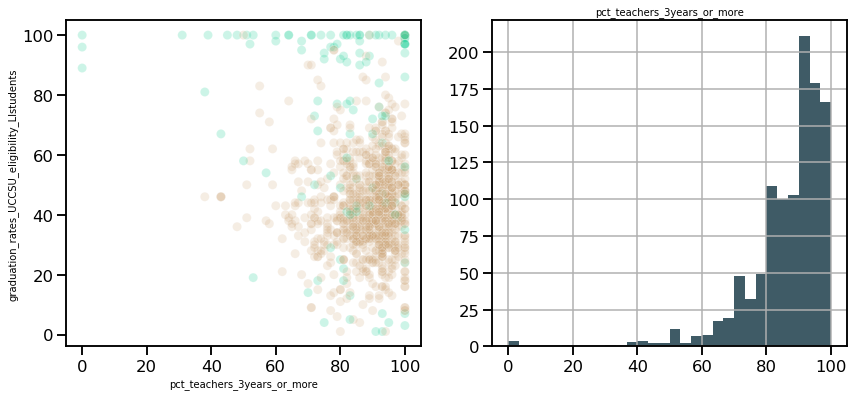

<IPython.core.display.Javascript object>

In [676]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
sns.scatterplot(
    data=df_state_info_gs_census,
    x="pct_teachers_3years_or_more",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    hue="Charter_cat_encoded",
    palette=[B_beige, B_green],
    ax=ax1,
    alpha=0.2,
    legend=False,
)

hist_plot(df_state_info_gs_census, "pct_teachers_3years_or_more", ax=ax2)

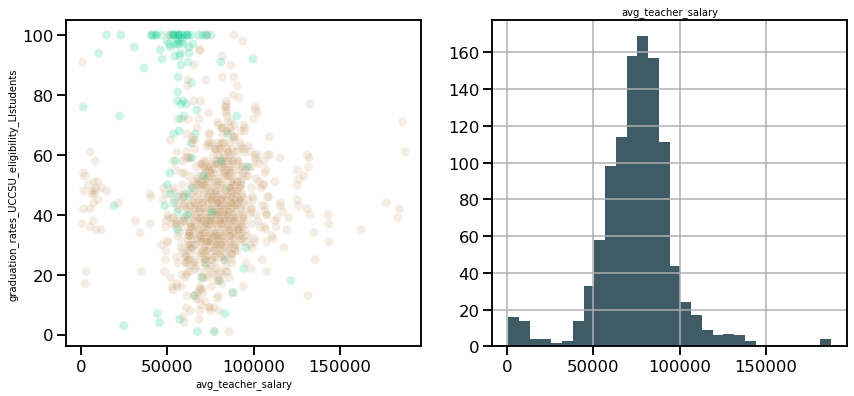

<IPython.core.display.Javascript object>

In [680]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
sns.scatterplot(
    data=df_state_info_gs_census,
    x="avg_teacher_salary",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    hue="Charter_cat_encoded",
    palette=[B_beige, B_green],
    ax=ax1,
    alpha=0.2,
    legend=False,
)

hist_plot(df_state_info_gs_census, "avg_teacher_salary", ax=ax2)

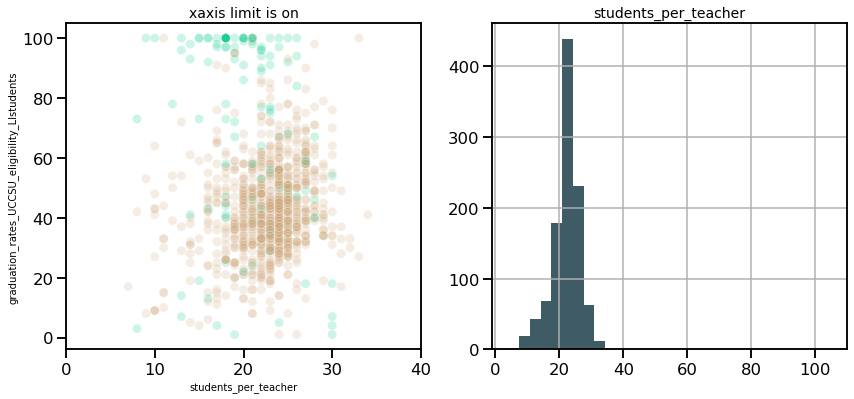

<IPython.core.display.Javascript object>

In [253]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
sns.scatterplot(
    data=df_state_info_gs_census,
    x="students_per_teacher",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    hue="Charter_cat_encoded",
    palette=[B_beige, B_green],
    ax=ax1,
    alpha=0.2,
    legend=False,
)

ax1.set_xlim([0, 40])
ax1.set_title("xaxis limit is on")

hist_plot(df_state_info_gs_census, "students_per_teacher", ax=ax2)

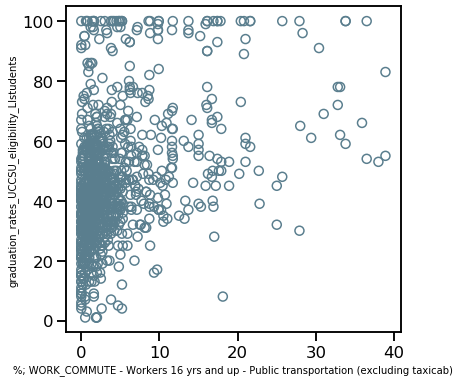

<IPython.core.display.Javascript object>

In [666]:
f, (ax1) = plt.subplots(1, 1, figsize=(6, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)",
    "graduation_rates_UCCSU_eligibility_LIstudents",
    ax1,
)

In [165]:
print("R2 score: ", rf_v0.score(X_test_rf, y_test_rf))

R2 score:  0.4449966758497552


<IPython.core.display.Javascript object>

#### Use a search to find best parameters

In [433]:
# Number of trees in random forest
n_estimators = range(50, 500, 10)
# Number of features to consider at every split
max_features = ["auto", "sqrt"]
# Maximum number of levels in tree - since I have ~1000 schools
max_depth = [2, 3, 4, 5, 6, 7, 8, 9, 10]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {
    "n_estimators": n_estimators,
    "max_features": max_features,
    "max_depth": max_depth,
    "min_samples_split": min_samples_split,
    "min_samples_leaf": min_samples_leaf,
    "bootstrap": bootstrap,
}

<IPython.core.display.Javascript object>

In [434]:
# Instantiate model - note haven't used oob_scorebool parameter
rf = RandomForestRegressor()

# Rn search using 5-fold cross-validation
rf_random = RandomizedSearchCV(
    estimator=rf,  # the model
    param_distributions=random_grid,  # from above
    n_iter=10,  # no. of parameter settings sampled
    cv=3,
    verbose=2,
    random_state=42,
    n_jobs=-1,
    refit=False,
    scoring=[
        "r2",
        "neg_root_mean_squared_error",
    ],  # look at multiple evaluation metrics
    return_train_score=True,  # computationally expensive, but output here for insight
)

rf_random.fit(X_train_rf, y_train_rf)

# This took ~ 10 sec to run


Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   12.7s finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestRegressor(bootstrap=True,
                                                   ccp_alpha=0.0,
                                                   criterion='mse',
                                                   max_depth=None,
                                                   max_features='auto',
                                                   max_leaf_nodes=None,
                                                   max_samples=None,
                                                   min_impurity_decrease=0.0,
                                                   min_impurity_split=None,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   n_estimators=100,
                              

<IPython.core.display.Javascript object>

In [435]:
df_cv_results = pd.DataFrame(rf_random.cv_results_)
df_cv_results.T

,0,1,2,3,4,5,6,7,8,9
mean_fit_time,1.00738,0.208116,0.497033,1.33328,0.415432,1.61566,1.23903,1.02046,2.92133,0.741624
std_fit_time,0.00786609,0.00438205,0.0112956,0.00649419,0.00658348,0.00718818,0.0110713,0.0180399,0.0514184,0.213294
mean_score_time,0.0502166,0.0121229,0.0182242,0.0718718,0.0245482,0.0348744,0.0691172,0.0617538,0.0557029,0.034515
std_score_time,0.0016789,0.000852859,0.00156617,0.012939,0.00278338,0.00164544,0.00310821,0.00197405,0.00230672,0.0160809
param_n_estimators,300,50,100,400,130,210,440,390,240,150
param_min_samples_split,10,2,5,10,5,5,5,5,5,5
param_min_samples_leaf,4,1,1,1,1,4,2,4,1,2
param_max_features,sqrt,sqrt,auto,sqrt,sqrt,auto,sqrt,sqrt,auto,sqrt
param_max_depth,10,None,3,8,8,8,6,5,9,9
param_bootstrap,True,False,True,True,False,True,False,False,True,True


<IPython.core.display.Javascript object>

In [436]:
# Return the parameters that are best

bool_best_rank = (df_cv_results["rank_test_neg_root_mean_squared_error"] == 1) & (
    df_cv_results["rank_test_r2"] == 1
)

idx_bool = df_cv_results.index[bool_best_rank][0]
best_params = df_cv_results.loc[idx_bool, "params"]
best_params

{'n_estimators': 210,
 'min_samples_split': 5,
 'min_samples_leaf': 4,
 'max_features': 'auto',
 'max_depth': 8,
 'bootstrap': True}

<IPython.core.display.Javascript object>

In [437]:
# Add random state to the parameters
best_params["random_state"] = 42
best_params

{'n_estimators': 210,
 'min_samples_split': 5,
 'min_samples_leaf': 4,
 'max_features': 'auto',
 'max_depth': 8,
 'bootstrap': True,
 'random_state': 42}

<IPython.core.display.Javascript object>

In [438]:
def run_randomforest_v1(X_train, y_train, X_test, y_test, parameters):
    # Use dictionary of parameters - use the double asterisks to unpack
    parameters["random_state"] = 42
    rf = RandomForestRegressor(**parameters)
    rf.fit(X_train, y_train)
    y_pred = rf.predict(X_test)
    df_eval = pd.DataFrame({"test": y_test, "pred": y_pred})

    return rf, df_eval

<IPython.core.display.Javascript object>

In [439]:
rf_v1, df_eval_v1 = run_randomforest_v1(
    X_train_rf, y_train_rf, X_test_rf, y_test_rf, best_params
)

<IPython.core.display.Javascript object>

In [440]:
# Verify the right parameters are being put in
rf_v1

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=8, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=4,
                      min_samples_split=5, min_weight_fraction_leaf=0.0,
                      n_estimators=210, n_jobs=None, oob_score=False,
                      random_state=42, verbose=0, warm_start=False)

<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'test vs. prediction of SPLICE')

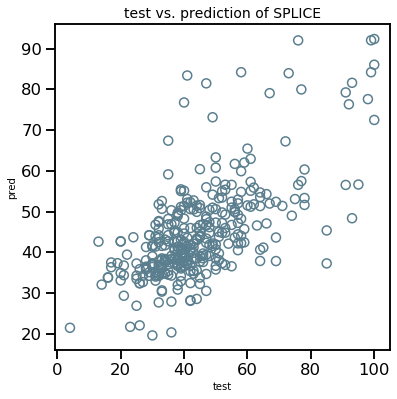

<IPython.core.display.Javascript object>

In [441]:
f, (ax1) = plt.subplots(1, 1, figsize=(6, 6))
scatter_plot_open_circles(df_eval_v1, "test", "pred", ax1)
ax1.set_title("test vs. prediction of SPLICE")

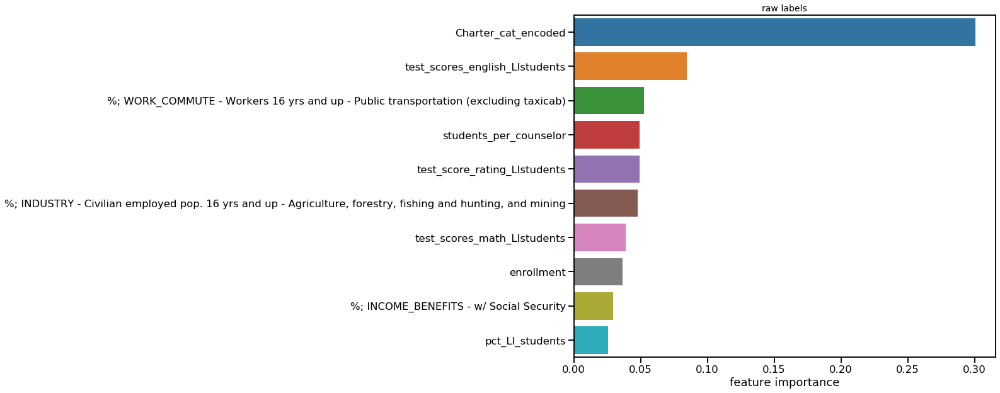

<IPython.core.display.Javascript object>

In [442]:
# Show most important features
features = X_train_rf.columns.tolist()
feature_imp = pd.Series(rf_v1.feature_importances_, index=features).sort_values(ascending=False)

# Creating a bar plot
#f, (ax1, ax2) = plt.subplots(2, 1, figsize=(12,16))
f, (ax1) = plt.subplots(1, 1, figsize=(12,10))

#ax1 = 
sns.barplot(x=feature_imp[0:10], y=feature_imp.index[0:10], ax=ax1)
ax1.set_title('raw labels')
ax1.set_xlabel('feature importance', fontsize=18);

# sns.barplot(x=feature_imp[0:10], y=feature_imp.index[0:10], ax=ax2)
# new_labels = ['% college eligible - all students', 
#               '% low income students', 
#               '% industry - professional, scientific, management', 
#               'math test scores (all students)', 
#               'avg. teacher salary', 
#               'English test scores (all students)', 
#               '% with supplemental security income', 
#               'mean retirement income', 
#               '% income $35-50K', 
#               '% not in labor force with health insurance coverage']
# ax2.set_yticklabels(new_labels)
# ax2.set_xlabel('feature importance', fontsize=18);
# ax1.set_xticklabels(new_labels, rotation=45, ha='right');
#ax1.set_xticklabels(range(1,11));
#ax1.legend(new_labels, bbox_to_anchor=(1, 1), loc='upper left', ncol=1, fontsize=10);


In [443]:
feature_imp

Charter_cat_encoded                                                                                                                                0.300799
test_scores_english_LIstudents                                                                                                                     0.084532
%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)                                                                0.052728
students_per_counselor                                                                                                                             0.049315
test_score_rating_LIstudents                                                                                                                       0.049254
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining                                        0.048027
test_scores_math_LIstudents                                     

<IPython.core.display.Javascript object>

##### Evaluate with SHAP values

https://towardsdatascience.com/explain-your-model-with-the-shap-values-bc36aac4de3d

In [444]:
import shap

<IPython.core.display.Javascript object>

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


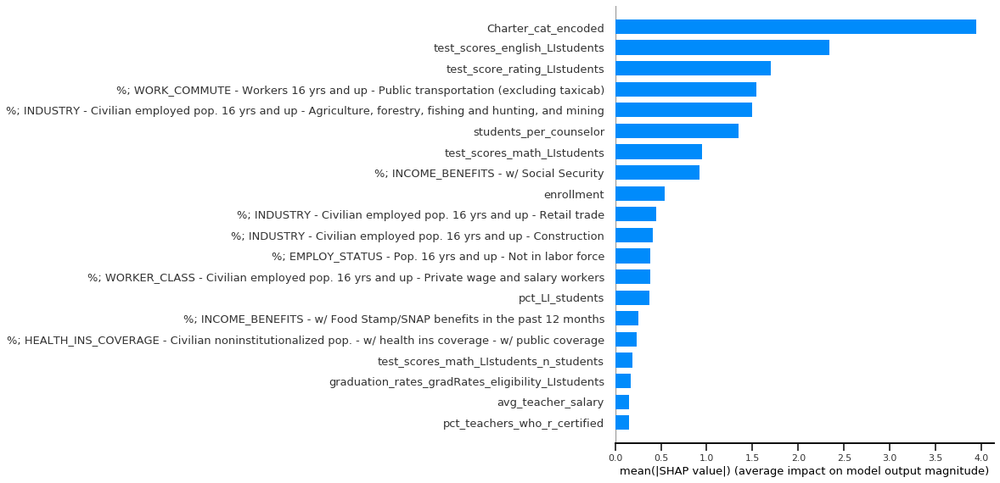

<IPython.core.display.Javascript object>

In [445]:
shap_values = shap.TreeExplainer(rf_v1).shap_values(X_train_rf)
shap.summary_plot(shap_values, X_train_rf, plot_type="bar")

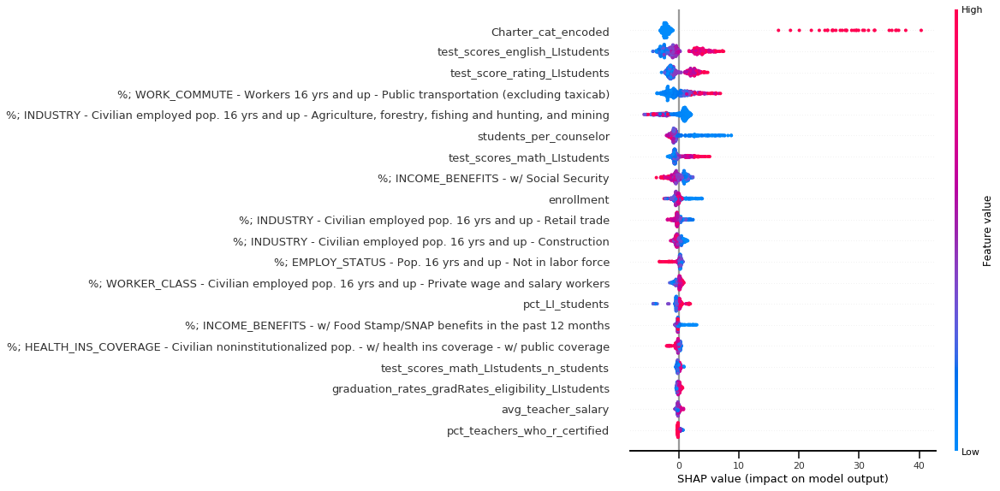

<IPython.core.display.Javascript object>

In [446]:
shap.summary_plot(shap_values, X_train_rf)

In [447]:
def ABS_SHAP(df_shap, df, top_n):
    # import matplotlib as plt
    """
    From blog post
    """

    # Make a copy of the input data
    shap_v = pd.DataFrame(df_shap)
    feature_list = df.columns
    shap_v.columns = feature_list
    df_v = df.copy().reset_index().drop("index", axis=1)

    # Determine the correlation in order to plot with different colors
    corr_list = list()
    for i in feature_list:
        b = np.corrcoef(shap_v[i], df_v[i])[1][0]
        corr_list.append(b)
    corr_df = pd.concat([pd.Series(feature_list), pd.Series(corr_list)], axis=1).fillna(
        0
    )
    # Make a data frame. Column 1 is the feature, and Column 2 is the correlation coefficient
    corr_df.columns = ["Variable", "Corr"]
    corr_df["Sign"] = np.where(corr_df["Corr"] > 0, "red", "blue")

    # Plot it
    shap_abs = np.abs(shap_v)
    k = pd.DataFrame(shap_abs.mean()).reset_index()
    k.columns = ["Variable", "SHAP_abs"]
    k2 = k.merge(corr_df, left_on="Variable", right_on="Variable", how="inner")
    k2 = k2.sort_values(by="SHAP_abs", ascending=True).tail(
        top_n
    )  # Added top_n to limit features
    colorlist = k2["Sign"]
    ax = k2.plot.barh(
        x="Variable", y="SHAP_abs", color=colorlist, figsize=(20, 16), legend=False,
    )
    ax.set_yticklabels(labels=k2["Variable"], fontsize=24)
    ax.set_xlabel("SHAP Value (Red = Positive Impact)", fontsize=24)
    ax.set_ylabel("")

    # return k2

    # ABS_SHAP(shap_values,X_train,top_n)
    # view rawABS_SHAP hosted with ❤ by GitHub

<IPython.core.display.Javascript object>

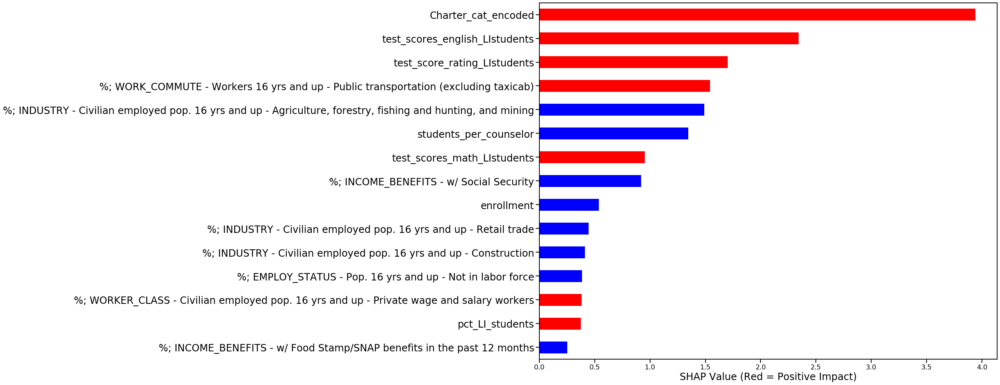

<IPython.core.display.Javascript object>

In [448]:
ABS_SHAP(shap_values, X_train_rf, 15)

#### Evaluating with different split

In [182]:
def get_split_data_v1(X, y, testsize):

    # Keep rows only if there are no null values for that feature and target
    k_rows2keep = pd.merge(X, y, left_index=True, right_index=True).notnull().sum(
        axis=1
    ) == (X.shape[1] + 1)
    print(
        "No. of total schools before splitting (no null values for feature set or target): ",
        sum(k_rows2keep),
    )

    X = X.loc[k_rows2keep, :].copy()
    y = y[k_rows2keep].copy()

    # Split data between train and test_(and_holdout?)
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=testsize, random_state=42
    )

    return X_train, X_test, y_train, y_test

<IPython.core.display.Javascript object>

In [187]:
(
    X_train_splitv1_rf,
    X_test_splitv1_rf,
    y_train_splitv1_rf,
    y_test_splitv1_rf,
) = get_split_data_v1(X_rf, y_rf, 0.4)

No. of total schools before splitting (no null values for feature set or target):  825


<IPython.core.display.Javascript object>

In [192]:
rf_split_v1_modv1, df_eval_split_v1_modv1 = run_randomforest_v1(
    X_train_splitv1_rf,
    y_train_splitv1_rf,
    X_test_splitv1_rf,
    y_test_splitv1_rf,
    best_params,
)

<IPython.core.display.Javascript object>

In [195]:
features = X_train_splitv1_rf.columns.tolist()
feature_imp = pd.Series(
    rf_split_v1_modv1.feature_importances_, index=features
).sort_values(ascending=False)
feature_imp[0:10]

Charter_cat_encoded                                                                             0.312619
test_scores_math_LIstudents                                                                     0.097150
test_scores_english_LIstudents                                                                  0.037970
%; INCOME_BENEFITS - w/ Social Security                                                         0.035382
enrollment                                                                                      0.025209
%; WORK_COMMUTE - Workers 16 yrs and up - Walked                                                0.024615
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage    0.024261
students_per_counselor                                                                          0.023836
%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)             0.023788
%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the

<IPython.core.display.Javascript object>

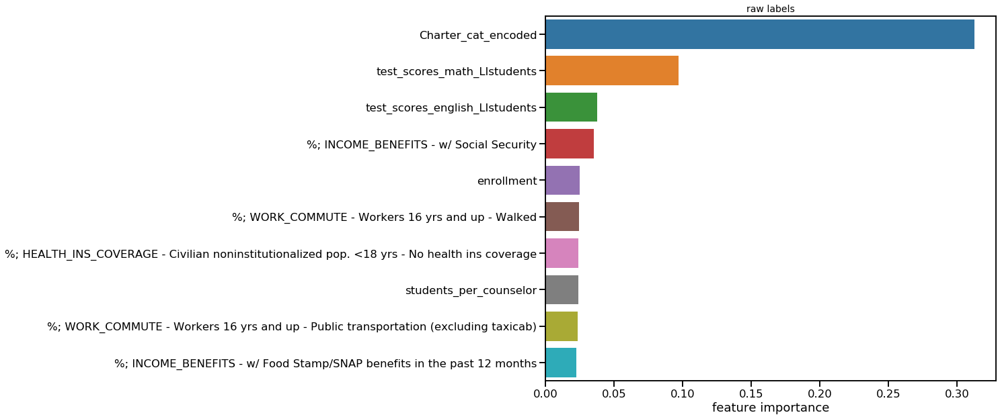

<IPython.core.display.Javascript object>

In [196]:
# Show most important features
features = X_train_splitv1_rf.columns.tolist()
feature_imp = pd.Series(
    rf_split_v1_modv1.feature_importances_, index=features
).sort_values(ascending=False)

# Creating a bar plot
#f, (ax1, ax2) = plt.subplots(2, 1, figsize=(12,16))
f, (ax1) = plt.subplots(1, 1, figsize=(12,10))

#ax1 = 
sns.barplot(x=feature_imp[0:10], y=feature_imp.index[0:10], ax=ax1)
ax1.set_title('raw labels')
ax1.set_xlabel('feature importance', fontsize=18);

# sns.barplot(x=feature_imp[0:10], y=feature_imp.index[0:10], ax=ax2)
# new_labels = ['% college eligible - all students', 
#               '% low income students', 
#               '% industry - professional, scientific, management', 
#               'math test scores (all students)', 
#               'avg. teacher salary', 
#               'English test scores (all students)', 
#               '% with supplemental security income', 
#               'mean retirement income', 
#               '% income $35-50K', 
#               '% not in labor force with health insurance coverage']
# ax2.set_yticklabels(new_labels)
# ax2.set_xlabel('feature importance', fontsize=18);
# ax1.set_xticklabels(new_labels, rotation=45, ha='right');
#ax1.set_xticklabels(range(1,11));
#ax1.legend(new_labels, bbox_to_anchor=(1, 1), loc='upper left', ncol=1, fontsize=10);


## RF regression, target: SPLICE and gap

### Get split data

In [458]:
# leave all features in
target = "nonLI-LI_UCCSU_eligibility_gap"

<IPython.core.display.Javascript object>

In [459]:
X_rf_gap = df_state_info_gs_census[all_features_filt_wcensuscheck].copy()
y_rf_gap = df_state_info_gs_census[target].copy()

<IPython.core.display.Javascript object>

In [460]:
X_train_rf_gap, X_test_rf_gap, y_train_rf_gap, y_test_rf_gap = get_split_data(
    X_rf_gap, y_rf_gap, 0.4
)

No. of total schools before splitting (no null values for feature set or target):  811


<IPython.core.display.Javascript object>

### Run model with search to find best parameters

In [461]:
# Number of trees in random forest
n_estimators = range(50, 500, 10)
# Number of features to consider at every split
max_features = ["auto", "sqrt"]
# Maximum number of levels in tree - since I have ~1000 schools
max_depth = [2, 3, 4, 5, 6, 7, 8, 9, 10]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {
    "n_estimators": n_estimators,
    "max_features": max_features,
    "max_depth": max_depth,
    "min_samples_split": min_samples_split,
    "min_samples_leaf": min_samples_leaf,
    "bootstrap": bootstrap,
}

<IPython.core.display.Javascript object>

In [462]:
# Instantiate model - note haven't used oob_scorebool parameter
rf_gap = RandomForestRegressor()

# Rn search using 5-fold cross-validation
rf_gap_random = RandomizedSearchCV(
    estimator=rf_gap,  # the model
    param_distributions=random_grid,  # from above
    n_iter=10,  # no. of parameter settings sampled
    cv=3,
    verbose=2,
    random_state=42,
    n_jobs=-1,
    refit=False,
    scoring=[
        "r2",
        "neg_root_mean_squared_error",
    ],  # look at multiple evaluation metrics
    return_train_score=True,  # computationally expensive, but output here for insight
)

rf_gap_random.fit(X_train_rf_gap, y_train_rf_gap)


Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   12.3s finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestRegressor(bootstrap=True,
                                                   ccp_alpha=0.0,
                                                   criterion='mse',
                                                   max_depth=None,
                                                   max_features='auto',
                                                   max_leaf_nodes=None,
                                                   max_samples=None,
                                                   min_impurity_decrease=0.0,
                                                   min_impurity_split=None,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   n_estimators=100,
                              

<IPython.core.display.Javascript object>

In [463]:
df_cv_results = pd.DataFrame(rf_gap_random.cv_results_)
df_cv_results.T

,0,1,2,3,4,5,6,7,8,9
mean_fit_time,1.05258,0.214135,0.602918,1.57152,0.458774,1.59746,1.26716,1.02625,2.0949,0.456828
std_fit_time,0.00915703,0.00543677,0.0504989,0.0289775,0.0316148,0.0229501,0.0262693,0.0215906,0.0164544,0.0712594
mean_score_time,0.0518315,0.0137739,0.0186093,0.065077,0.0295787,0.0352935,0.073076,0.060039,0.0338418,0.022457
std_score_time,0.00135416,0.00206233,0.00148144,0.00350525,0.00243729,0.00171283,0.00209485,0.000457202,0.00155444,0.00620311
param_n_estimators,300,50,100,400,130,210,440,390,240,150
param_min_samples_split,10,2,5,10,5,5,5,5,5,5
param_min_samples_leaf,4,1,1,1,1,4,2,4,1,2
param_max_features,sqrt,sqrt,auto,sqrt,sqrt,auto,sqrt,sqrt,auto,sqrt
param_max_depth,10,None,3,8,8,8,6,5,9,9
param_bootstrap,True,False,True,True,False,True,False,False,True,True


<IPython.core.display.Javascript object>

In [464]:
# Return the parameters that are best

bool_best_rank = (df_cv_results["rank_test_neg_root_mean_squared_error"] == 1) & (
    df_cv_results["rank_test_r2"] == 1
)

idx_bool = df_cv_results.index[bool_best_rank][0]
best_params = df_cv_results.loc[idx_bool, "params"]
best_params

{'n_estimators': 240,
 'min_samples_split': 5,
 'min_samples_leaf': 1,
 'max_features': 'auto',
 'max_depth': 9,
 'bootstrap': True}

<IPython.core.display.Javascript object>

In [465]:
# Add random state to the parameters
best_params["random_state"] = 42
best_params

{'n_estimators': 240,
 'min_samples_split': 5,
 'min_samples_leaf': 1,
 'max_features': 'auto',
 'max_depth': 9,
 'bootstrap': True,
 'random_state': 42}

<IPython.core.display.Javascript object>

In [466]:
def run_randomforest_v2_gap(X_train, y_train, X_test, y_test, parameters):
    # Use dictionary of parameters - use the double asterisks to unpack
    parameters["random_state"] = 42
    rf = RandomForestRegressor(**parameters)
    rf.fit(X_train, y_train)
    y_pred = rf.predict(X_test)
    df_eval = pd.DataFrame({"test": y_test, "pred": y_pred})

    return rf, df_eval

<IPython.core.display.Javascript object>

In [467]:
rf_gap_v2, df_eval_v2 = run_randomforest_v2_gap(
    X_train_rf_gap, y_train_rf_gap, X_test_rf_gap, y_test_rf_gap, best_params
)

<IPython.core.display.Javascript object>

In [468]:
# Verify the right parameters are being put in
rf_gap_v2

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=9, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=5, min_weight_fraction_leaf=0.0,
                      n_estimators=240, n_jobs=None, oob_score=False,
                      random_state=42, verbose=0, warm_start=False)

<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'test vs. prediction of SPLICE')

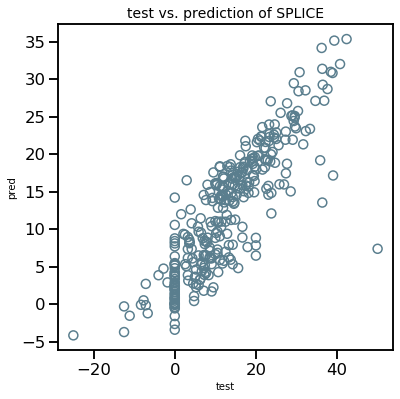

<IPython.core.display.Javascript object>

In [469]:
f, (ax1) = plt.subplots(1, 1, figsize=(6, 6))
scatter_plot_open_circles(df_eval_v2, "test", "pred", ax1)
ax1.set_title("test vs. prediction of SPLICE")

### Most important features from model

''

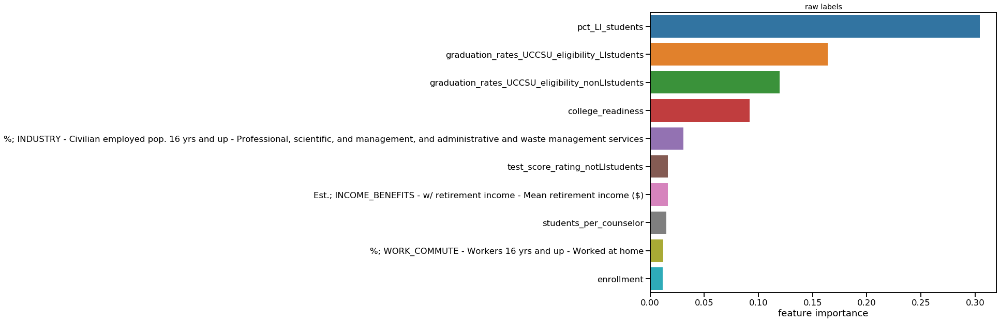

<IPython.core.display.Javascript object>

In [470]:
# Show most important features
features = X_train_rf_gap.columns.tolist()
feature_imp = pd.Series(rf_gap_v2.feature_importances_, index=features).sort_values(ascending=False)

# Creating a bar plot
#f, (ax1, ax2) = plt.subplots(2, 1, figsize=(12,16))
f, (ax1) = plt.subplots(1, 1, figsize=(12,10))

#ax1 = 
sns.barplot(x=feature_imp[0:10], y=feature_imp.index[0:10], ax=ax1)
ax1.set_title('raw labels')
ax1.set_xlabel('feature importance', fontsize=18);
;

In [478]:
feature_imp

pct_LI_students                                                                                                                                    0.304554
graduation_rates_UCCSU_eligibility_LIstudents                                                                                                      0.163750
graduation_rates_UCCSU_eligibility_nonLIstudents                                                                                                   0.119698
college_readiness                                                                                                                                  0.091709
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services    0.030807
test_score_rating_notLIstudents                                                                                                                    0.016477
Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement i

<IPython.core.display.Javascript object>

### Most important features from SHAP

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


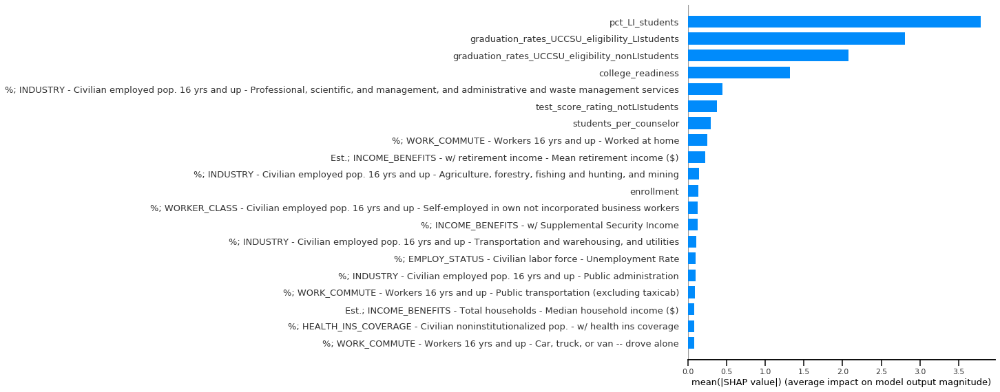

<IPython.core.display.Javascript object>

In [472]:
shap_values = shap.TreeExplainer(rf_gap_v2).shap_values(X_train_rf_gap)
shap.summary_plot(shap_values, X_train_rf_gap, plot_type="bar")

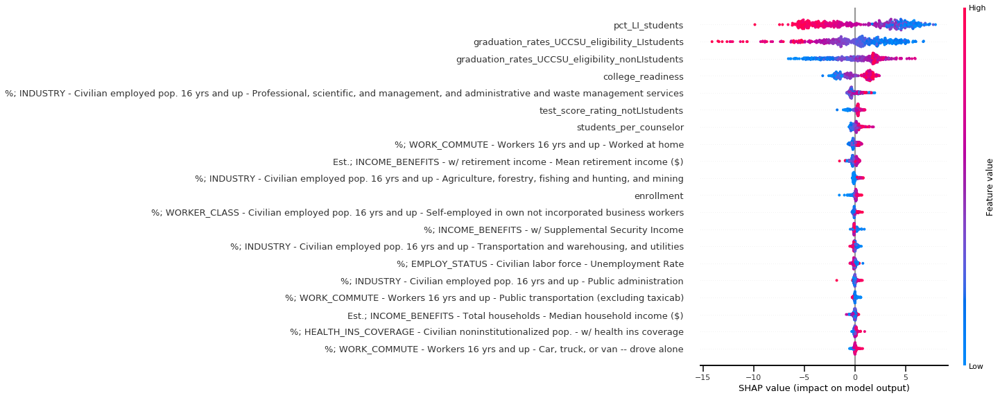

<IPython.core.display.Javascript object>

In [473]:
shap.summary_plot(shap_values, X_train_rf_gap)

In [447]:
def ABS_SHAP(df_shap, df, top_n):
    # import matplotlib as plt
    """
    From blog post
    """

    # Make a copy of the input data
    shap_v = pd.DataFrame(df_shap)
    feature_list = df.columns
    shap_v.columns = feature_list
    df_v = df.copy().reset_index().drop("index", axis=1)

    # Determine the correlation in order to plot with different colors
    corr_list = list()
    for i in feature_list:
        b = np.corrcoef(shap_v[i], df_v[i])[1][0]
        corr_list.append(b)
    corr_df = pd.concat([pd.Series(feature_list), pd.Series(corr_list)], axis=1).fillna(
        0
    )
    # Make a data frame. Column 1 is the feature, and Column 2 is the correlation coefficient
    corr_df.columns = ["Variable", "Corr"]
    corr_df["Sign"] = np.where(corr_df["Corr"] > 0, "red", "blue")

    # Plot it
    shap_abs = np.abs(shap_v)
    k = pd.DataFrame(shap_abs.mean()).reset_index()
    k.columns = ["Variable", "SHAP_abs"]
    k2 = k.merge(corr_df, left_on="Variable", right_on="Variable", how="inner")
    k2 = k2.sort_values(by="SHAP_abs", ascending=True).tail(
        top_n
    )  # Added top_n to limit features
    colorlist = k2["Sign"]
    ax = k2.plot.barh(
        x="Variable", y="SHAP_abs", color=colorlist, figsize=(20, 16), legend=False,
    )
    ax.set_yticklabels(labels=k2["Variable"], fontsize=24)
    ax.set_xlabel("SHAP Value (Red = Positive Impact)", fontsize=24)
    ax.set_ylabel("")

    # return k2

    # ABS_SHAP(shap_values,X_train,top_n)
    # view rawABS_SHAP hosted with ❤ by GitHub

<IPython.core.display.Javascript object>

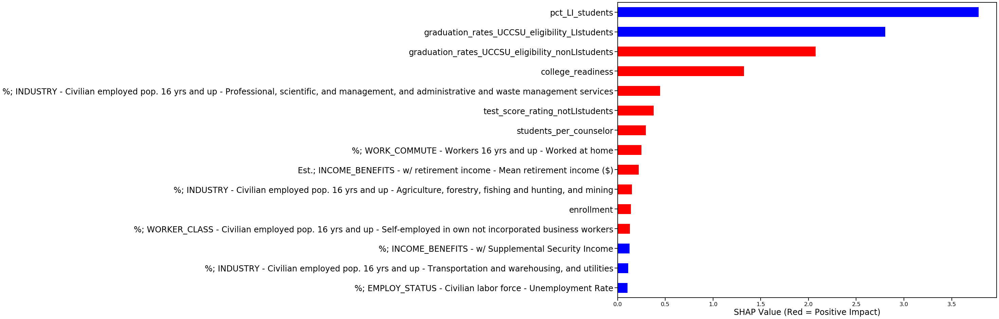

<IPython.core.display.Javascript object>

In [474]:
ABS_SHAP(shap_values, X_train_rf_gap, 15)

### Additional visualization

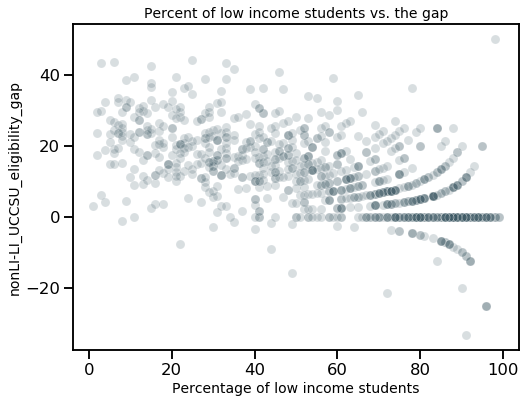

<IPython.core.display.Javascript object>

In [482]:
f, (ax1) = plt.subplots(1, 1, figsize=(8, 6))

sns.scatterplot(
    data=df_state_info_gs_census,
    x="pct_LI_students",
    y="nonLI-LI_UCCSU_eligibility_gap",
    ax=ax1,
    alpha=0.2,
    color=B_slate,
    legend=False,
)
ax1.set_xlabel(
    "Percentage of low income students", fontsize=14
)
ax1.set_ylabel(
    "nonLI-LI_UCCSU_eligibility_gap", fontsize=14
)
ax1.set_title(
    "Percent of low income students vs. the gap", fontsize=14
);


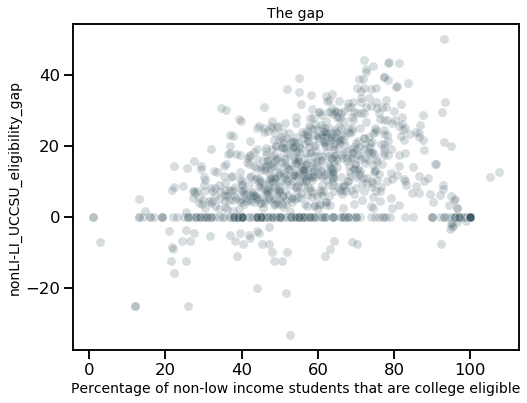

<IPython.core.display.Javascript object>

In [475]:
f, (ax1) = plt.subplots(1, 1, figsize=(8, 6))

sns.scatterplot(
    data=df_state_info_gs_census,
    x="graduation_rates_UCCSU_eligibility_nonLIstudents",
    y="nonLI-LI_UCCSU_eligibility_gap",
    ax=ax1,
    alpha=0.2,
    color=B_slate,
    legend=False,
)
ax1.set_xlabel(
    "Percentage of non-low income students that are college eligible", fontsize=14
)
ax1.set_ylabel(
    "nonLI-LI_UCCSU_eligibility_gap", fontsize=14
)
ax1.set_title(
    "The gap", fontsize=14
);


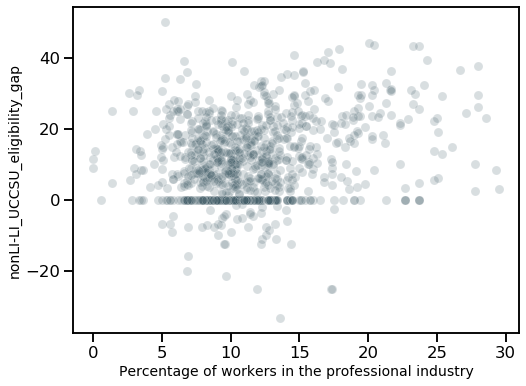

<IPython.core.display.Javascript object>

In [481]:
f, (ax1) = plt.subplots(1, 1, figsize=(8, 6))

sns.scatterplot(
    data=df_state_info_gs_census,
    x="%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services",
    y="nonLI-LI_UCCSU_eligibility_gap",
    ax=ax1,
    alpha=0.2,
    color=B_slate,
    legend=False,
)
ax1.set_xlabel(
    "Percentage of workers in the professional industry", fontsize=14
)
ax1.set_ylabel(
    "nonLI-LI_UCCSU_eligibility_gap", fontsize=14
)
ax1.set_title(
    "", fontsize=14
);


## RF regression, target: SPLICE and pct all students college eligible

In [449]:
df_state_info_gs_census.head()

,Unnamed: 0,CDSCode,NCESDist,NCESSchool,StatusType,County,District,School,Street,StreetAbr,...,pct_nonLI_students,est_LI_grade12_students,est_nonLI_grade12_students,est_UCCSU_eligible_all,est_UCCSU_eligible_LI,est_UCCSU_eligible_nonLI,graduation_rates_UCCSU_eligibility_nonLIstudents,Magnet_cat_encoded,Charter_cat_encoded,nonLI-LI_UCCSU_eligibility_gap
0,0,1100170112607,0691051,10947,Active,Alameda,Alameda County Office of Education,Envision Academy for Arts & Technology,1515 Webster Street,1515 Webster St.,...,33.0,58.96,29.04,88.00,58.9600,29.0400,100.000000,0.0,1,0.000000e+00
1,1,1611190130229,0601770,00041,Active,Alameda,Alameda Unified,Alameda High,2200 Central Ave,2200 Central Ave,...,82.0,68.58,312.42,251.46,34.2900,217.1700,69.512195,0.0,0,1.951220e+01
2,2,1611190130625,0601770,08674,Active,Alameda,Alameda Unified,Alternatives in Action,6221 East 17th St,6221 East 17th St,...,NaN,NaN,NaN,31.00,NaN,NaN,NaN,0.0,1,NaN
3,23,1612590108944,0628050,10726,Active,Alameda,Oakland Unified,Lighthouse Community Charter High,444 Hegenberger Road,444 Hegenberger Rd.,...,20.0,47.20,11.80,59.00,47.2000,11.8000,100.000000,0.0,1,4.263256e-14
4,3,1611270130450,0601860,00059,Active,Alameda,Albany City Unified,Albany High,603 Key Route Boulevard,603 Key Route Blvd.,...,83.0,48.45,236.55,179.55,21.8025,157.7475,66.686747,0.0,0,2.168675e+01


<IPython.core.display.Javascript object>

In [685]:
df_state_info_gs_census.loc[:, "graduation_rates_UCCSU_eligibility_LI_all_diff"] = df_state_info_gs_census.loc[:, "graduation_rates_UCCSU_eligibility_LIstudents"] - df_state_info_gs_census.loc[:, "graduation_rates_UCCSU_eligibility_allStudents"]


<IPython.core.display.Javascript object>

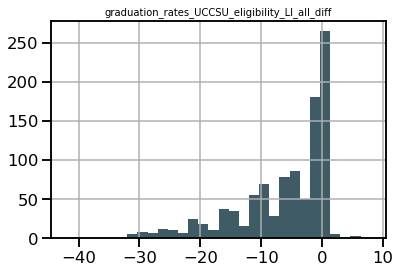

<IPython.core.display.Javascript object>

In [687]:
f, ax1 = plt.subplots()
hist_plot(
    df_state_info_gs_census, "graduation_rates_UCCSU_eligibility_LI_all_diff", ax1
)

In [694]:
target = "graduation_rates_UCCSU_eligibility_LI_all_diff"

<IPython.core.display.Javascript object>

In [695]:
X_rf_v1 = df_state_info_gs_census[all_features_filt_wcensuscheck_notarget].copy()
y_rf_v1 = df_state_info_gs_census[target].copy()

<IPython.core.display.Javascript object>

In [697]:
X_train_rf_v1, X_test_rf_v1, y_train_rf_v1, y_test_rf_v1 = get_split_data(
    X_rf_v1, y_rf_v1, 0.4
)

No. of total schools before splitting (no null values for feature set or target):  825


<IPython.core.display.Javascript object>

In [698]:
rf_v1, df_eval_v1 = run_randomforest_v0(
    X_train_rf_v1, y_train_rf_v1, X_test_rf_v1, y_test_rf_v1
)

<IPython.core.display.Javascript object>

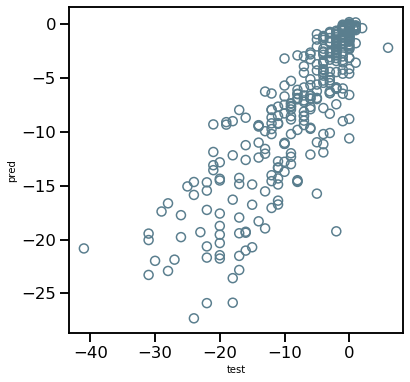

<IPython.core.display.Javascript object>

In [699]:
f, (ax1) = plt.subplots(1, 1, figsize=(6, 6))
scatter_plot_open_circles(df_eval_v1, "test", "pred", ax1)

In [701]:
print("R2 score: ", rf_v1.score(X_test_rf_v1, y_test_rf_v1))

R2 score:  0.7376636998668289


<IPython.core.display.Javascript object>

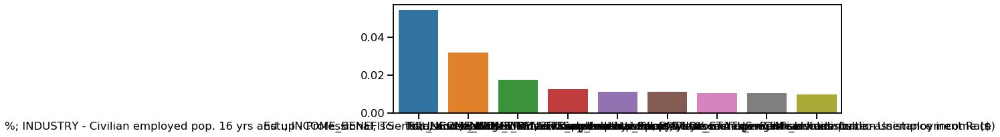

<IPython.core.display.Javascript object>

In [708]:
# Show most important features
features = X_train_rf_v1.columns.tolist()
feature_imp = pd.Series(rf_v1.feature_importances_, index=features).sort_values(
    ascending=False
)

# Creating a bar plot
plt.figure(figsize=(12, 3))
ax = sns.barplot(y=feature_imp[1:10], x=feature_imp.index[1:10])

In [703]:
feature_imp.head(10)

pct_LI_students                                                                                                                                    0.642368
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services    0.054382
Est.; INCOME_BENEFITS - Total households - Median household income ($)                                                                             0.031948
test_scores_math_LIstudents_n_students                                                                                                             0.017409
%; INCOME_BENEFITS - w/ Supplemental Security Income                                                                                               0.012607
avg_teacher_salary                                                                                                                                 0.011402
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public admi

<IPython.core.display.Javascript object>

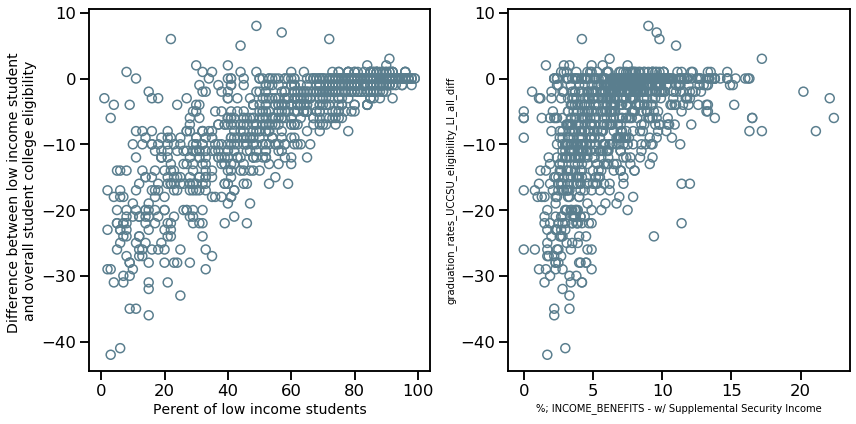

<IPython.core.display.Javascript object>

In [743]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "pct_LI_students",
    "graduation_rates_UCCSU_eligibility_LI_all_diff",
    ax1,
)
ax1.set_xlabel("Perent of low income students", fontsize=14)
ax1.set_ylabel(
    "Difference between low income student \nand overall student college eligibility",
    fontsize=14,
)


scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; INCOME_BENEFITS - w/ Supplemental Security Income",
    "graduation_rates_UCCSU_eligibility_LI_all_diff",
    ax2,
)

plt.tight_layout()

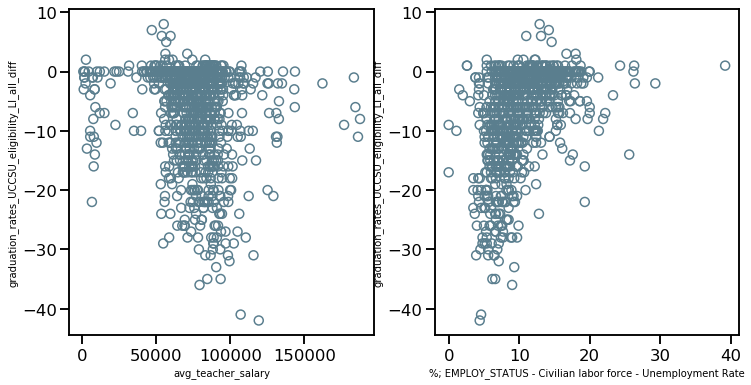

<IPython.core.display.Javascript object>

In [710]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "avg_teacher_salary",
    "graduation_rates_UCCSU_eligibility_LI_all_diff",
    ax1,
)

scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate",
    "graduation_rates_UCCSU_eligibility_LI_all_diff",
    ax2,
)

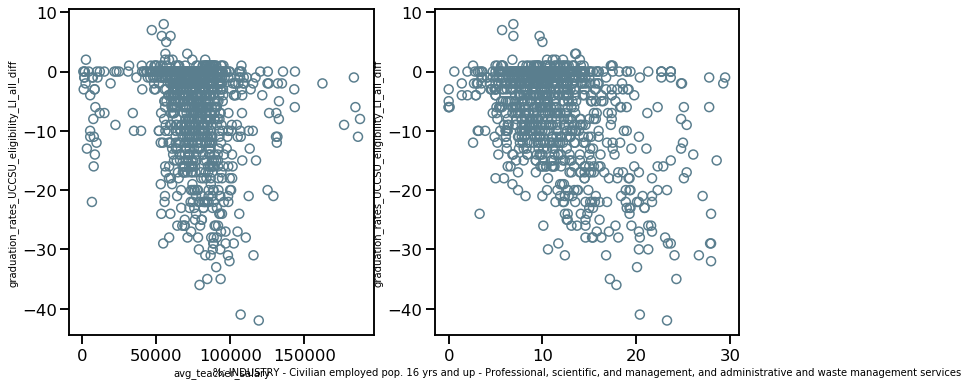

<IPython.core.display.Javascript object>

In [723]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "avg_teacher_salary",
    "graduation_rates_UCCSU_eligibility_LI_all_diff",
    ax1,
)

scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services",
    "graduation_rates_UCCSU_eligibility_LI_all_diff",
    ax2,
)

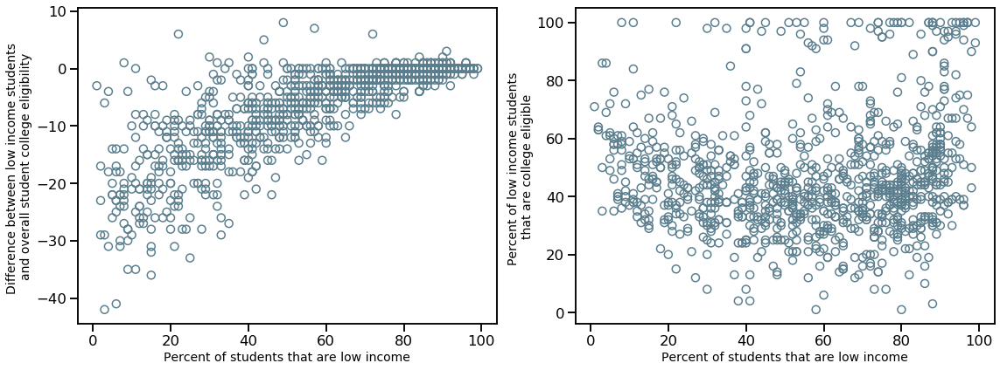

<IPython.core.display.Javascript object>

In [899]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "pct_LI_students",
    "graduation_rates_UCCSU_eligibility_LI_all_diff",
    ax1,
)
ax1.set_xlabel("Percent of students that are low income", fontsize=14)
ax1.set_ylabel(
    "Difference between low income students \nand overall student college eligibility",
    fontsize=14,
)


scatter_plot_open_circles(
    df_state_info_gs_census,
    "pct_LI_students",
    "graduation_rates_UCCSU_eligibility_LIstudents",
    ax2,
)

ax2.set_xlabel("Percent of students that are low income", fontsize=14)
ax2.set_ylabel(
    "Percent of low income students \nthat are college eligible", fontsize=14,
)
plt.tight_layout()

In [721]:
df_state_info_gs_census.sort_values(
    by="graduation_rates_UCCSU_eligibility_LI_all_diff", ascending=False
).loc[
    :,
    ["School", "City"]
    + all_features_filt_wcensuscheck_notarget
    + ["graduation_rates_UCCSU_eligibility_LIstudents", target],
].head(
    10
)

,School,City,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months,%; INCOME_BENEFITS - w/ Social Security,%; INCOME_BENEFITS - w/ Supplemental Security Income,Est.; INCOME_BENEFITS - Total households - Median household income ($),Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($),Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($),%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage,...,avg_teacher_salary,test_score_rating_LIstudents,test_score_rating_notLIstudents,test_scores_english_LIstudents,test_scores_math_LIstudents,test_scores_math_LIstudents_n_students,graduation_rates_gradRates_eligibility_allStudents,graduation_rates_gradRates_eligibility_LIstudents,graduation_rates_UCCSU_eligibility_LIstudents,graduation_rates_UCCSU_eligibility_LI_all_diff
1009,Fall River Junior-Senior High,McArthur,2.5,42.3,9.0,NaN,NaN,NaN,80.0,35.6,...,55076.0,6.0,NaN,43.0,43.0,54.0,96.0,100.0,38.0,8.0
482,Redwood Academy of Ukiah,Ukiah,14.0,33.8,9.6,44596.0,30849.0,5465.0,87.2,49.5,...,47008.0,10.0,NaN,94.0,71.0,35.0,100.0,100.0,92.0,7.0
174,Lemoore Middle College High,Lemoore,11.1,18.4,4.2,48953.0,28140.0,3735.0,86.0,26.3,...,53762.0,5.0,10.0,69.0,13.0,16.0,95.0,100.0,100.0,6.0
685,New Technology High,Sacramento,16.5,32.4,9.8,45801.0,30934.0,4920.0,87.0,42.9,...,59676.0,2.0,4.0,32.0,12.0,25.0,96.0,94.0,73.0,6.0
1149,Marysville Charter Academy for the Arts,Marysville,19.9,31.2,11.0,44852.0,23725.0,5192.0,85.1,48.0,...,56749.0,8.0,NaN,64.0,40.0,119.0,92.0,96.0,72.0,5.0
1015,Dunsmuir High,Dunsmuir,13.2,48.3,17.2,28241.0,17935.0,4763.0,84.5,59.3,...,70957.0,39.0,39.0,NaN,NaN,NaN,77.0,75.0,42.0,3.0
654,NOVA Academy - Coachella,Coachella,23.0,15.1,6.2,37969.0,12531.0,4474.0,71.2,40.4,...,56200.0,4.0,4.0,42.0,NaN,NaN,91.0,90.0,86.0,3.0
850,High Tech High North County,San Marcos,2.6,31.8,2.9,59778.0,23576.0,3401.0,89.0,25.4,...,56111.0,5.0,8.0,62.0,14.0,21.0,97.0,96.0,98.0,2.0
377,Humanities and Arts (HARTS) Academy of Los Ang...,Harbor City,10.3,29.7,4.9,52294.0,25377.0,4715.0,82.8,36.8,...,74383.0,4.0,7.0,55.0,16.0,87.0,87.0,88.0,63.0,2.0
307,Linda Esperanza Marquez High A Huntington Park...,Huntington Park,19.8,23.4,7.5,35917.0,12985.0,5052.0,70.9,43.2,...,83091.0,7.0,8.0,68.0,28.0,127.0,85.0,88.0,64.0,2.0


<IPython.core.display.Javascript object>

## Statistical analysis, evaluate top and bottom performing schools

In [782]:
def run_mannwhitneyu(df, metric_col, bin_col):
    class0 = sorted(df[bin_col].unique())[0]
    class1 = sorted(df[bin_col].unique())[1]
    x = df.loc[df[bin_col] == class0, metric_col]
    y = df.loc[df[bin_col] == class1, metric_col]
    mwu_statistic, mwu_pval = mannwhitneyu(x, y, use_continuity=True, alternative=None)
    return mwu_pval

<IPython.core.display.Javascript object>

mean:  46.7021484375
mean +/- 1SD:  25.971879691038332 67.43241718396166


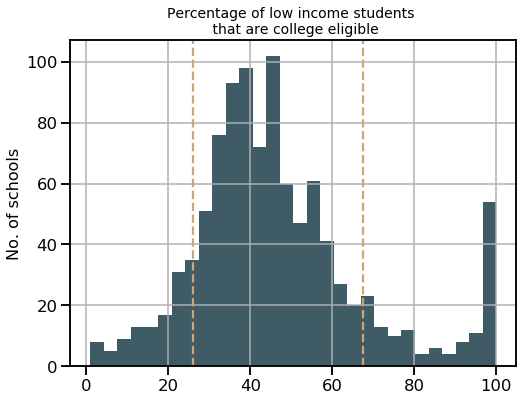

<IPython.core.display.Javascript object>

In [753]:
f, ax1 = plt.subplots(figsize=(8,6))
hist_plot(df_state_info_gs_census, "graduation_rates_UCCSU_eligibility_LIstudents", ax1)
ax1.set_ylabel("No. of schools", fontsize=16)
ax1.set_title("Percentage of low income students \n that are college eligible", fontsize=14);

target = df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"]
target_mean = target.mean()
target_sd = target.std()

# or top and bottom quantile

ax1.axvline(target_mean-target_sd, c=B_beige, linestyle="dashed")
ax1.axvline(target_mean+target_sd, c=B_beige, linestyle="dashed")

print("mean: ", target_mean)
print("mean +/- 1SD: ", target_mean - target_sd, target_mean + target_sd);


In [760]:
print(
    "No. of low performing schools: ",
    (
        df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"]
        < target_mean - target_sd
    ).sum(),
)

print(
    "No. of high performing schools: ",
    (
        df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"]
        > target_mean + target_sd
    ).sum(),
)

No. of low performing schools:  111
No. of high performing schools:  137


<IPython.core.display.Javascript object>

In [764]:
df_state_info_gs_census["LI_performance_status"] = "middle"

bool_low = df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"] < (
    target_mean - target_sd
)
df_state_info_gs_census.loc[bool_low, "LI_performance_status"] = "low"

bool_high = df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"] > (
    target_mean + target_sd
)
df_state_info_gs_census.loc[bool_high, "LI_performance_status"] = "high"

df_state_info_gs_census["LI_performance_status"].value_counts()

middle    904
high      137
low       111
Name: LI_performance_status, dtype: int64

<IPython.core.display.Javascript object>

In [771]:
feat_for_mw = all_features_filt_wcensuscheck[:-4]
feat_for_mw

['%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months',
 '%; INCOME_BENEFITS - w/ Social Security',
 '%; INCOME_BENEFITS - w/ Supplemental Security Income',
 'Est.; INCOME_BENEFITS - Total households - Median household income ($)',
 'Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($)',
 'Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)',
 '%; WORK_COMMUTE - Workers

<IPython.core.display.Javascript object>

In [774]:
status2keep = ["low", "high"]

df_state_info_gs_census_forMW = df_state_info_gs_census.loc[
    df_state_info_gs_census["LI_performance_status"].isin(status2keep),
    feat_for_mw + ["LI_performance_status"],
].copy()

<IPython.core.display.Javascript object>

In [775]:
df_state_info_gs_census_forMW.head()

,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months,%; INCOME_BENEFITS - w/ Social Security,%; INCOME_BENEFITS - w/ Supplemental Security Income,Est.; INCOME_BENEFITS - Total households - Median household income ($),Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($),Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($),%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage,"%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone",...,students_per_counselor,pct_teachers_3years_or_more,pct_teachers_who_r_certified,avg_teacher_salary,test_score_rating_LIstudents,test_score_rating_notLIstudents,test_scores_english_LIstudents,test_scores_math_LIstudents,test_scores_math_LIstudents_n_students,LI_performance_status
0,9.2,24.0,16.0,32993.0,29027.0,5055.0,82.2,41.3,4.7,30.5,...,343.0,31.0,100.0,56500.0,4.0,4.0,47.0,18.0,77.0,high
2,28.4,20.0,13.4,31903.0,19269.0,5347.0,80.2,48.5,6.7,59.4,...,147.0,82.0,67.0,41722.0,22.0,22.0,22.0,NaN,NaN,high
3,28.4,20.0,13.4,31903.0,19269.0,5347.0,80.2,48.5,6.7,59.4,...,NaN,64.0,90.0,51656.0,7.0,7.0,63.0,NaN,NaN,high
13,9.9,29.0,8.1,76773.0,20501.0,4077.0,90.3,29.4,2.9,77.2,...,188.0,75.0,96.0,62587.0,9.0,10.0,75.0,44.0,102.0,high
19,4.5,25.8,5.5,86757.0,20687.0,4531.0,90.4,29.6,4.0,77.0,...,444.0,87.0,93.0,105027.0,3.0,6.0,42.0,14.0,180.0,low


<IPython.core.display.Javascript object>

In [811]:
df_sig_features = pd.DataFrame()
df_sig_features["feature"] = None
df_sig_features["raw_pval"] = None


for i, feature in enumerate(feat_for_mw):
    mwu_pval_feature = run_mannwhitneyu(
        df_state_info_gs_census_forMW, feature, "LI_performance_status"
    )
    if mwu_pval_feature < 0.05:
        df_sig_features.loc[i, "feature"] = feature
        df_sig_features.loc[i, "raw_pval"] = mwu_pval_feature

df_sig_features = df_sig_features.sort_values(
    by="raw_pval", ascending=True
).reset_index()

bonferroni_reject, bonferroni_p_val_corrected = multitest.multipletests(
    df_sig_features["raw_pval"], alpha=0.05, method="bonferroni"
)[0:2]

df_sig_features["corr_p_val_rej"] = bonferroni_reject
df_sig_features["corr_p_val"] = bonferroni_p_val_corrected

<IPython.core.display.Javascript object>

In [831]:
df_sig_features.loc[df_sig_features["corr_p_val_rej"], ["feature", "corr_p_val"]]

,feature,corr_p_val
0,%; WORK_COMMUTE - Workers 16 yrs and up - Publ...,5.07987e-19
1,%; INDUSTRY - Civilian employed pop. 16 yrs an...,7.23522e-17
2,%; INCOME_BENEFITS - w/ Social Security,5.22535e-14
3,%; WORKER_CLASS - Civilian employed pop. 16 yr...,1.01559e-13
4,test_scores_english_LIstudents,4.72221e-13
5,Charter_cat_encoded,2.54253e-12
6,%; INDUSTRY - Civilian employed pop. 16 yrs an...,1.23895e-11
7,%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in...,1.76531e-11
8,%; INDUSTRY - Civilian employed pop. 16 yrs an...,4.63625e-11
9,%; INDUSTRY - Civilian employed pop. 16 yrs an...,2.34242e-09


<IPython.core.display.Javascript object>

In [834]:
[print(i, feature) for i, feature in enumerate(df_sig_features["feature"])]

0 %; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)
1 %; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services
2 %; INCOME_BENEFITS - w/ Social Security
3 %; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers
4 test_scores_english_LIstudents
5 Charter_cat_encoded
6 %; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration
7 %; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force
8 %; INDUSTRY - Civilian employed pop. 16 yrs and up - Information
9 %; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining
10 test_scores_math_LIstudents
11 test_score_rating_LIstudents
12 %; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed
13 %; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone
14 %; HEALTH_INS_COVERAGE - 

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

<IPython.core.display.Javascript object>

### First pass of boxplots - by order of significance

%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services
%; INCOME_BENEFITS - w/ Social Security


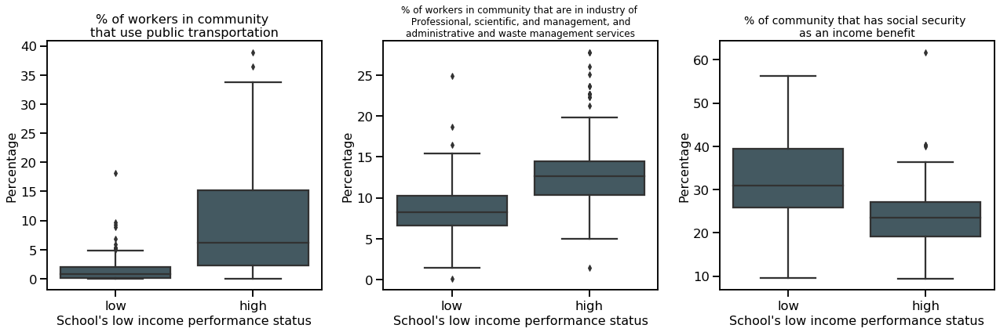

<IPython.core.display.Javascript object>

In [833]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

feature_rank_to_plot = [0,1,2]

# First feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[0], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[0], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax1,
)

ax1.set_title("% of workers in community \nthat use public transportation", fontsize=16)
ax1.set_xlabel("School's low income performance status", fontsize=16)
ax1.set_ylabel("Percentage", fontsize=16)

# Second feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[1], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[1], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax2,
)

ax2.set_title("% of workers in community that are in industry of \n Professional, scientific, and management, and \nadministrative and waste management services", fontsize=12)
ax2.set_xlabel("School's low income performance status", fontsize=16)
ax2.set_ylabel("Percentage", fontsize=16)

# Third feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[2], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[2], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax3,
)

ax3.set_title("% of community that has social security \nas an income benefit", fontsize=14)
ax3.set_xlabel("School's low income performance status", fontsize=16)
ax3.set_ylabel("Percentage", fontsize=16)


plt.tight_layout();



%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration
%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force


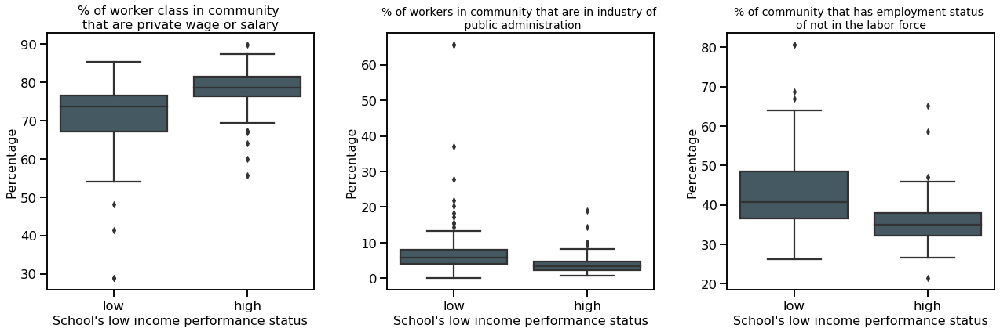

<IPython.core.display.Javascript object>

In [838]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

feature_rank_to_plot = [3, 6, 7]

# First feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[0], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[0], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax1,
)

ax1.set_title(
    "% of worker class in community \nthat are private wage or salary", fontsize=16
)
ax1.set_xlabel("School's low income performance status", fontsize=16)
ax1.set_ylabel("Percentage", fontsize=16)

# Second feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[1], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[1], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax2,
)

ax2.set_title(
    "% of workers in community that are in industry of \n public administration",
    fontsize=14,
)
ax2.set_xlabel("School's low income performance status", fontsize=16)
ax2.set_ylabel("Percentage", fontsize=16)

# Third feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[2], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[2], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax3,
)

ax3.set_title(
    "% of community that has employment status \nof not in the labor force", fontsize=14
)
ax3.set_xlabel("School's low income performance status", fontsize=16)
ax3.set_ylabel("Percentage", fontsize=16)

plt.tight_layout()

%; INDUSTRY - Civilian employed pop. 16 yrs and up - Information
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed


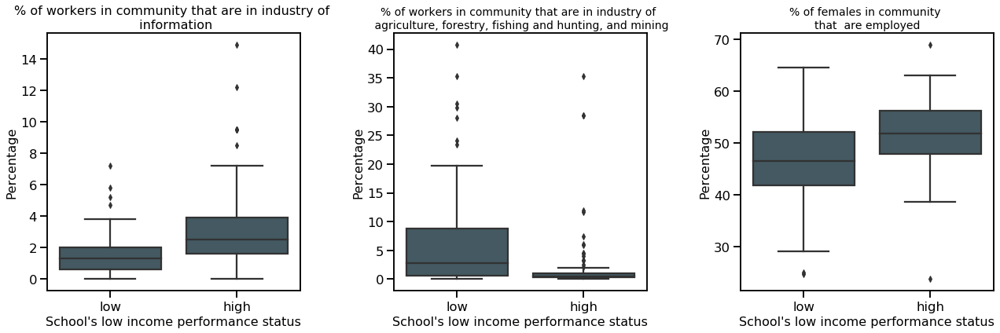

<IPython.core.display.Javascript object>

In [840]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

feature_rank_to_plot = [8, 9, 12]

# First feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[0], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[0], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax1,
)

ax1.set_title(
    "% of workers in community that are in industry of \n information", fontsize=16
)
ax1.set_xlabel("School's low income performance status", fontsize=16)
ax1.set_ylabel("Percentage", fontsize=16)

# Second feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[1], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[1], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax2,
)

ax2.set_title(
    "% of workers in community that are in industry of \n agriculture, forestry, fishing and hunting, and mining",
    fontsize=14,
)
ax2.set_xlabel("School's low income performance status", fontsize=16)
ax2.set_ylabel("Percentage", fontsize=16)

# Third feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[2], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[2], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax3,
)

ax3.set_title("% of females in community \nthat  are employed", fontsize=14)
ax3.set_xlabel("School's low income performance status", fontsize=16)
ax3.set_ylabel("Percentage", fontsize=16)

plt.tight_layout()

%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing


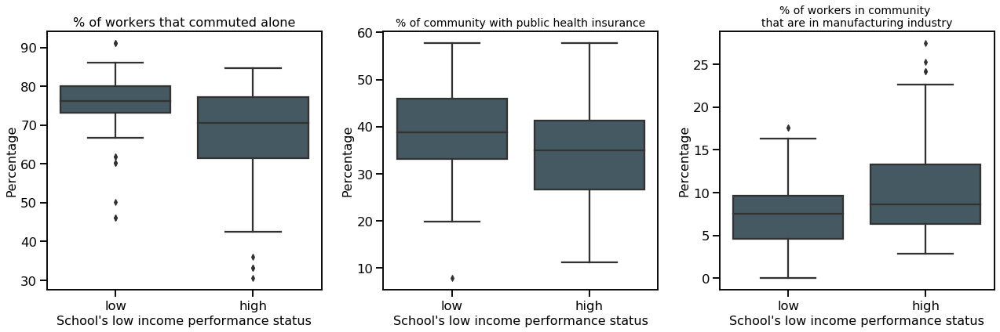

<IPython.core.display.Javascript object>

In [842]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

feature_rank_to_plot = [13, 14, 15]

# First feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[0], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[0], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax1,
)

ax1.set_title("% of workers that commuted alone", fontsize=16)
ax1.set_xlabel("School's low income performance status", fontsize=16)
ax1.set_ylabel("Percentage", fontsize=16)

# Second feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[1], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[1], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax2,
)

ax2.set_title(
    "% of community with public health insurance", fontsize=14,
)
ax2.set_xlabel("School's low income performance status", fontsize=16)
ax2.set_ylabel("Percentage", fontsize=16)

# Third feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[2], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[2], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax3,
)

ax3.set_title(
    "% of workers in community \nthat are in manufacturing industry", fontsize=14
)
ax3.set_xlabel("School's low income performance status", fontsize=16)
ax3.set_ylabel("Percentage", fontsize=16)

plt.tight_layout()

### Second pass of boxplots - by category

%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Information
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing


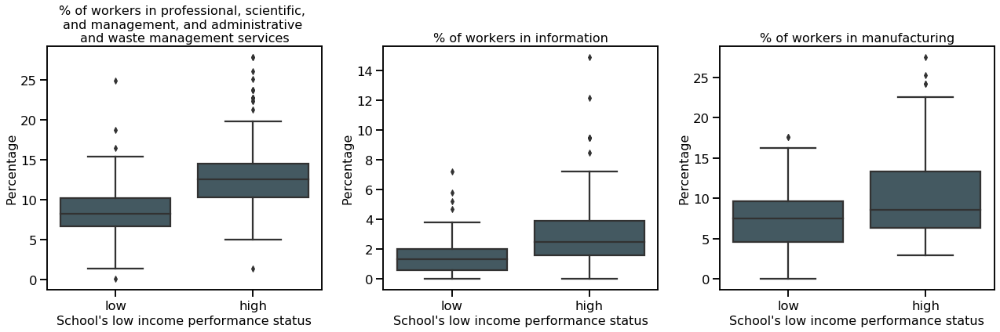

<IPython.core.display.Javascript object>

In [851]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

feature_rank_to_plot = [1,8,15]

# First feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[0], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[0], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax1,
)

ax1.set_title("% of workers in professional, scientific, \nand management, and administrative \nand waste management services", fontsize=16)
ax1.set_xlabel("School's low income performance status", fontsize=16)
ax1.set_ylabel("Percentage", fontsize=16)

# Second feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[1], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[1], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax2,
)

ax2.set_title("% of workers in information", fontsize=16)
ax2.set_xlabel("School's low income performance status", fontsize=16)
ax2.set_ylabel("Percentage", fontsize=16)

# Third feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[2], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[2], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax3,
)

ax3.set_title("% of workers in manufacturing", fontsize=16)
ax3.set_xlabel("School's low income performance status", fontsize=16)
ax3.set_ylabel("Percentage", fontsize=16)

plt.tight_layout();


%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining


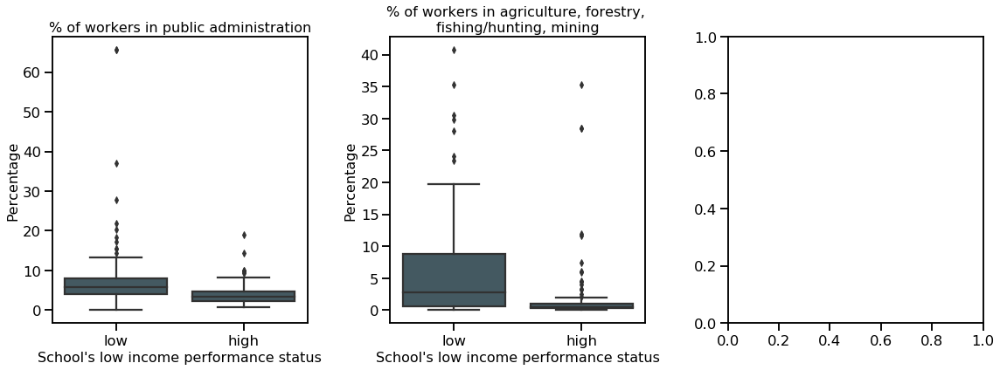

<IPython.core.display.Javascript object>

In [858]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 6))

feature_rank_to_plot = [6,9]

# First feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[0], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[0], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax1,
)

ax1.set_title("% of workers in public administration", fontsize=16)
ax1.set_xlabel("School's low income performance status", fontsize=16)
ax1.set_ylabel("Percentage", fontsize=16)

# Second feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[1], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[1], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax2,
)

ax2.set_title("% of workers in agriculture, forestry, \nfishing/hunting, mining", fontsize=16)
ax2.set_xlabel("School's low income performance status", fontsize=16)
ax2.set_ylabel("Percentage", fontsize=16)

plt.tight_layout();



%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed


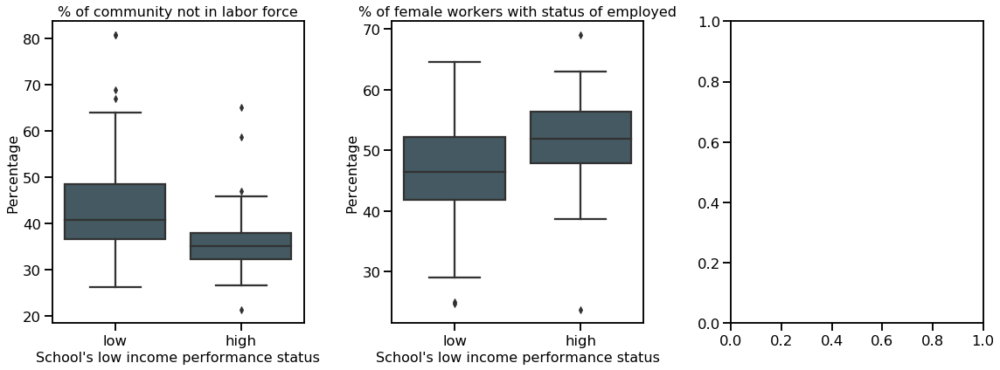

<IPython.core.display.Javascript object>

In [856]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 6))

feature_rank_to_plot = [7,12]

# First feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[0], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[0], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax1,
)

ax1.set_title("% of community not in labor force", fontsize=16)
ax1.set_xlabel("School's low income performance status", fontsize=16)
ax1.set_ylabel("Percentage", fontsize=16)

# Second feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[1], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[1], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax2,
)

ax2.set_title("% of female workers with status of employed", fontsize=16)
ax2.set_xlabel("School's low income performance status", fontsize=16)
ax2.set_ylabel("Percentage", fontsize=16)

plt.tight_layout();


%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)
%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone


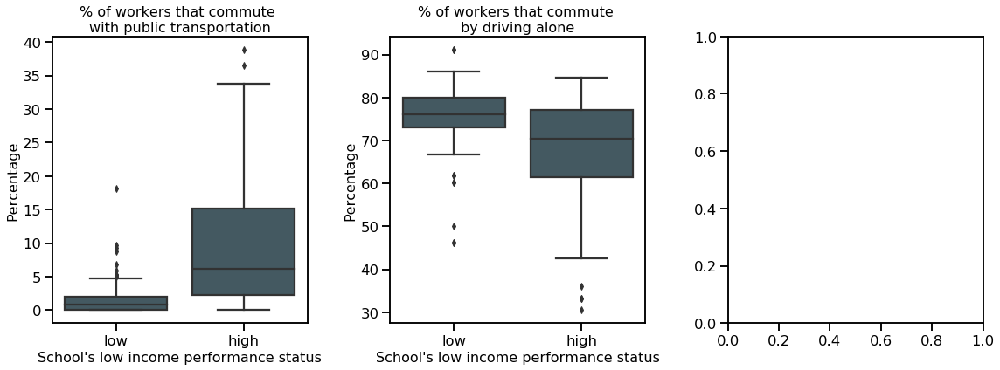

<IPython.core.display.Javascript object>

In [855]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 6))

feature_rank_to_plot = [0,13]

# First feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[0], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[0], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax1,
)

ax1.set_title("% of workers that commute \nwith public transportation", fontsize=16)
ax1.set_xlabel("School's low incomae performance status", fontsize=16)
ax1.set_ylabel("Percentage", fontsize=16)

# Second feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[1], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[1], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax2,
)

ax2.set_title("% of workers that commute \nby driving alone", fontsize=16)
ax2.set_xlabel("School's low income performance status", fontsize=16)
ax2.set_ylabel("Percentage", fontsize=16)

plt.tight_layout();


%; INCOME_BENEFITS - w/ Social Security
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage


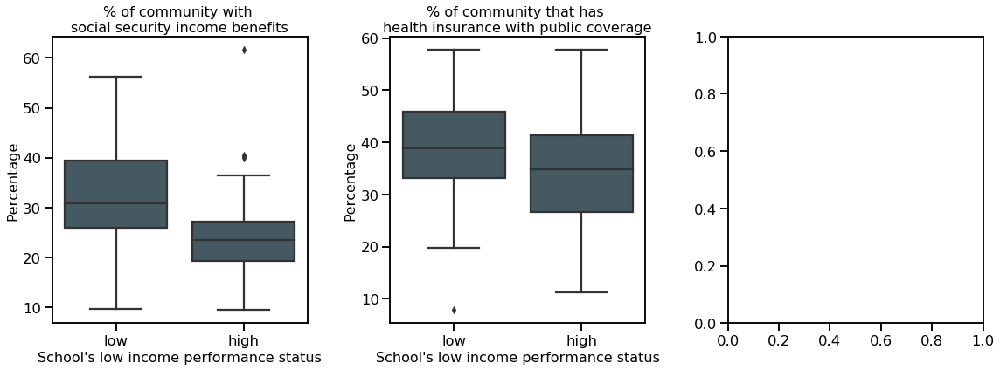

<IPython.core.display.Javascript object>

In [861]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 6))

feature_rank_to_plot = [2,14]

# First feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[0], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[0], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax1,
)

ax1.set_title("% of community with \nsocial security income benefits", fontsize=16)
ax1.set_xlabel("School's low income performance status", fontsize=16)
ax1.set_ylabel("Percentage", fontsize=16)

# Second feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[1], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[1], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax2,
)

ax2.set_title("% of community that has \nhealth insurance with public coverage", fontsize=16)
ax2.set_xlabel("School's low income performance status", fontsize=16)
ax2.set_ylabel("Percentage", fontsize=16)

plt.tight_layout();



## Geographic maps

### Load saved data up to this point

In [4]:
# Save data
# df_state_info_gs_census.to_csv(
#     "~/Documents/Data_science/Jupyter_notebooks/Education_study/data/df_state_info_gs_census_ALL_postmodel_4geo.csv",
#     index=True,
# )

df_state_info_gs_census = pd.read_csv(
    "~/Documents/Data_science/Jupyter_notebooks/Education_study/data/df_state_info_gs_census_ALL_postmodel_4geo.csv",
    index_col=0,
)

<IPython.core.display.Javascript object>

In [5]:
df_state_info_gs_census.head()

,Unnamed: 0.1,CDSCode,NCESDist,NCESSchool,StatusType,County,District,School,Street,StreetAbr,...,pct_nonLI_students,est_LI_grade12_students,est_nonLI_grade12_students,est_UCCSU_eligible_all,est_UCCSU_eligible_LI,est_UCCSU_eligible_nonLI,graduation_rates_UCCSU_eligibility_nonLIstudents,Magnet_cat_encoded,Charter_cat_encoded,nonLI-LI_UCCSU_eligibility_gap
0,0,1100170112607,0691051,10947,Active,Alameda,Alameda County Office of Education,Envision Academy for Arts & Technology,1515 Webster Street,1515 Webster St.,...,33.0,58.96,29.04,88.00,58.9600,29.0400,100.000000,0.0,1,0.000000e+00
1,1,1611190130229,0601770,00041,Active,Alameda,Alameda Unified,Alameda High,2200 Central Ave,2200 Central Ave,...,82.0,68.58,312.42,251.46,34.2900,217.1700,69.512195,0.0,0,1.951220e+01
2,2,1611190130625,0601770,08674,Active,Alameda,Alameda Unified,Alternatives in Action,6221 East 17th St,6221 East 17th St,...,NaN,NaN,NaN,31.00,NaN,NaN,NaN,0.0,1,NaN
3,23,1612590108944,0628050,10726,Active,Alameda,Oakland Unified,Lighthouse Community Charter High,444 Hegenberger Road,444 Hegenberger Rd.,...,20.0,47.20,11.80,59.00,47.2000,11.8000,100.000000,0.0,1,4.263256e-14
4,3,1611270130450,0601860,00059,Active,Alameda,Albany City Unified,Albany High,603 Key Route Boulevard,603 Key Route Blvd.,...,83.0,48.45,236.55,179.55,21.8025,157.7475,66.686747,0.0,0,2.168675e+01


<IPython.core.display.Javascript object>

In [6]:
df_state_info_gs_census.head()

,Unnamed: 0.1,CDSCode,NCESDist,NCESSchool,StatusType,County,District,School,Street,StreetAbr,...,pct_nonLI_students,est_LI_grade12_students,est_nonLI_grade12_students,est_UCCSU_eligible_all,est_UCCSU_eligible_LI,est_UCCSU_eligible_nonLI,graduation_rates_UCCSU_eligibility_nonLIstudents,Magnet_cat_encoded,Charter_cat_encoded,nonLI-LI_UCCSU_eligibility_gap
0,0,1100170112607,0691051,10947,Active,Alameda,Alameda County Office of Education,Envision Academy for Arts & Technology,1515 Webster Street,1515 Webster St.,...,33.0,58.96,29.04,88.00,58.9600,29.0400,100.000000,0.0,1,0.000000e+00
1,1,1611190130229,0601770,00041,Active,Alameda,Alameda Unified,Alameda High,2200 Central Ave,2200 Central Ave,...,82.0,68.58,312.42,251.46,34.2900,217.1700,69.512195,0.0,0,1.951220e+01
2,2,1611190130625,0601770,08674,Active,Alameda,Alameda Unified,Alternatives in Action,6221 East 17th St,6221 East 17th St,...,NaN,NaN,NaN,31.00,NaN,NaN,NaN,0.0,1,NaN
3,23,1612590108944,0628050,10726,Active,Alameda,Oakland Unified,Lighthouse Community Charter High,444 Hegenberger Road,444 Hegenberger Rd.,...,20.0,47.20,11.80,59.00,47.2000,11.8000,100.000000,0.0,1,4.263256e-14
4,3,1611270130450,0601860,00059,Active,Alameda,Albany City Unified,Albany High,603 Key Route Boulevard,603 Key Route Blvd.,...,83.0,48.45,236.55,179.55,21.8025,157.7475,66.686747,0.0,0,2.168675e+01


<IPython.core.display.Javascript object>

### Point dataset based on longitude and latitude

https://towardsdatascience.com/easy-steps-to-plot-geographic-data-on-a-map-python-11217859a2db

In [7]:
df_state_info_gs_census.iloc[0:5, 0:30].head()

,Unnamed: 0.1,CDSCode,NCESDist,NCESSchool,StatusType,County,District,School,Street,StreetAbr,...,WebSite,OpenDate,ClosedDate,Charter,CharterNum,FundingType,DOC,DOCType,SOC,SOCType
0,0,1100170112607,0691051,10947,Active,Alameda,Alameda County Office of Education,Envision Academy for Arts & Technology,1515 Webster Street,1515 Webster St.,...,http://www.envisionacademy.org/,2006-08-28 00:00:00,No Data,Y,0811,Directly funded,0.0,County Office of Education (COE),66,High Schools (Public)
1,1,1611190130229,0601770,00041,Active,Alameda,Alameda Unified,Alameda High,2200 Central Ave,2200 Central Ave,...,http://aus.alamedausd.ca.schoolloop.com,1980-07-01 00:00:00,No Data,N,No Data,No Data,54.0,Unified School District,66,High Schools (Public)
2,2,1611190130625,0601770,08674,Active,Alameda,Alameda Unified,Alternatives in Action,6221 East 17th St,6221 East 17th St,...,http://www.alternativesinaction.org,2001-09-04 00:00:00,No Data,Y,0398,Directly funded,54.0,Unified School District,66,High Schools (Public)
3,23,1612590108944,0628050,10726,Active,Alameda,Oakland Unified,Lighthouse Community Charter High,444 Hegenberger Road,444 Hegenberger Rd.,...,http://www.lighthousecharter.org,2005-09-06 00:00:00,No Data,Y,0700,Directly funded,54.0,Unified School District,66,High Schools (Public)
4,3,1611270130450,0601860,00059,Active,Alameda,Albany City Unified,Albany High,603 Key Route Boulevard,603 Key Route Blvd.,...,No Data,1980-07-01 00:00:00,No Data,N,No Data,No Data,54.0,Unified School District,66,High Schools (Public)


<IPython.core.display.Javascript object>

In [8]:
# Update data formatting of latitude and longitude
df_state_info_gs_census["Latitude"].replace("No Data", None, inplace=True)
df_state_info_gs_census["Latitude"] = pd.to_numeric(df_state_info_gs_census["Latitude"])

df_state_info_gs_census["Longitude"].replace("No Data", None, inplace=True)
df_state_info_gs_census["Longitude"] = pd.to_numeric(
    df_state_info_gs_census["Longitude"]
)

<IPython.core.display.Javascript object>

In [9]:
df_wgeo = df_state_info_gs_census[
    (df_state_info_gs_census["Latitude"] != "No Data")
    | (df_state_info_gs_census["Longitude"] != "No Data")
].copy()

df_wgeo["Latitude"] = pd.to_numeric(df_wgeo["Latitude"])
df_wgeo["Longitude"] = pd.to_numeric(df_wgeo["Longitude"])

/Users/lacar/anaconda/envs/insight/lib/python3.6/site-packages/pandas/core/ops/__init__.py:1115: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  result = method(y)


<IPython.core.display.Javascript object>

In [10]:
df_wgeo.head()

,Unnamed: 0.1,CDSCode,NCESDist,NCESSchool,StatusType,County,District,School,Street,StreetAbr,...,pct_nonLI_students,est_LI_grade12_students,est_nonLI_grade12_students,est_UCCSU_eligible_all,est_UCCSU_eligible_LI,est_UCCSU_eligible_nonLI,graduation_rates_UCCSU_eligibility_nonLIstudents,Magnet_cat_encoded,Charter_cat_encoded,nonLI-LI_UCCSU_eligibility_gap
0,0,1100170112607,0691051,10947,Active,Alameda,Alameda County Office of Education,Envision Academy for Arts & Technology,1515 Webster Street,1515 Webster St.,...,33.0,58.96,29.04,88.00,58.9600,29.0400,100.000000,0.0,1,0.000000e+00
1,1,1611190130229,0601770,00041,Active,Alameda,Alameda Unified,Alameda High,2200 Central Ave,2200 Central Ave,...,82.0,68.58,312.42,251.46,34.2900,217.1700,69.512195,0.0,0,1.951220e+01
2,2,1611190130625,0601770,08674,Active,Alameda,Alameda Unified,Alternatives in Action,6221 East 17th St,6221 East 17th St,...,NaN,NaN,NaN,31.00,NaN,NaN,NaN,0.0,1,NaN
3,23,1612590108944,0628050,10726,Active,Alameda,Oakland Unified,Lighthouse Community Charter High,444 Hegenberger Road,444 Hegenberger Rd.,...,20.0,47.20,11.80,59.00,47.2000,11.8000,100.000000,0.0,1,4.263256e-14
4,3,1611270130450,0601860,00059,Active,Alameda,Albany City Unified,Albany High,603 Key Route Boulevard,603 Key Route Blvd.,...,83.0,48.45,236.55,179.55,21.8025,157.7475,66.686747,0.0,0,2.168675e+01


<IPython.core.display.Javascript object>

In [11]:
BBox = (
    df_test["Longitude"].min(),
    df_test["Longitude"].max(),
    df_test["Latitude"].min(),
    df_test["Latitude"].max(),
)

NameError: name 'df_test' is not defined

<IPython.core.display.Javascript object>

### With geopandas
- basemap looks old
- helpful [link](https://medium.com/@minaienick/why-you-should-be-using-geopandas-to-visualize-data-on-maps-aka-geo-visualization-fd1e3b6211b4)
- conda install --name insight geopandas shapely fiona pyproj rtree six descartes mapclassify

also consider: https://github.com/jupyter-widgets/ipyleaflet


In [12]:
import geopandas
import fiona

<IPython.core.display.Javascript object>

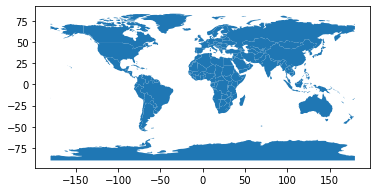

<IPython.core.display.Javascript object>

In [13]:
world = geopandas.read_file(geopandas.datasets.get_path("naturalearth_lowres"))
world.head()
world.plot()

In [14]:
# File from http://geojson.xyz/

url = "https://d2ad6b4ur7yvpq.cloudfront.net/naturalearth-3.3.0/ne_110m_admin_1_states_provinces_shp.geojson"
df_states = geopandas.read_file(url)

df_CA = df_states[df_states["name"] == "California"]
df_CA.head()

,scalerank,adm1_code,diss_me,adm1_cod_1,iso_3166_2,wikipedia,sr_sov_a3,sr_adm0_a3,iso_a2,adm0_sr,...,area_sqkm,sameascity,labelrank,featurec_1,admin,name_len,mapcolor9,mapcolor13,featureclass,geometry
7,2,USA-3521,3521,USA-3521,US-CA,http://en.wikipedia.org/wiki/California,US1,USA,US,8,...,0,-99,0,Admin-1 scale rank,United States of America,10,1,1,Admin-1 scale rank,"POLYGON ((-114.35490 34.46467, -114.16597 34.2..."


<IPython.core.display.Javascript object>

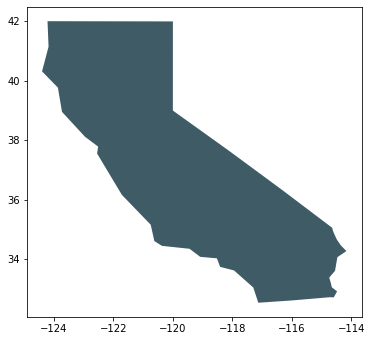

<IPython.core.display.Javascript object>

In [15]:
f, ax1 = plt.subplots(figsize=(6, 6))
df_CA.plot(ax=ax1, color=B_slate)

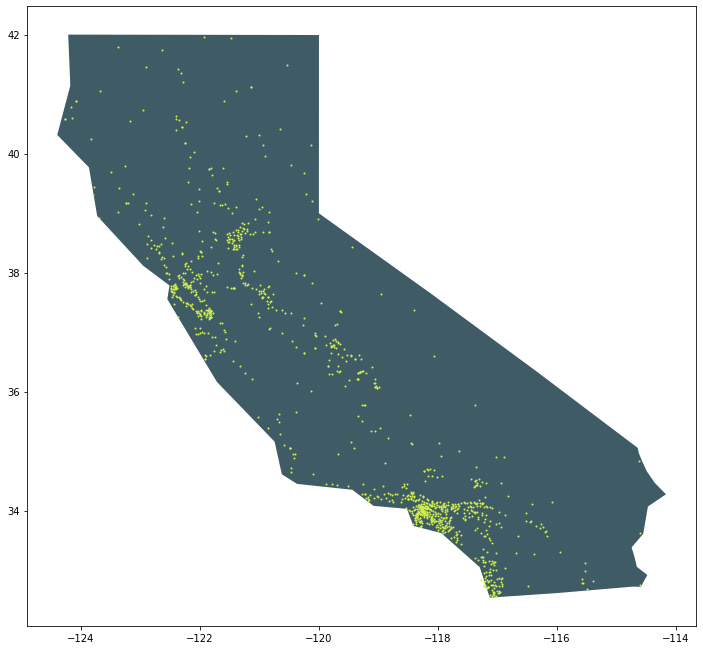

<IPython.core.display.Javascript object>

In [16]:
f, ax1 = plt.subplots(figsize=(12, 12))
df_CA.plot(ax=ax1, color=B_slate)
ax1.scatter(pd.to_numeric(df_wgeo["Longitude"]), pd.to_numeric(df_wgeo["Latitude"]), c=B_lime, s=2**0)


In [17]:
df_wgeo.columns[-20:]

Index(['%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 18 yrs and up',
       '%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 18-64 yrs',
       '%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up',
       '%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up - People in families',
       '%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up - Unrelated individuals 15 yrs and up',
       'E9', 'E10', 'E11', 'E12', 'ETOT', 'pct_nonLI_students',
       'est_LI_grade12_students', 'est_nonLI_grade12_students',
       'est_UCCSU_eligible_all', 'est_UCCSU_eligible_LI',
       'est_UCCSU_eligible_nonLI',
       'graduation_rates_UCCSU_eligibility_nonLIstudents',
       'Magnet_cat_encoded', 'Charter_cat_encoded',
       'nonLI-LI_UCCSU_eligibility_gap'],
      dtype='object')

<IPython.core.display.Javascript object>

''

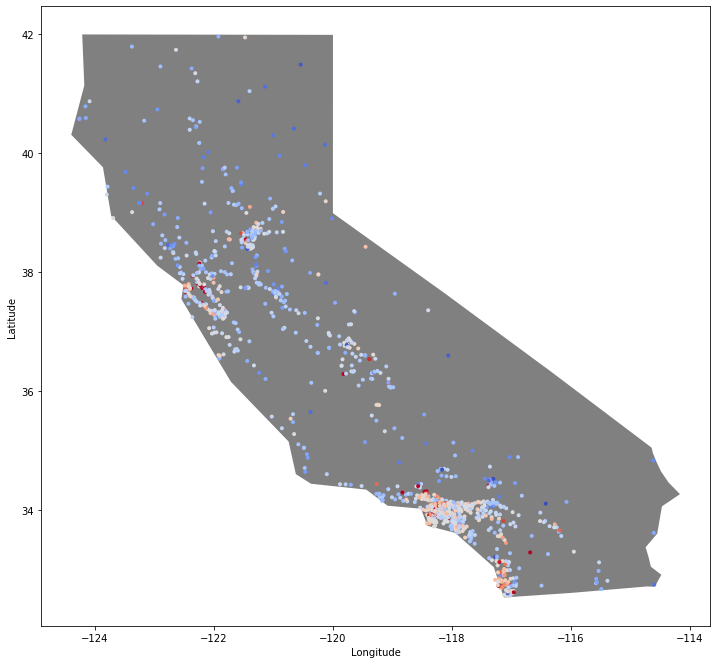

<IPython.core.display.Javascript object>

In [18]:
f, ax1 = plt.subplots(figsize=(12, 12))
df_CA.plot(ax=ax1, color='gray')
# ax1.scatter(pd.to_numeric(df_wgeo["Longitude"]), pd.to_numeric(df_wgeo["Latitude"]), c=pd.to_numeric(df_wgeo["Latitude"], s=2**0)
g = sns.scatterplot(
    data=df_wgeo,
    x="Longitude",
    y="Latitude",
    palette="coolwarm",
    hue="graduation_rates_UCCSU_eligibility_LIstudents",
    s=2 ** 4,
    ax=ax1,
    legend=None,
    #legend='brief',
    linewidth=0
)

#g._legend.set_title('SPLICE')
;


''

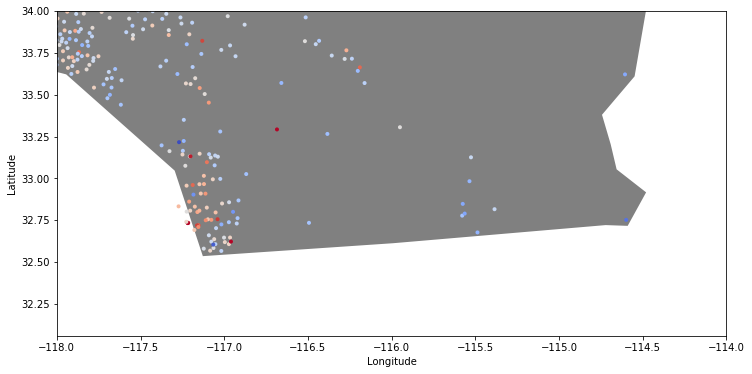

<IPython.core.display.Javascript object>

In [19]:
f, ax1 = plt.subplots(figsize=(12, 12))
df_CA.plot(ax=ax1, color='gray')
# ax1.scatter(pd.to_numeric(df_wgeo["Longitude"]), pd.to_numeric(df_wgeo["Latitude"]), c=pd.to_numeric(df_wgeo["Latitude"], s=2**0)
g = sns.scatterplot(
    data=df_wgeo,
    x="Longitude",
    y="Latitude",
    palette="coolwarm",
    hue="graduation_rates_UCCSU_eligibility_LIstudents",
    s=2 ** 4,
    ax=ax1,
    legend=None,
    #legend='brief',
    linewidth=0
)

#g._legend.set_title('SPLICE')

ax1.set_xlim([-118, -114])
ax1.set_ylim([None, 34])
;


### Adding zip code boundaries

geojson file?
https://catalog.data.gov/dataset/zip-codetabilation-area-boundaries/resource/ea476dcb-4846-4242-9fb3-d41afb13bf52


shape file
https://earthworks.stanford.edu/catalog/stanford-dc841dq9031

In [20]:
from shapely.geometry import Point, Polygon

<IPython.core.display.Javascript object>

In [21]:
zip_shapefile_loc = "data/zipcode_shapefile/data/ZCTA2010.shp"
zip_shapefile = geopandas.read_file(zip_shapefile_loc)
zip_shapefile.head()

,OBJECTID,CNTY_FIPS,COUNTY,TRACT,TRACT_ID,CENSUS_KEY,ZCTA,ZCTA_KEY,LATITUDE,LONGITUDE,...,HU_VAC,HU_VAC_REN,HU_VAC_SEA,HU_OCC_OWN,HU_OCC_O_1,HU_OCC_REN,HU_OCC_R_1,Shape_area,Shape_len,geometry
0,1,None,None,None,None,None,94601,0694601,37.776711,-122.218378,...,1536,839,28,4764,16528,10062,32927,8.721649e+06,15265.093880,"POLYGON ((-195843.682 -22645.035, -195822.040 ..."
1,2,None,None,None,None,None,94501,0694501,37.774084,-122.278049,...,2062,885,189,10286,26023,14739,32705,2.954478e+07,27119.154912,"POLYGON ((-201604.187 -25728.139, -202894.954 ..."
2,3,None,None,None,None,None,94560,0694560,37.520360,-122.031000,...,442,170,17,8942,28489,4030,13939,3.581839e+07,30752.336176,"POLYGON ((-181289.671 -49924.408, -181237.554 ..."
3,4,None,None,None,None,None,94587,0694587,37.603151,-122.018626,...,825,384,39,13580,46272,6853,22726,5.107510e+07,53110.314427,"POLYGON ((-182052.317 -43764.050, -182037.584 ..."
4,5,None,None,None,None,None,94580,0694580,37.676958,-122.133606,...,334,116,15,6105,18760,2519,8252,8.946896e+06,20260.685185,"POLYGON ((-187567.889 -34790.577, -187565.018 ..."


<IPython.core.display.Javascript object>

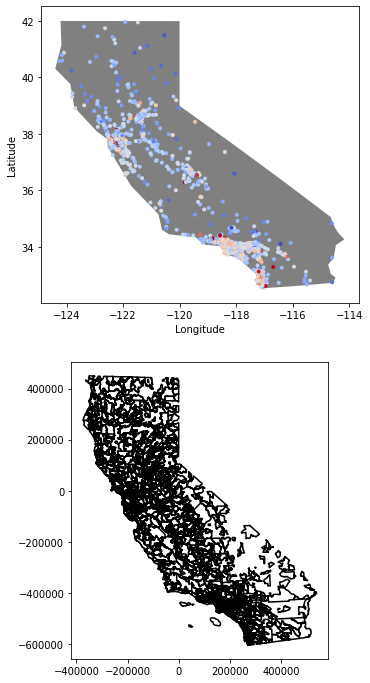

<IPython.core.display.Javascript object>

In [22]:
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(24, 12))
df_CA.plot(ax=ax1, color='gray')


# ax1.scatter(pd.to_numeric(df_wgeo["Longitude"]), pd.to_numeric(df_wgeo["Latitude"]), c=pd.to_numeric(df_wgeo["Latitude"], s=2**0)
g = sns.scatterplot(
    data=df_wgeo,
    x="Longitude",
    y="Latitude",
    palette="coolwarm",
    hue="graduation_rates_UCCSU_eligibility_LIstudents",
    s=2 ** 4,
    ax=ax1,
    legend=None,
    #legend='brief',
    linewidth=0
)

zip_shapefile.boundary.plot(ax=ax2, edgecolor='k', facecolor='none')


#g._legend.set_title('SPLICE')



It was not overlaying (see x and y axis values). I looked around and found [this page](https://stackoverflow.com/questions/56859435/geopandas-geodata-not-overlapping-shapefile-map).

I checked crs for both and they're different.

In [23]:
df_CA.crs, zip_shapefile.crs

({'init': 'epsg:4326'}, {'init': 'epsg:3310'})

<IPython.core.display.Javascript object>

In [25]:
# Make the second plot crs the same as the first
# zip_shapefile.to_crs(epsg="4326", inplace=True)

# New syntax
zip_shapefile.to_crs("epsg:4326", inplace=True)

/Users/lacar/anaconda/envs/insight/lib/python3.6/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


<IPython.core.display.Javascript object>

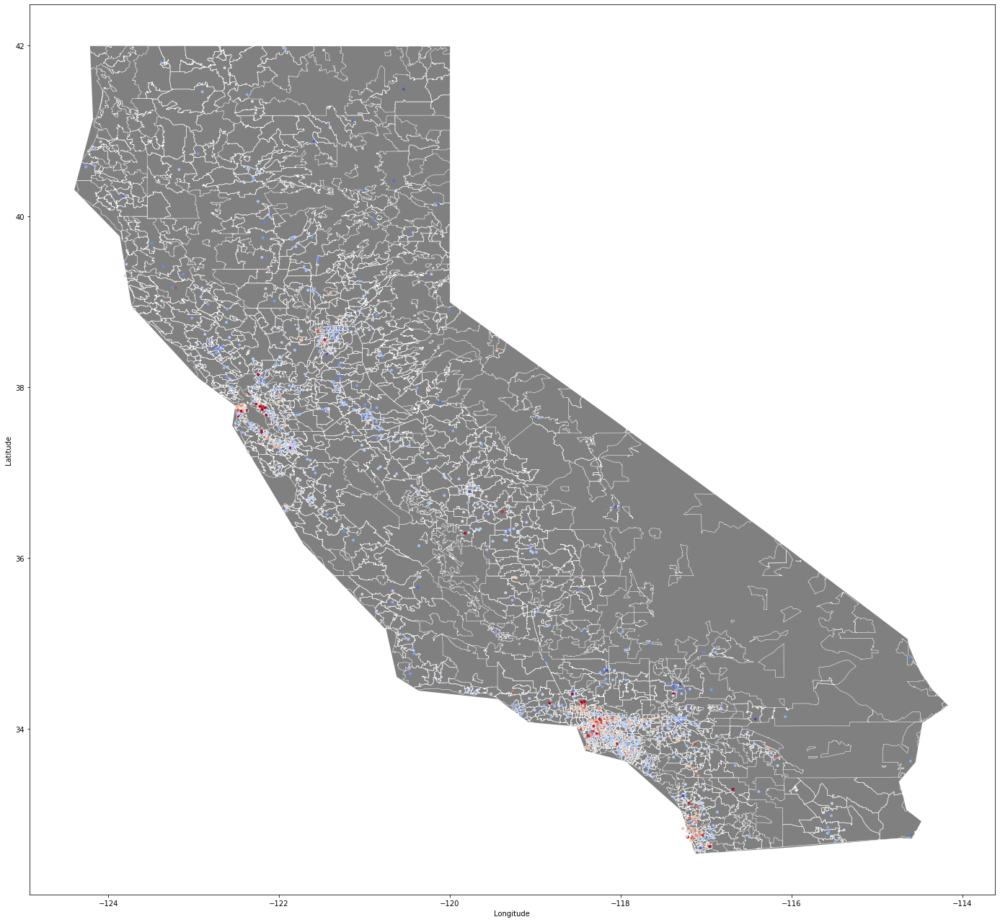

<IPython.core.display.Javascript object>

In [26]:
# Try again

f, (ax1) = plt.subplots(1, 1, figsize=(24, 24))
df_CA.plot(ax=ax1, color='gray', zorder=1)

zip_shapefile.boundary.plot(ax=ax1, edgecolor='white', linewidth=0.5, facecolor='none', zorder=2);

# ax1.scatter(pd.to_numeric(df_wgeo["Longitude"]), pd.to_numeric(df_wgeo["Latitude"]), c=pd.to_numeric(df_wgeo["Latitude"], s=2**0)
g = sns.scatterplot(
    data=df_wgeo,
    x="Longitude",
    y="Latitude",
    palette="coolwarm",
    hue="graduation_rates_UCCSU_eligibility_LIstudents",
    s=2 ** 4,
    ax=ax1,
    legend=None,
    #legend='brief',
    linewidth=0,
    zorder=3
)




#g._legend.set_title('SPLICE')



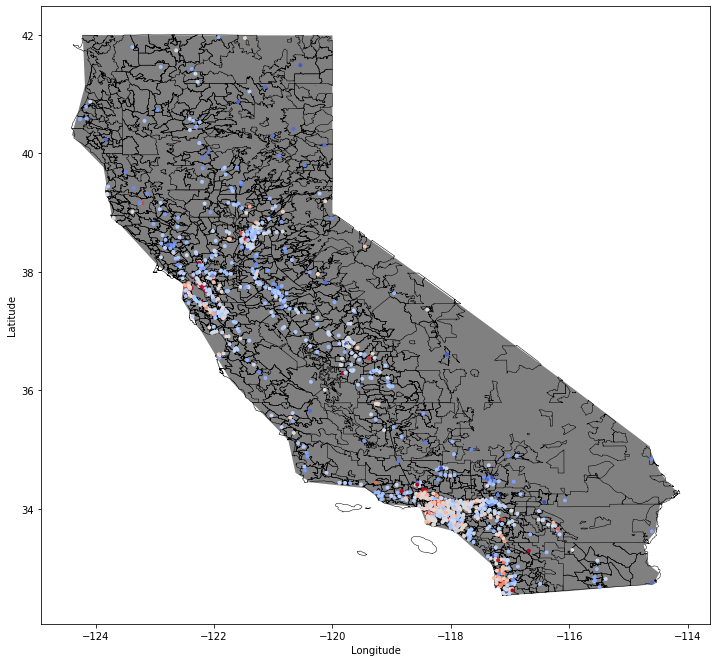

<IPython.core.display.Javascript object>

In [27]:
f, (ax1) = plt.subplots(1, 1, figsize=(12, 12))
df_CA.plot(ax=ax1, color='gray', zorder=1)

zip_shapefile.boundary.plot(ax=ax1, edgecolor='k', linewidth=0.5, facecolor='none', zorder=2);

# ax1.scatter(pd.to_numeric(df_wgeo["Longitude"]), pd.to_numeric(df_wgeo["Latitude"]), c=pd.to_numeric(df_wgeo["Latitude"], s=2**0)
g = sns.scatterplot(
    data=df_wgeo,
    x="Longitude",
    y="Latitude",
    palette="coolwarm",
    hue="graduation_rates_UCCSU_eligibility_LIstudents",
    s=2 ** 4,
    ax=ax1,
    legend=None,
    #legend='brief',
    linewidth=0,
    zorder=3
)

#g._legend.set_title('SPLICE')

### Plot for economic characteristics

In [28]:
df_state_info_gs_census["zip_code"].head()

0    94612
1    94501
2    94621
3    94621
4    94706
Name: zip_code, dtype: int64

<IPython.core.display.Javascript object>

In [29]:
df_state_info_gs_census["Latitude"].unique().max()

41.964149

<IPython.core.display.Javascript object>

In [30]:
# from above
[print(i) for i in census_col_final]

NameError: name 'census_col_final' is not defined

<IPython.core.display.Javascript object>

In [713]:
df_state_info_gs_census_ziponly = df_state_info_gs_census[
    ["zip_code"] + census_col_final
].drop_duplicates()

<IPython.core.display.Javascript object>

In [693]:
zip_shapefile.shape

(1769, 86)

<IPython.core.display.Javascript object>

In [696]:
zip_shapefile.head(5)

,OBJECTID,CNTY_FIPS,COUNTY,TRACT,TRACT_ID,CENSUS_KEY,ZCTA,ZCTA_KEY,LATITUDE,LONGITUDE,...,HU_VAC,HU_VAC_REN,HU_VAC_SEA,HU_OCC_OWN,HU_OCC_O_1,HU_OCC_REN,HU_OCC_R_1,Shape_area,Shape_len,geometry
0,1,None,None,None,None,None,94601,0694601,37.776711,-122.218378,...,1536,839,28,4764,16528,10062,32927,8.721649e+06,15265.093880,"POLYGON ((-122.22717 37.79197, -122.22693 37.7..."
1,2,None,None,None,None,None,94501,0694501,37.774084,-122.278049,...,2062,885,189,10286,26023,14739,32705,2.954478e+07,27119.154912,"POLYGON ((-122.29181 37.76301, -122.30661 37.7..."
2,3,None,None,None,None,None,94560,0694560,37.520360,-122.031000,...,442,170,17,8942,28489,4030,13939,3.581839e+07,30752.336176,"POLYGON ((-122.05499 37.54960, -122.05441 37.5..."
3,4,None,None,None,None,None,94587,0694587,37.603151,-122.018626,...,825,384,39,13580,46272,6853,22726,5.107510e+07,53110.314427,"POLYGON ((-122.06515 37.60485, -122.06499 37.6..."
4,5,None,None,None,None,None,94580,0694580,37.676958,-122.133606,...,334,116,15,6105,18760,2519,8252,8.946896e+06,20260.685185,"POLYGON ((-122.12999 37.68445, -122.12995 37.6..."


<IPython.core.display.Javascript object>

In [695]:
[print(col) for col in zip_shapefile.columns.tolist()]

OBJECTID
CNTY_FIPS
COUNTY
TRACT
TRACT_ID
CENSUS_KEY
ZCTA
ZCTA_KEY
LATITUDE
LONGITUDE
TOT_POP
AGE_UNDER5
AGE_5TO9
AGE_10TO14
AGE_15TO19
AGE_20TO24
AGE_25TO29
AGE_30TO34
AGE_35TO39
AGE_40TO44
AGE_45TO49
AGE_50TO54
AGE_55TO59
AGE_60TO64
AGE_65TO69
AGE_70TO74
AGE_75TO79
AGE_80TO84
AGE_85_OVE
AGE16_OVER
AGE18_OVER
AGE21_OVER
AGE62_OVER
AGE65_OVER
MALE
FEMALE
AGE_MEDIAN
AGE_MEDI_1
AGE_MEDI_2
ONE_RACE
WHITE
BLACK_AFAM
AMIND_ALAN
ASIAN
NATHAW_ISL
OTHER_RACE
MULTI_RACE
HISPANIC_L
NON_HISP_L
WHITE_NHL
BLACK_AF_1
AMIND_AL_1
ASIAN_NHL
NATHAW_I_1
OTHER_NHL
MULTI_RA_1
TOT_IN_HOU
TOT_IN_GC
GC_INST
GC_NONINST
GC_CORRECT
GC_JUV
GC_NURS
GC_OTHER
HH_TOTAL
HH_FAMILY
HH_NONFAML
HH_NONFAMI
HH_NONFA_1
HH_NONFA_2
HH_NONFA_3
HH_NONFA_4
HH_WITH_UN
HH_WITH_65
HU_TOTAL
HU_OCC
HU_VAC
HU_VAC_REN
HU_VAC_SEA
HU_OCC_OWN
HU_OCC_O_1
HU_OCC_REN
HU_OCC_R_1
Shape_area
Shape_len
geometry


[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

<IPython.core.display.Javascript object>

In [725]:
type(zip_shapefile)

geopandas.geodataframe.GeoDataFrame

<IPython.core.display.Javascript object>

In [726]:
type(df_state_census_wgeo)

pandas.core.frame.DataFrame

<IPython.core.display.Javascript object>

In [721]:
zip_shapefile["ZCTA"] = pd.to_numeric(zip_shapefile["ZCTA"])
feat2plot = "Est.; INCOME_BENEFITS - Total households - Median household income ($)"
df_state_census_wgeo = pd.merge(
    df_state_info_gs_census_ziponly[['zip_code', feat2plot]], zip_shapefile, left_on="zip_code", right_on="ZCTA"
)
df_state_census_wgeo.head()

,zip_code,Est.; INCOME_BENEFITS - Total households - Median household income ($),OBJECTID,CNTY_FIPS,COUNTY,TRACT,TRACT_ID,CENSUS_KEY,ZCTA,ZCTA_KEY,...,HU_VAC,HU_VAC_REN,HU_VAC_SEA,HU_OCC_OWN,HU_OCC_O_1,HU_OCC_REN,HU_OCC_R_1,Shape_area,Shape_len,geometry
0,94612,32993.0,736,None,None,None,None,None,94612,0694612,...,953,572,38,642,1172,7326,11997,2.205249e+06,11539.060839,"POLYGON ((-122.27449 37.80389, -122.27473 37.8..."
1,94501,72884.0,2,None,None,None,None,None,94501,0694501,...,2062,885,189,10286,26023,14739,32705,2.954478e+07,27119.154912,"POLYGON ((-122.29181 37.76301, -122.30661 37.7..."
2,94621,31903.0,1322,None,None,None,None,None,94621,0694621,...,1216,683,10,3111,11368,5362,18192,2.473526e+07,35852.648016,"POLYGON ((-122.20084 37.76913, -122.20018 37.7..."
3,94706,80970.0,737,None,None,None,None,None,94706,0694706,...,514,260,44,3918,9839,3997,9726,3.823563e+06,9233.319582,"POLYGON ((-122.29886 37.89847, -122.29869 37.8..."
4,94566,122260.0,733,None,None,None,None,None,94566,0694566,...,511,194,68,10625,30497,4193,9987,5.118346e+07,41094.156479,"POLYGON ((-121.87705 37.68602, -121.87673 37.6..."


<IPython.core.display.Javascript object>

In [737]:
zip_shapefile["ZCTA"] = pd.to_numeric(zip_shapefile["ZCTA"])
feat2plot = "Est.; INCOME_BENEFITS - Total households - Median household income ($)"


zip_shapefile_wfeat = zip_shapefile.set_index('ZCTA').join(df_state_info_gs_census_ziponly[['zip_code', feat2plot]].set_index('zip_code'),
                                         how='left')

type(zip_shapefile_wfeat)

zip_shapefile_wfeat.head()

# Can't do a merge - do a join

# df_state_census_wgeo = pd.merge(
#     df_state_info_gs_census_ziponly[['zip_code', feat2plot]], zip_shapefile, how='right', left_on="zip_code", right_on="ZCTA"
# )
# df_state_census_wgeo.head()

# h_cb_tract_join_SD = h_cb_tract.join(SD_ca_census_df_simplified, how='left',on='tract_convert')


,OBJECTID,CNTY_FIPS,COUNTY,TRACT,TRACT_ID,CENSUS_KEY,ZCTA_KEY,LATITUDE,LONGITUDE,TOT_POP,...,HU_VAC_REN,HU_VAC_SEA,HU_OCC_OWN,HU_OCC_O_1,HU_OCC_REN,HU_OCC_R_1,Shape_area,Shape_len,geometry,Est.; INCOME_BENEFITS - Total households - Median household income ($)
ZCTA,,,,,,,,,,,,,,,,,,,,,
94601,1,None,None,None,None,None,0694601,37.776711,-122.218378,50294,...,839,28,4764,16528,10062,32927,8.721649e+06,15265.093880,"POLYGON ((-122.22717 37.79197, -122.22693 37.7...",39184.0
94501,2,None,None,None,None,None,0694501,37.774084,-122.278049,60212,...,885,189,10286,26023,14739,32705,2.954478e+07,27119.154912,"POLYGON ((-122.29181 37.76301, -122.30661 37.7...",72884.0
94560,3,None,None,None,None,None,0694560,37.520360,-122.031000,42573,...,170,17,8942,28489,4030,13939,3.581839e+07,30752.336176,"POLYGON ((-122.05499 37.54960, -122.05441 37.5...",86757.0
94587,4,None,None,None,None,None,0694587,37.603151,-122.018626,69516,...,384,39,13580,46272,6853,22726,5.107510e+07,53110.314427,"POLYGON ((-122.06515 37.60485, -122.06499 37.6...",85521.0
94580,5,None,None,None,None,None,0694580,37.676958,-122.133606,27152,...,116,15,6105,18760,2519,8252,8.946896e+06,20260.685185,"POLYGON ((-122.12999 37.68445, -122.12995 37.6...",71120.0


<IPython.core.display.Javascript object>

In [700]:
[print(col) for col in df_state_info_gs_census_wgeo]

Unnamed: 0
CDSCode
NCESDist
NCESSchool
StatusType
County
District
School
Street
StreetAbr
City
Zip
State
MailStreet
MailStrAbr
MailCity
MailZip
MailState
Phone
Ext
WebSite
OpenDate
ClosedDate
Charter
CharterNum
FundingType
DOC
DOCType
SOC
SOCType
EdOpsCode
EdOpsName
EILCode
EILName
GSoffered
GSserved
Virtual
Magnet
YearRoundYN
FederalDFCDistrictID
Latitude
Longitude
AdmFName1
AdmLName1
AdmEmail1
AdmFName2
AdmLName2
AdmEmail2
AdmFName3
AdmLName3
AdmEmail3
LastUpDate
zip_code
gsId
name
type
gradeRange
enrollment
gsRating
parentRating
city
state
districtId
district
districtNCESId
address
phone
fax
website
ncesId
lat
lon
overviewLink
ratingsLink
reviewsLink
schoolStatsLink
college_readiness
test_scores
advanced_courses
equity_overview
race_ethnicity
low_income
disabilities
students_per_teacher
students_per_counselor
pct_teachers_3years_or_more
pct_teachers_who_r_certified
avg_teacher_salary
test_score_rating_allStudents
test_score_rating_LIstudents
test_score_rating_notLIstudents
test_scor

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

<IPython.core.display.Javascript object>

invalid value encountered in less


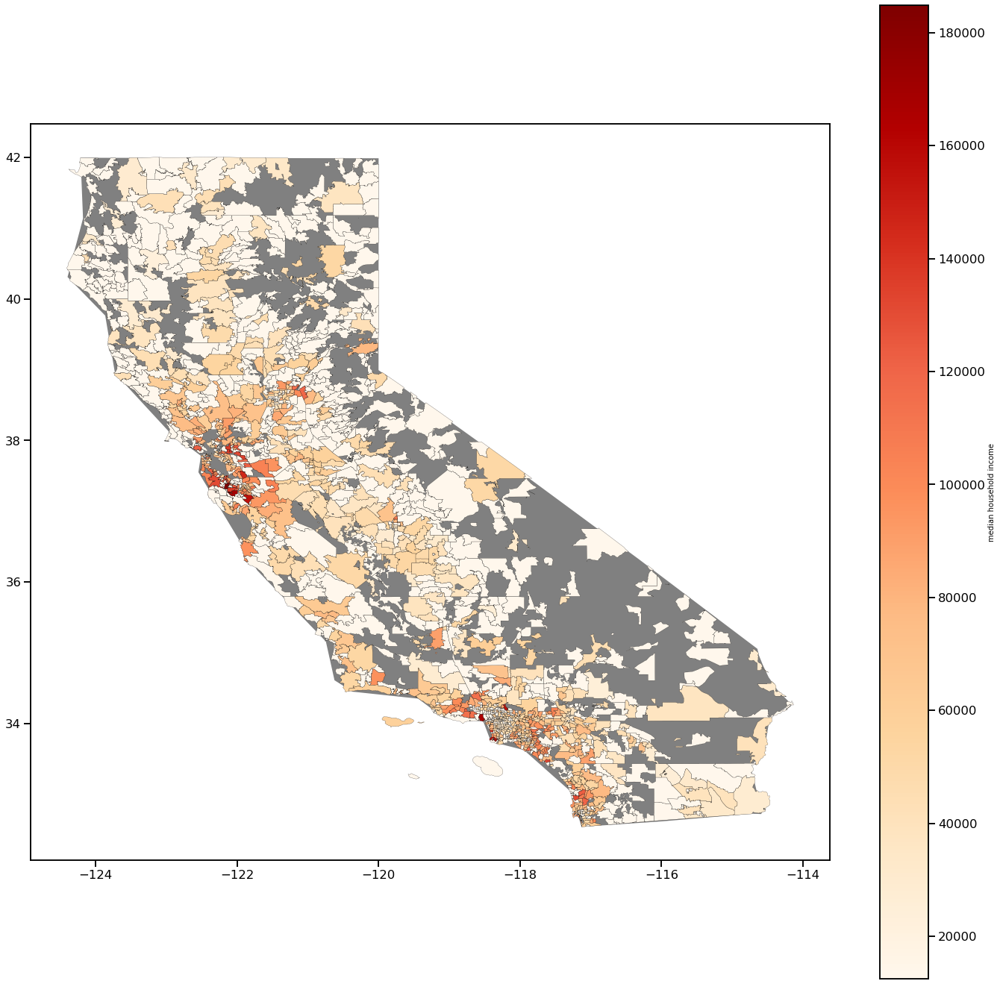

<IPython.core.display.Javascript object>

In [746]:
f, (ax1) = plt.subplots(1, 1, figsize=(24, 24))
df_CA.plot(ax=ax1, color='gray', zorder=1)

# zip_shapefile.boundary.plot(ax=ax1, edgecolor='k', linewidth=0.5, facecolor='none', zorder=2);

# ax1.scatter(pd.to_numeric(df_wgeo["Longitude"]), pd.to_numeric(df_wgeo["Latitude"]), c=pd.to_numeric(df_wgeo["Latitude"], s=2**0)

zip_shapefile_wfeat.plot(column=feat2plot,
                     ax=ax1,
                     legend=True,
                     edgecolor='black',
                     cmap='OrRd',
                     linewidth = 0.2,
                     legend_kwds={'label':"median household income", 'orientation': "vertical"})
                                  



In [766]:
zip_shapefile_wfeat.loc[[92037, 92091, 91902, 94080, 94303], :]

,OBJECTID,CNTY_FIPS,COUNTY,TRACT,TRACT_ID,CENSUS_KEY,ZCTA_KEY,LATITUDE,LONGITUDE,TOT_POP,...,HU_VAC_REN,HU_VAC_SEA,HU_OCC_OWN,HU_OCC_O_1,HU_OCC_REN,HU_OCC_R_1,Shape_area,Shape_len,geometry,Est.; INCOME_BENEFITS - Total households - Median household income ($)
ZCTA,,,,,,,,,,,,,,,,,,,,,
92037,164,None,None,None,None,None,0692037,32.856552,-117.252008,46781,...,505,1528,10314,23016,7198,14751,3.909865e+07,42239.295039,"POLYGON ((-117.28240 32.82618, -117.28255 32.8...",96220.0
92091,1471,None,None,None,None,None,0692091,33.011267,-117.211062,1048,...,8,41,432,826,116,222,1.697776e+06,11112.988547,"MULTIPOLYGON (((-117.20909 32.99667, -117.2090...",NaN
91902,1078,None,None,None,None,None,0691902,32.667019,-117.018255,17653,...,50,40,4581,13402,1375,4209,2.331815e+07,34451.954078,"POLYGON ((-117.03915 32.67309, -117.03918 32.6...",NaN
94080,702,None,None,None,None,None,0694080,37.655568,-122.422162,63975,...,347,95,12702,38076,8359,25372,2.690642e+07,34662.954980,"POLYGON ((-122.41132 37.63634, -122.41135 37.6...",81455.0
94303,1732,None,None,None,None,None,0694303,37.450755,-122.118532,45467,...,722,35,7671,25606,5567,19684,2.251544e+07,30386.096521,"POLYGON ((-122.14454 37.46083, -122.14521 37.4...",89862.0


<IPython.core.display.Javascript object>

In [778]:
bay_area_counties = [
    "San Francisco",
    "San Mateo",
    "Santa Clara",
    "Alameda",
    "Fremont",
    "Marin",
]

county_df = df_state_info_gs_census[
    df_state_info_gs_census["County"].isin(bay_area_counties)
].copy()


ba_lat_min, ba_lat_max, ba_long_min, ba_long_max = (
    county_df["Latitude"].min(),
    county_df["Latitude"].max(),
    county_df["Longitude"].min(),
    county_df["Longitude"].max(),
)
ba_lat_min, ba_lat_max, ba_long_min, ba_long_max

(36.997203000000006, 38.247656, -122.89528, -119.64223)

<IPython.core.display.Javascript object>

In [779]:
county_df = df_state_info_gs_census[
    df_state_info_gs_census["County"] == "Los Angeles"
].copy()

la_lat_min, la_lat_max, la_long_min, la_long_max = (
    county_df["Latitude"].min(),
    county_df["Latitude"].max(),
    county_df["Longitude"].min(),
    county_df["Longitude"].max(),
)
la_lat_min, la_lat_max, la_long_min, la_long_max

(33.73059, 34.69911, -118.74948, -117.71965)

<IPython.core.display.Javascript object>

In [781]:
county_df = df_state_info_gs_census[
    df_state_info_gs_census["County"] == "San Diego"
].copy()

sd_lat_min, sd_lat_max, sd_long_min, sd_long_max = (
    float(county_df["Latitude"].min()),
    float(county_df["Latitude"].max()),
    float(county_df["Longitude"].min()),
    float(county_df["Longitude"].max()),
)
sd_lat_min, sd_lat_max, sd_long_min, sd_long_max

(32.566438, 33.349505, -117.37414, -116.38373)

<IPython.core.display.Javascript object>

invalid value encountered in less
invalid value encountered in less
invalid value encountered in less
invalid value encountered in less


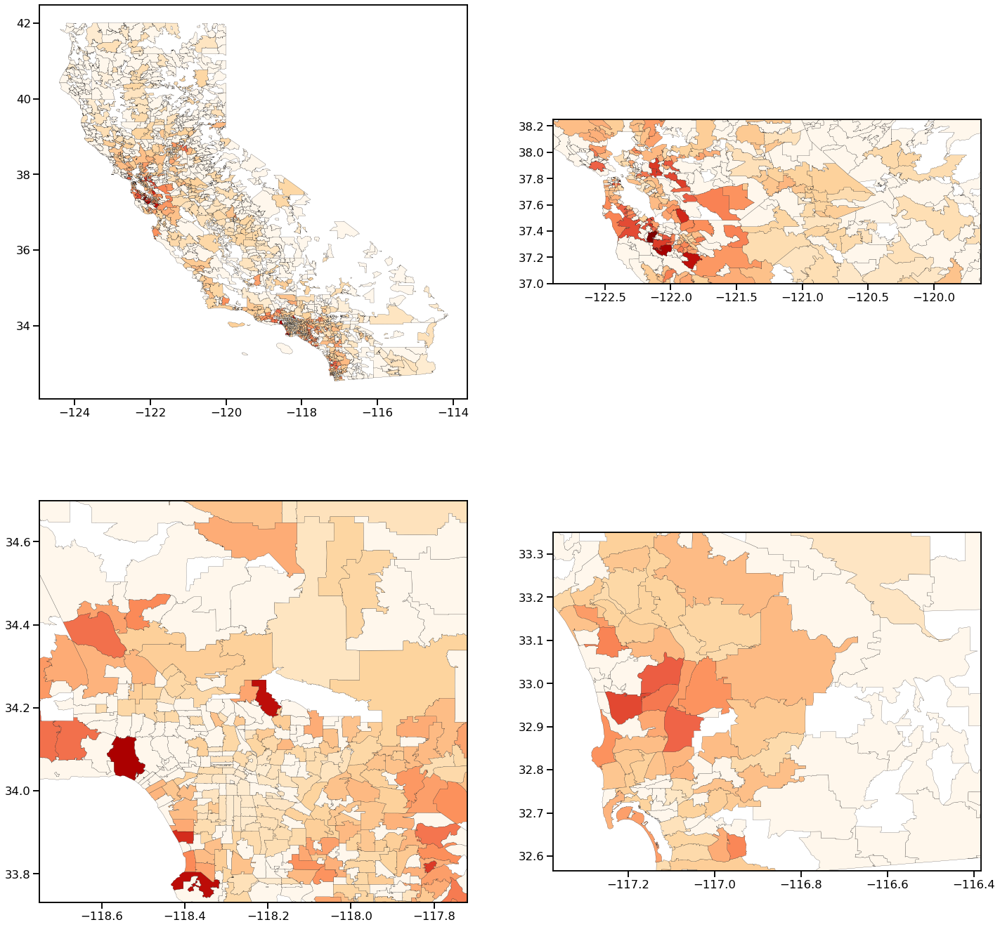

<IPython.core.display.Javascript object>

In [784]:
f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(24, 24))

# CA
# df_CA.plot(ax=ax1, color="gray", zorder=1)
zip_shapefile_wfeat.plot(
    column=feat2plot,
    ax=ax1,
    # legend=True,
    edgecolor="black",
    cmap="OrRd",
    linewidth=0.2,
    # legend_kwds={"label": "median household income", "orientation": "vertical"},
)

# Bay Area
df_CA.plot(ax=ax2, color="white", zorder=1)
zip_shapefile_wfeat.plot(
    column=feat2plot,
    ax=ax2,
    # legend=True,
    edgecolor="black",
    cmap="OrRd",
    linewidth=0.2,
    # legend_kwds={"label": "median household income", "orientation": "vertical"},
)
ax2.set_xlim([ba_long_min, ba_long_max])
ax2.set_ylim([ba_lat_min, ba_lat_max])


# LA
df_CA.plot(ax=ax3, color="white", zorder=1)
zip_shapefile_wfeat.plot(
    column=feat2plot,
    ax=ax3,
    # legend=True,
    edgecolor="black",
    cmap="OrRd",
    linewidth=0.2,
    # legend_kwds={"label": "median household income", "orientation": "vertical"},
)
ax3.set_xlim([la_long_min, la_long_max])
ax3.set_ylim([la_lat_min, la_lat_max])


# SD
df_CA.plot(ax=ax4, color="white", zorder=1)
zip_shapefile_wfeat.plot(
    column=feat2plot,
    ax=ax4,
    # legend=True,
    edgecolor="black",
    cmap="OrRd",
    linewidth=0.2,
    # legend_kwds={"label": "median household income", "orientation": "vertical"},
)

ax4.set_xlim([sd_long_min, sd_long_max])
ax4.set_ylim([sd_lat_min, sd_lat_max])

### Different CA

The one I got originally does not have good definition for the Bay Area.

In [683]:
# File from http://geojson.xyz/

url = "https://d2ad6b4ur7yvpq.cloudfront.net/naturalearth-3.3.0/ne_110m_admin_1_states_provinces_scale_rank.geojson"
df_states = geopandas.read_file(url)
df_states.head()
# df_CA2 = df_states[df_states["name"] == "California"]
# df_CA2.head()

,scalerank,adm1_code,featureclass,geometry
0,2,USA-3514,Admin-1 scale rank,"POLYGON ((-89.59941 48.01027, -89.48888 48.013..."
1,2,USA-3515,Admin-1 scale rank,"POLYGON ((-111.19419 44.56116, -111.29155 44.7..."
2,2,USA-3516,Admin-1 scale rank,"POLYGON ((-96.60136 46.35136, -96.53891 46.199..."
3,2,USA-3517,Admin-1 scale rank,"MULTIPOLYGON (((-155.93665 19.05939, -155.9080..."
4,2,USA-3518,Admin-1 scale rank,"POLYGON ((-111.04973 44.48816, -111.05024 42.0..."


<IPython.core.display.Javascript object>

In [681]:
df_states

,scalerank,name,adm0_a3,adm0_name,mapcolor9,mapcolor13,featureclass,geometry
0,2,None,USA,United States of America,1,1,Admin-1 boundary,"LINESTRING (-74.67903 41.35549, -74.84044 41.4..."
1,2,None,USA,United States of America,1,1,Admin-1 boundary,"LINESTRING (-87.59780 45.10629, -87.61292 45.1..."
2,2,None,USA,United States of America,1,1,Admin-1 boundary,"LINESTRING (-91.22820 43.50125, -91.25466 43.6..."
3,2,None,USA,United States of America,1,1,Admin-1 boundary,"LINESTRING (-80.51893 40.64111, -80.51627 41.9..."
4,2,None,USA,United States of America,1,1,Admin-1 boundary,"LINESTRING (-84.80676 41.67774, -84.29506 41.6..."
...,...,...,...,...,...,...,...,...
105,2,None,USA,United States of America,1,1,Admin-1 boundary,"LINESTRING (-114.03422 41.99312, -117.02825 42..."
106,2,None,USA,United States of America,1,1,Admin-1 boundary,"LINESTRING (-70.64573 43.09008, -70.81505 42.8..."
107,2,None,USA,United States of America,1,1,Admin-1 boundary,"LINESTRING (-70.64573 43.09008, -70.75102 43.0..."
108,2,None,USA,United States of America,1,1,Admin-1 boundary,"LINESTRING (-72.45707 42.72708, -71.24898 42.7..."


<IPython.core.display.Javascript object>

(-125, -115)

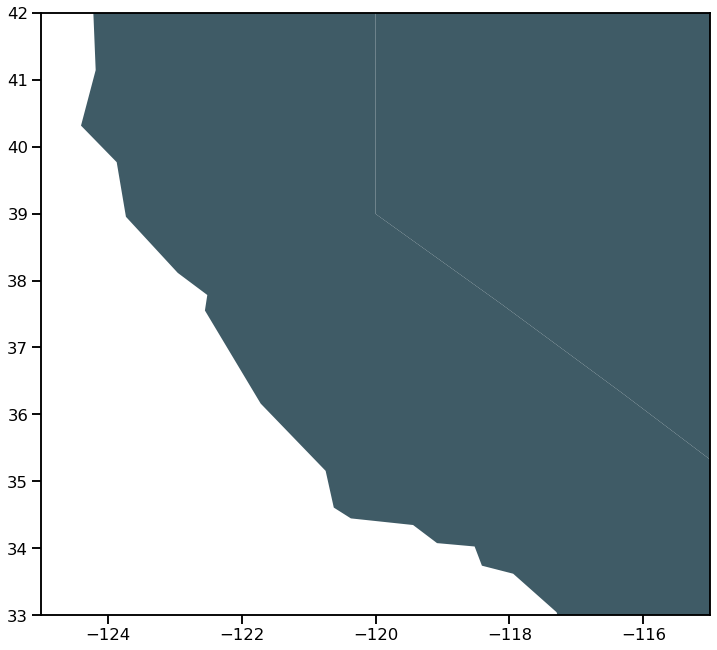

<IPython.core.display.Javascript object>

In [686]:
f, ax1 = plt.subplots(figsize=(12, 12))
df_states.plot(ax=ax1, color=B_slate)
ax1.set_ylim(33, 42)
ax1.set_xlim(-125, -115)

### Interactive plotting with bokeh

From [here](https://towardsdatascience.com/how-to-create-an-interactive-geographic-map-using-python-and-bokeh-12981ca0b567)

and [here](https://towardsdatascience.com/a-complete-guide-to-an-interactive-geographical-map-using-python-f4c5197e23e0)




In [31]:
from bokeh.io import output_notebook, show, output_file
from bokeh.plotting import figure
from bokeh.models import GeoJSONDataSource, LinearColorMapper, ColorBar
from bokeh.palettes import brewer

<IPython.core.display.Javascript object>

In [32]:
# Initialize the plot (p) and give it a title
In [1]: p = figure(title="My first interactive plot!")

# Let's see what it is
In [2]: p
Out[2]: Figure(id='437140a9-5262-49ba-94cc-0169a4887ce4', ...)

SyntaxError: positional argument follows keyword argument (<ipython-input-32-d56c5196ea03>, line 6)

<IPython.core.display.Javascript object>

## Conclusion and summary

This project identified features that are associated with low income student success. Some features have varying degrees of "actionability": some can be affected directly by policy changes, while others could be indirectly related.

For example, it is clear that schools where all students perform well (by college eligibility rates) is a significantly good predictor in how well their low income students are also doing. Superficially, it is not completely surprising, but it highlights how the right environment benefits all demographics of students.

Other features are not as influential but indicate that some public programs reap benefits. Communities where low income students do well receive some welfare benefits (in the form of supplemental and social security income) and have workers that use public transportation. Therefore policies that adversely affect the recipients of these programs might indirectly be detrimental to the school performance of their children or grandchildren.

It is also notable what features did *not* show benefits for low income student performance. While teacher salary was positively correlated with student performance, student-to-teacher ratio or whether teachers had 3 or more years of experience were not features that predicted whether a school was exceptionally performing. The magnet or charter status of a school were also not predictive features despite their perception. Of course, adding data from other states or evaluating schools longitudinally would help inform how robust these conclusions are.

New data would also be informative. For example, recently (October 2019) the state of [California will start mandating later high school start times](https://www.washingtonpost.com/opinions/students-need-more-sleep-good-for-california-for-giving-them-a-later-school-start/2019/10/18/f5dfc0d2-f047-11e9-8693-f487e46784aa_story.html). While the sleep benefits to students are clear, it is debatable whether this could disproportionately affect low income communities.

Other interesting data would be seeing whether and how much tech usage could be impactful. Do the schools encourage teachers and students to reference Khan Academy as lesson supplements? Or do they use Remind to facilitate communication?

## ---